In [58]:
!pip install "rtree>=0.8,<0.9"

You should consider upgrading via the 'pip install --upgrade pip' command.


In [2]:
import numpy as np
import cv2
import matplotlib.pyplot as plt
import json
import os

from tqdm.notebook import tqdm
from skimage.color import label2rgb
from glob import glob
%matplotlib inline

In [3]:
from labelme_utils import img_b64_to_arr
from annotations_utils import create_mask_from_points, get_random_string
from show_utils import show_image, subplot_images

## Labelme to data

In [434]:
# create directories
os.mkdir('./data/')
os.mkdir('./data/images/')
os.mkdir('./data/check_masks/')
os.mkdir('./data/pattern_masks')

annotation_paths = []
annotation_paths.extend(glob('./labelme_data/part2/*.json'))
annotation_paths.extend(glob('./labelme_data/part1/*.json'))
for annotation_path in tqdm(annotation_paths):
    with open(annotation_path) as F:
        annotation_data = json.loads(F.read())
    # convert labelme image format to np.array
    image = img_b64_to_arr(annotation_data['imageData'])
    # extract points
    check_points = [annotation['points'] for annotation in annotation_data['shapes']
                    if annotation['label'] == 'check']
    pattern_points = [annotation['points'] for annotation in annotation_data['shapes']
                      if annotation['label'] == 'pattern']
    # create image mask
    check_mask = create_mask_from_points(check_points, image.shape[:2]).clip(0, 1)
    pattern_mask = create_mask_from_points(pattern_points, image.shape[:2]).clip(0, 1)
    # save
    file_name = annotation_path.split('/')[-2] + '_' + annotation_path.split('/')[-1][:-5]
    cv2.imwrite('./data/images/' + file_name + '.jpg', image)
    cv2.imwrite('./data/check_masks/' + file_name + '.jpg', check_mask)
    cv2.imwrite('./data/pattern_masks/' + file_name + '.jpg', pattern_mask)

In [439]:
pattern_paths = glob('./data/pattern_masks/*')
for path in tqdm(pattern_paths):
    pattern_mask = cv2.imread(path, 2)
    gt_contours, hierarchy = cv2.findContours(pattern_mask, cv2.RETR_TREE, cv2.CHAIN_APPROX_SIMPLE)
    gt_contours = sorted(gt_contours, key=lambda contour: cv2.contourArea(contour), reverse=True)
    contour_mask = create_mask_from_points(gt_contours[0:3], pattern_mask.shape[:2]).clip(0, 1)
    cv2.imwrite(path , contour_mask)

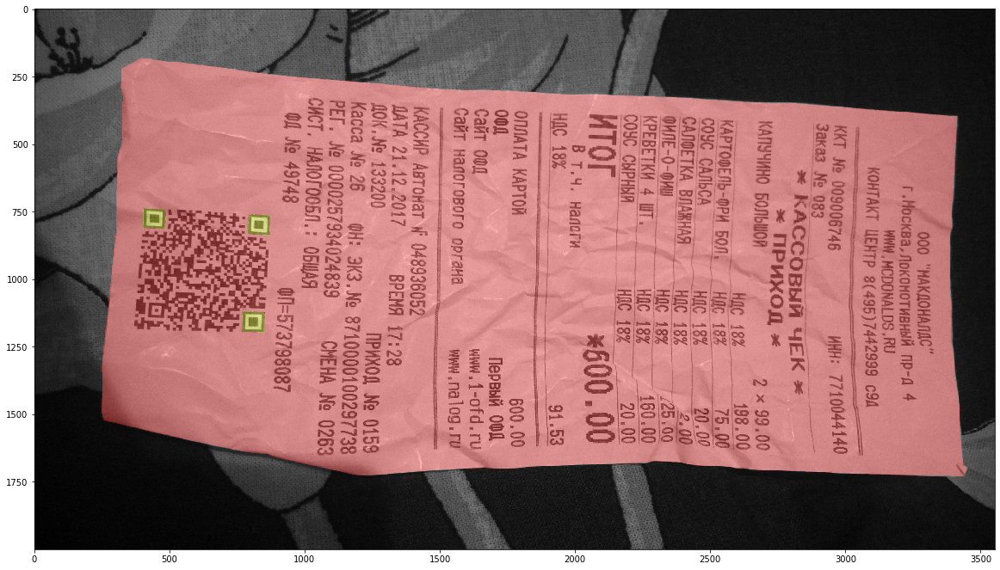

In [8]:
image = cv2.imread('./data/images/part2_0002.jpg')
check_mask = cv2.imread('./data/check_masks/part2_0002.jpg', 2)
pattern_mask = cv2.imread('./data/pattern_masks/part2_0002.jpg', 2)
show_image(label2rgb(check_mask + 2 * pattern_mask, image, bg_label=0))

### Train test split

In [4]:
from sklearn.model_selection import train_test_split

image_paths = sorted(glob('./data/images/*'))
mask_paths = sorted(glob('./data/pattern_masks/*'))
page_paths = sorted(glob('./data/check_masks/*'))

train_image_paths, test_image_paths, train_mask_paths, test_mask_paths, train_page_paths, test_page_paths = \
train_test_split(image_paths, mask_paths, page_paths, random_state=42, test_size=0.15)

train_image_paths, valid_image_paths, train_mask_paths, valid_mask_paths, train_page_paths, valid_page_paths = \
train_test_split(train_image_paths, train_mask_paths, train_page_paths, random_state=42, test_size=0.15)

print("train dataset size:", len(train_image_paths))
print("valid dataset size:", len(valid_image_paths))
print("test dataset size:", len(test_image_paths))

train dataset size: 67
valid dataset size: 12
test dataset size: 15


## Augmentations

In [5]:
import albumentations as albu
from albumentations.pytorch import ToTensor

def pre_transforms(image_size=800):
    return albu.Compose([
        albu.LongestMaxSize(image_size, cv2.INTER_LANCZOS4),
        albu.PadIfNeeded(image_size, image_size, border_mode=cv2.BORDER_CONSTANT)
    ])


def crop_transforms(size=800):
    result = albu.OneOf([albu.Compose(transforms=[albu.CropNonEmptyMaskIfExists(int(size/1.5), int(size/1.5), p=0.2),
                                       pre_transforms()]), 
           albu.Compose(transforms=[albu.CropNonEmptyMaskIfExists(int(size/1.5), size//2, p=0.2),
                                       pre_transforms()]),
           albu.Compose(transforms=[albu.CropNonEmptyMaskIfExists(size//2, int(size/1.5), p=0.2),
                                       pre_transforms()]),
           albu.Compose(transforms=[albu.CropNonEmptyMaskIfExists(size//2, size//2, p=0.2),
                                       pre_transforms()]),
          ], p=0.2)
    return result


def blur_transforms():
    result = [albu.Blur(p=0.1, blur_limit=7),
              albu.MedianBlur(p=0.1, blur_limit=5),
              albu.GaussianBlur(p=0.1, blur_limit=7),
              albu.MotionBlur(p=0.1, blur_limit=5),
              albu.Downscale(p=0.1, scale_min=0.5, scale_max=0.9, interpolation=cv2.INTER_LANCZOS4)]
    return result


def noise_transforms():
    result = [albu.GaussNoise(p=0.1, var_limit=(20, 80)),
              albu.JpegCompression(p=0.1, quality_lower=95),
              albu.IAAAdditiveGaussianNoise(p=0.05)]
    return result


def special_transforms():
    result = [
              albu.CLAHE(clip_limit=2, p=0.1),
              albu.IAASharpen(p=0.1),
              albu.IAAEmboss(p=0.1)
              ]
    return result


def rotate_transforms():
    result = [albu.RandomRotate90(p=0.1),
              albu.Rotate(20, p=0.2),
              albu.ShiftScaleRotate(shift_limit=0.1025, scale_limit=0.15, rotate_limit=45, p=0.1)]
    return result


def distortiot_transforms():
    result = [albu.GridDistortion(p=0.2),
              albu.IAAPiecewiseAffine(p=0.1),
              albu.OpticalDistortion(p=0.05, distort_limit=0.3, shift_limit=0.5),
              ]
    return result


def color_transforms():
    result = [albu.RandomBrightness(p=0.1),
              albu.RandomContrast(p=0.1),
              albu.RandomGamma(p=0.1),
              albu.RandomBrightnessContrast(brightness_limit=0.2, contrast_limit=0.2, p=0.2),
              ]
    return result


def post_transforms():
    return [albu.Normalize(mean=0, std=1)]#, ToTensor()]


def compose(transforms_to_compose):
    result = albu.Compose([
      item for sublist in transforms_to_compose for item in sublist
    ])
    return result


hard_transforms = compose([crop_transforms(),
                           blur_transforms(),
                           noise_transforms(),
                           special_transforms(),
                           rotate_transforms(),
                           distortiot_transforms(),
                           color_transforms()
                          ])

train_transforms = compose([
    pre_transforms(),
    hard_transforms,
    post_transforms(),
])

valid_transforms = compose([pre_transforms(), post_transforms()])

In [6]:
def invers_transformation(mask, original_shape):
    """
    invert pad/resize transform

    :param mask: np.array: binary mask
    :param original_shape: (int, int): shape of original image
    :return: np.array: new mask
    """
    scale_shape = mask.shape
    scale = max(
        original_shape[0] / scale_shape[0], original_shape[1] / scale_shape[1]
    )
    central_crop_shape = (
        int(original_shape[0] / scale),
        int(original_shape[1] / scale),
    )
    center_crop_transfrom = albu.CenterCrop(
        central_crop_shape[0], central_crop_shape[1]
    )

    revers_mask = center_crop_transfrom(image=mask, mask=mask)["mask"]

    resize_transform = albu.Resize(original_shape[0], original_shape[1])
    target_mask = resize_transform(image=revers_mask, mask=revers_mask)["mask"]
    return target_mask

## Image Blending

In [7]:
background_paths = glob('/notebook/cv_share/Backgrounds/*')

In [8]:
from blending import double_laplac_blending, _get_random_point, extract_objects_by_mask, image2background
from image_utils import cut_rectangular_image_by_mask, rotate_image


def _get_image_shape(image_shape_limit, background_shape):
    a, b = image_shape_limit
    image_shape = (b - a) * np.random.random() + a
    image_shape = image_shape * min(background_shape[:2])
    return image_shape


def _image2background(background, image, mask, angle, image_shape, num_levels=1, point=None):
    image = rotate_image(image, angle)
    mask = rotate_image(mask, angle, borderValue=0)
    image, mask = cut_rectangular_image_by_mask(image, mask, True)
    aug_pre = albu.LongestMaxSize(image_shape, interpolation=cv2.INTER_LANCZOS4)
    aug = aug_pre(image=image, mask=mask)
    image = aug['image']
    mask = aug['mask']
    if point is None:
        point = _get_random_point(background, image)
    res_image, res_mask = double_laplac_blending(background, image, mask, point, num_levels)
    return res_image, res_mask, point


def _mask2background(background, general_mask, mask, point, angle, image_shape):
    general_mask = rotate_image(general_mask, angle, 0)
    mask = rotate_image(mask, angle, borderValue=0)
    general_mask, mask = cut_rectangular_image_by_mask(general_mask, mask, True)
    aug_pre = albu.LongestMaxSize(image_shape, interpolation=cv2.INTER_NEAREST)
    aug = aug_pre(image=general_mask, mask=mask)
    general_mask = aug['image']
    mask = aug['mask']
    res_general_mask, res_mask = image2background(background, general_mask, mask, point)
    return res_general_mask, res_mask


def images2background(background, image, mask, add_mask, image_shape_limit=(0.8, 0.95),
                      num_levels=1, rotate_limits=(-90, 90)):
        
    angle = np.random.randint(rotate_limits[0], rotate_limits[1])
    image_shape = _get_image_shape(image_shape_limit, background.shape)

    res_image, res_mask, point = _image2background(background, image, mask, num_levels=num_levels, 
                                                  angle=angle, image_shape=image_shape)
    res_add_mask, _ = _mask2background(np.zeros(background.shape[:2]).astype(np.uint8), add_mask, mask,
                                       image_shape=image_shape, point=point, angle=angle)
    return res_image, res_mask, res_add_mask

In [9]:
from torch.utils.data import Dataset

class CheckDataset(Dataset):
    """
    Dataset Factory
    """
    def __init__(self, image_paths, masks_paths, transforms=None, page_paths=None,
                 background_paths=None, check_limits=(1, 4), change_background_p=0.5, to_tensor=True):
        """
        :param image_paths: list of str: image paths
        :param masks_paths: list of str: mask paths
        :param transforms: function: augmentation
        :param page_paths: list of str: page mask paths
        :param background_paths: list of str: background paths(optional)
        :param check_limits: (int, int): min and max number of check in item
        :param change_background_p: float: probability of background replacement
        :param transforms: bool: return torch.Tensor or np.array
        :return: None
        """
        self.image_paths = image_paths
        self.masks_paths = masks_paths
        self.transforms = transforms
        self.to_tensor = to_tensor
        self.page_paths = page_paths
        self.background_paths = background_paths
        self.check_limits = check_limits
        self.change_background_p = change_background_p
        
    def __len__(self):
        """
        return: int: len
        """
        return len(self.image_paths)

    def __getitem__(self, idx):
        """
        get item for torch DataLoader
        """
        image = cv2.imread(self.image_paths[idx])
        mask = cv2.imread(self.masks_paths[idx], 2).clip(0, 1) # ToDo remove clip
        assert np.max(mask) <= 1 and np.min(mask) >= 0, 'mask must be between 0 and 1!'
        
        if self.page_paths is not None and self.background_paths is not None and \
        np.random.binomial(n=1, p=self.change_background_p):
            background_path = np.random.choice(self.background_paths)
            background = cv2.imread(background_path)
            
            page_mask = cv2.imread(self.page_paths[idx], 2).clip(0, 1)
            image, new_page_mask = cut_rectangular_image_by_mask(image, page_mask, True)
            mask = cut_rectangular_image_by_mask(mask, page_mask, False)
            image, page_mask, mask = images2background(background, image, new_page_mask, mask)
        
        
        result = {"image": image, 'mask': mask}

        if self.transforms is not None:
            result = self.transforms(**result)
        if self.to_tensor:
            result['image'] = torch.tensor(np.transpose(result['image'], axes=(2, 0, 1))).type(torch.FloatTensor)
            result['mask'] = torch.tensor(result['mask'][None, :, :]).type(torch.FloatTensor)
        return result

In [10]:
train_dataset = CheckDataset(image_paths = train_image_paths,
                             masks_paths = train_mask_paths,
                             transforms = train_transforms,
                             page_paths=train_page_paths,
                             background_paths=background_paths, change_background_p=0.5);

valid_dataset = CheckDataset(image_paths = valid_image_paths,
                             masks_paths = valid_mask_paths,
                             transforms = valid_transforms);

show_dataset = CheckDataset(image_paths = train_image_paths,
                             masks_paths = train_mask_paths,
                             transforms = train_transforms,
                             page_paths=train_page_paths,
                             background_paths=background_paths, change_background_p=0.5, to_tensor=False);

In [19]:
images_to_show = []
for i in range(9):
    result = show_dataset[0]
    images_to_show.append(label2rgb(result['mask'], result['image'],bg_label=0))

In [73]:
def subplot_images(images, n_rows, n_columns, figsize=(20, 20), titles=None, cmap=None, layout_pad=(1, 1)):
    """
    show several images

    :param images: list(np.array): list of images
    :param n_rows: int: row number
    :param n_columns: int: column number
    :param figsize: (int, int): figure size
    :param cmap: str: colormap name, for example "Greys_r"
    :return: None
    """
    assert len(images) <= n_rows * n_columns
    if titles is None or type(titles) == str:
        titles = [titles] * len(images)
    plt.figure(figsize=figsize)
    for i, image in enumerate(images, start=1):
        plt.subplot(n_rows, n_columns, i, ymargin=0.5, xmargin=0.5)
        plt.title(titles[i-1])
        plt.axis('off')
        plt.tight_layout(w_pad=layout_pad[0], h_pad=layout_pad[1])
        plt.imshow(image, cmap)
    plt.show()

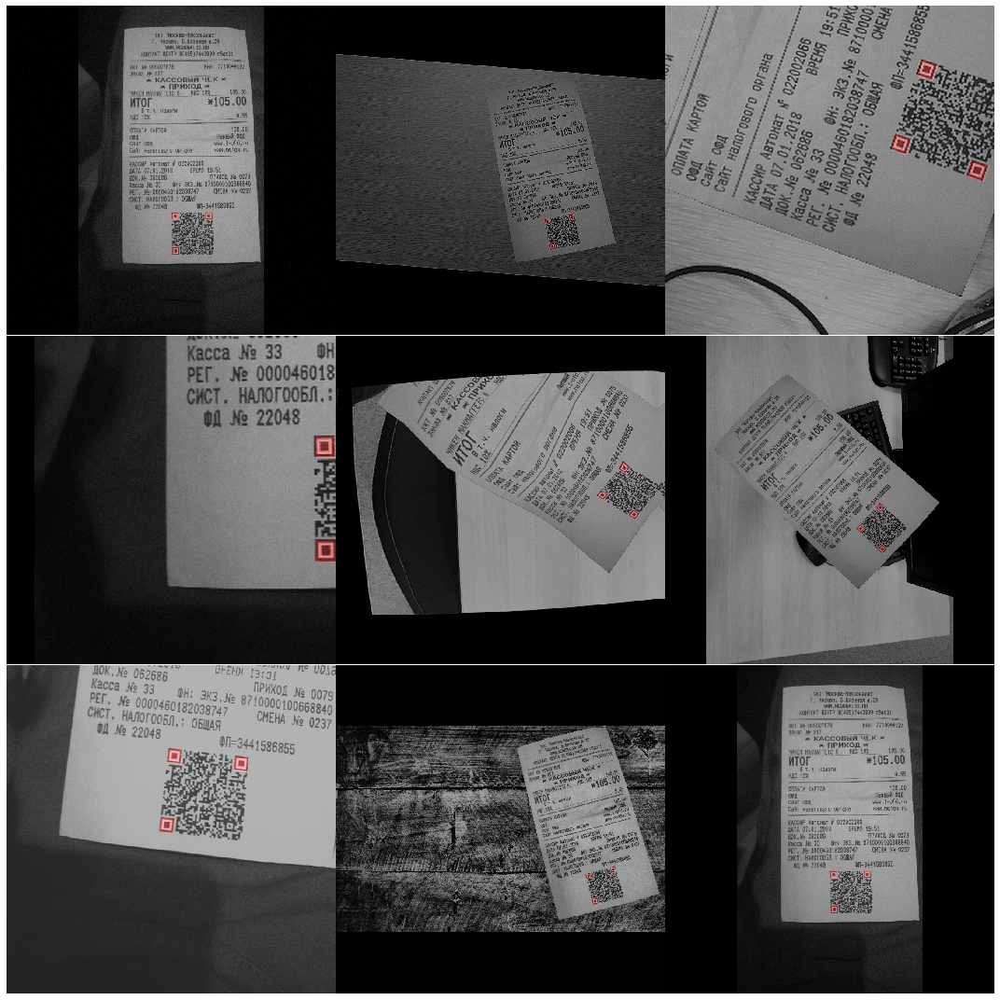

In [74]:
subplot_images(images_to_show[:9], 3, 3, figsize=(15, 15))

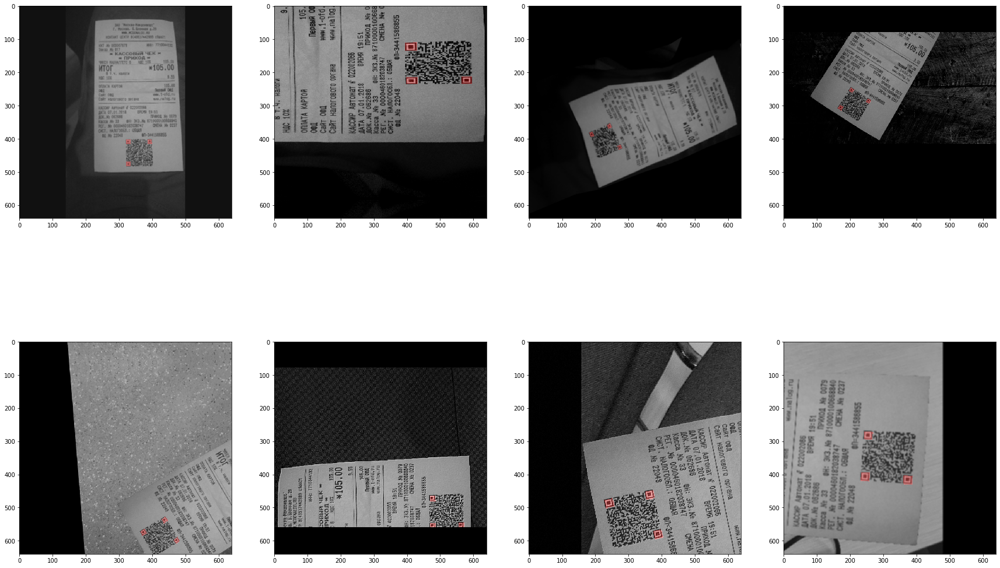

In [41]:
subplot_images(images_to_show, 3, 4, figsize=(30, 30))

In [93]:
import collections
from torch.utils.data import DataLoader

train_loader = DataLoader(
      train_dataset,
      batch_size=10, 
      shuffle=True,
      drop_last=True,
    )

valid_loader = DataLoader(
      valid_dataset,
      batch_size=10,
      shuffle=False,
      drop_last=True,
    )

loaders = collections.OrderedDict()
loaders["train"] = train_loader
loaders["valid"] = valid_loader

### Create model and Train it

In [8]:
import segmentation_models_pytorch as smp
import torch
import catalyst

from torch import nn
from catalyst.dl import utils as catalyst_utils

alchemy not available, to install alchemy, run `pip install alchemy-catalyst`.


### Create model

In [120]:
encoder_name = 'mobilenet_v2'
encoder_weights = 'imagenet'
classes = 1
in_channels = 3
model = smp.FPN(encoder_name=encoder_name, 
                encoder_weights=encoder_weights,
                in_channels=in_channels,
                classes=classes)

In [121]:
model.load_state_dict(torch.load('./logs/mobilenet_v2_2/checkpoints/best.pth')['model_state_dict']);

In [122]:
from catalyst.contrib.nn import DiceLoss, IoULoss, FocalLossBinary

criterion = {
    "dice": DiceLoss(),
    "iou": IoULoss(),
    "bce": nn.BCEWithLogitsLoss()
}

In [2]:
from torch import optim

from catalyst.contrib.nn import RAdam, Lookahead

learning_rate = 0.001
encoder_learning_rate = 0.0005

layerwise_params = {"encoder*": dict(lr=encoder_learning_rate, weight_decay=0.00003)}

model_params = catalyst_utils.process_model_params(model, layerwise_params=layerwise_params)

base_optimizer = RAdam(model_params, lr=learning_rate, weight_decay=0.0003)
optimizer = Lookahead(base_optimizer)

scheduler = optim.lr_scheduler.ReduceLROnPlateau(optimizer, factor=0.25, patience=7, mode='max') # Note patience!

In [124]:
from catalyst.dl import SupervisedRunner

num_epochs = 300
logdir = './logs/mobilenet/'
device = catalyst_utils.get_device()
print(f"device: {device}")

runner = SupervisedRunner(device=device, input_key="image", input_target_key="mask")

device: cuda


In [125]:
from catalyst.dl.callbacks import DiceCallback, IouCallback, \
  CriterionCallback, MetricAggregationCallback, EarlyStoppingCallback

callbacks = [
    CriterionCallback(
        input_key="mask",
        prefix="loss_dice",
        criterion_key="dice"
    ),
    CriterionCallback(
        input_key="mask",
        prefix="loss_iou",
        criterion_key="iou"
    ),
    CriterionCallback(
        input_key="mask",
        prefix="loss_bce",
        criterion_key="bce"
    ),

    MetricAggregationCallback(
        prefix="loss",
        mode="weighted_sum", 
        metrics={"loss_dice": 1.0, "loss_iou": 1.0, "loss_bce": 0.8},
    ),

    # metrics
    DiceCallback(input_key="mask"),
    IouCallback(input_key="mask"),
    EarlyStoppingCallback(patience=22, metric='iou', minimize=False) # Note patience!
]

### Train

In [126]:
runner.train(
    model=model,
    criterion=criterion,
    optimizer=optimizer,
    scheduler=scheduler,
    loaders=loaders,
    callbacks=callbacks,
    logdir=logdir,
    num_epochs=num_epochs,
    main_metric="iou",
    minimize_metric=False,
    verbose=True,
)





1/300 * Epoch (train):   0% 0/6 [00:00<?, ?it/s]



1/300 * Epoch (train):   0% 0/6 [00:09<?, ?it/s, dice=0.809, iou=0.679, loss=0.517, loss_bce=0.006, loss_dice=0.191, loss_iou=0.321]



1/300 * Epoch (train):  17% 1/6 [00:09<00:49,  9.81s/it, dice=0.809, iou=0.679, loss=0.517, loss_bce=0.006, loss_dice=0.191, loss_iou=0.321]



1/300 * Epoch (train):  17% 1/6 [00:20<00:49,  9.81s/it, dice=0.727, iou=0.571, loss=0.705, loss_bce=0.005, loss_dice=0.273, loss_iou=0.429]



1/300 * Epoch (train):  33% 2/6 [00:20<00:40, 10.15s/it, dice=0.727, iou=0.571, loss=0.705, loss_bce=0.005, loss_dice=0.273, loss_iou=0.429]



1/300 * Epoch (train):  33% 2/6 [00:29<00:40, 10.15s/it, dice=0.822, iou=0.698, loss=0.484, loss_bce=0.004, loss_dice=0.178, loss_iou=0.302]



1/300 * Epoch (train):  50% 3/6 [00:29<00:28,  9.65s/it, dice=0.822, iou=0.698, loss=0.484, loss_bce=0.004, loss_dice=0.178, loss_iou=0.302]



1/300 * Epoch (train):  50% 3/6 [00:37<00:28,  9.65s/it, dice=0.706, iou=0.546, loss=0.7

INFO:metrics_logger:
1/300 * Epoch 1 (_base): lr=0.0005 | momentum=0.9000
1/300 * Epoch 1 (train): dice=0.7516 | iou=0.6069 | loss=0.6474 | loss_bce=0.0073 | loss_dice=0.2484 | loss_iou=0.3931
1/300 * Epoch 1 (valid): dice=0.8549 | iou=0.7465 | loss=0.3995 | loss_bce=0.0010 | loss_dice=0.1451 | loss_iou=0.2535






2/300 * Epoch (train):   0% 0/6 [00:00<?, ?it/s]



2/300 * Epoch (train):   0% 0/6 [00:06<?, ?it/s, dice=0.790, iou=0.654, loss=0.558, loss_bce=0.003, loss_dice=0.210, loss_iou=0.346]



2/300 * Epoch (train):  17% 1/6 [00:06<00:34,  6.84s/it, dice=0.790, iou=0.654, loss=0.558, loss_bce=0.003, loss_dice=0.210, loss_iou=0.346]



2/300 * Epoch (train):  17% 1/6 [00:18<00:34,  6.84s/it, dice=0.761, iou=0.614, loss=0.628, loss_bce=0.004, loss_dice=0.239, loss_iou=0.386]



2/300 * Epoch (train):  33% 2/6 [00:18<00:33,  8.40s/it, dice=0.761, iou=0.614, loss=0.628, loss_bce=0.004, loss_dice=0.239, loss_iou=0.386]



2/300 * Epoch (train):  33% 2/6 [00:28<00:33,  8.40s/it, dice=0.780, iou=0.639, loss=0.586, loss_bce=0.005, loss_dice=0.220, loss_iou=0.361]



2/300 * Epoch (train):  50% 3/6 [00:28<00:26,  8.77s/it, dice=0.780, iou=0.639, loss=0.586, loss_bce=0.005, loss_dice=0.220, loss_iou=0.361]



2/300 * Epoch (train):  50% 3/6 [00:42<00:26,  8.77s/it, dice=0.810, iou=0.681, loss=0.5

INFO:metrics_logger:
2/300 * Epoch 2 (_base): lr=0.0005 | momentum=0.9000
2/300 * Epoch 2 (train): dice=0.7695 | iou=0.6281 | loss=0.6066 | loss_bce=0.0052 | loss_dice=0.2305 | loss_iou=0.3719
2/300 * Epoch 2 (valid): dice=0.8533 | iou=0.7442 | loss=0.4033 | loss_bce=0.0011 | loss_dice=0.1467 | loss_iou=0.2558






3/300 * Epoch (train):   0% 0/6 [00:00<?, ?it/s]



3/300 * Epoch (train):   0% 0/6 [00:13<?, ?it/s, dice=0.803, iou=0.672, loss=0.529, loss_bce=0.005, loss_dice=0.197, loss_iou=0.328]



3/300 * Epoch (train):  17% 1/6 [00:13<01:05, 13.17s/it, dice=0.803, iou=0.672, loss=0.529, loss_bce=0.005, loss_dice=0.197, loss_iou=0.328]



3/300 * Epoch (train):  17% 1/6 [00:25<01:05, 13.17s/it, dice=0.854, iou=0.745, loss=0.403, loss_bce=0.003, loss_dice=0.146, loss_iou=0.255]



3/300 * Epoch (train):  33% 2/6 [00:25<00:51, 12.96s/it, dice=0.854, iou=0.745, loss=0.403, loss_bce=0.003, loss_dice=0.146, loss_iou=0.255]



3/300 * Epoch (train):  33% 2/6 [00:36<00:51, 12.96s/it, dice=0.808, iou=0.678, loss=0.517, loss_bce=0.003, loss_dice=0.192, loss_iou=0.322]



3/300 * Epoch (train):  50% 3/6 [00:36<00:37, 12.40s/it, dice=0.808, iou=0.678, loss=0.517, loss_bce=0.003, loss_dice=0.192, loss_iou=0.322]



3/300 * Epoch (train):  50% 3/6 [00:46<00:37, 12.40s/it, dice=0.826, iou=0.704, loss=0.4

INFO:metrics_logger:
3/300 * Epoch 3 (_base): lr=0.0005 | momentum=0.9000
3/300 * Epoch 3 (train): dice=0.7866 | iou=0.6517 | loss=0.5655 | loss_bce=0.0048 | loss_dice=0.2134 | loss_iou=0.3483
3/300 * Epoch 3 (valid): dice=0.8556 | iou=0.7476 | loss=0.3976 | loss_bce=0.0010 | loss_dice=0.1444 | loss_iou=0.2524






4/300 * Epoch (train):   0% 0/6 [00:00<?, ?it/s]



4/300 * Epoch (train):   0% 0/6 [00:09<?, ?it/s, dice=0.787, iou=0.649, loss=0.571, loss_bce=0.008, loss_dice=0.213, loss_iou=0.351]



4/300 * Epoch (train):  17% 1/6 [00:09<00:46,  9.27s/it, dice=0.787, iou=0.649, loss=0.571, loss_bce=0.008, loss_dice=0.213, loss_iou=0.351]



4/300 * Epoch (train):  17% 1/6 [00:16<00:46,  9.27s/it, dice=0.858, iou=0.752, loss=0.392, loss_bce=0.003, loss_dice=0.142, loss_iou=0.248]



4/300 * Epoch (train):  33% 2/6 [00:16<00:34,  8.65s/it, dice=0.858, iou=0.752, loss=0.392, loss_bce=0.003, loss_dice=0.142, loss_iou=0.248]



4/300 * Epoch (train):  33% 2/6 [00:27<00:34,  8.65s/it, dice=0.818, iou=0.692, loss=0.498, loss_bce=0.008, loss_dice=0.182, loss_iou=0.308]



4/300 * Epoch (train):  50% 3/6 [00:27<00:27,  9.22s/it, dice=0.818, iou=0.692, loss=0.498, loss_bce=0.008, loss_dice=0.182, loss_iou=0.308]



4/300 * Epoch (train):  50% 3/6 [00:32<00:27,  9.22s/it, dice=0.789, iou=0.651, loss=0.5

INFO:metrics_logger:
4/300 * Epoch 4 (_base): lr=0.0005 | momentum=0.9000
4/300 * Epoch 4 (train): dice=0.8016 | iou=0.6707 | loss=0.5322 | loss_bce=0.0056 | loss_dice=0.1984 | loss_iou=0.3293
4/300 * Epoch 4 (valid): dice=0.8537 | iou=0.7447 | loss=0.4024 | loss_bce=0.0010 | loss_dice=0.1463 | loss_iou=0.2553






5/300 * Epoch (train):   0% 0/6 [00:00<?, ?it/s]



5/300 * Epoch (train):   0% 0/6 [00:07<?, ?it/s, dice=0.812, iou=0.683, loss=0.508, loss_bce=0.003, loss_dice=0.188, loss_iou=0.317]



5/300 * Epoch (train):  17% 1/6 [00:07<00:37,  7.44s/it, dice=0.812, iou=0.683, loss=0.508, loss_bce=0.003, loss_dice=0.188, loss_iou=0.317]



5/300 * Epoch (train):  17% 1/6 [00:16<00:37,  7.44s/it, dice=0.855, iou=0.747, loss=0.399, loss_bce=0.002, loss_dice=0.145, loss_iou=0.253]



5/300 * Epoch (train):  33% 2/6 [00:16<00:31,  7.90s/it, dice=0.855, iou=0.747, loss=0.399, loss_bce=0.002, loss_dice=0.145, loss_iou=0.253]



5/300 * Epoch (train):  33% 2/6 [00:25<00:31,  7.90s/it, dice=0.715, iou=0.557, loss=0.733, loss_bce=0.006, loss_dice=0.285, loss_iou=0.443]



5/300 * Epoch (train):  50% 3/6 [00:25<00:24,  8.16s/it, dice=0.715, iou=0.557, loss=0.733, loss_bce=0.006, loss_dice=0.285, loss_iou=0.443]



5/300 * Epoch (train):  50% 3/6 [00:29<00:24,  8.16s/it, dice=0.802, iou=0.669, loss=0.5

INFO:metrics_logger:
5/300 * Epoch 5 (_base): lr=0.0005 | momentum=0.9000
5/300 * Epoch 5 (train): dice=0.7951 | iou=0.6628 | loss=0.5452 | loss_bce=0.0039 | loss_dice=0.2049 | loss_iou=0.3372
5/300 * Epoch 5 (valid): dice=0.8533 | iou=0.7441 | loss=0.4034 | loss_bce=0.0010 | loss_dice=0.1467 | loss_iou=0.2559






6/300 * Epoch (train):   0% 0/6 [00:00<?, ?it/s]



6/300 * Epoch (train):   0% 0/6 [00:11<?, ?it/s, dice=0.842, iou=0.726, loss=0.436, loss_bce=0.005, loss_dice=0.158, loss_iou=0.274]



6/300 * Epoch (train):  17% 1/6 [00:11<00:55, 11.08s/it, dice=0.842, iou=0.726, loss=0.436, loss_bce=0.005, loss_dice=0.158, loss_iou=0.274]



6/300 * Epoch (train):  17% 1/6 [00:27<00:55, 11.08s/it, dice=0.789, iou=0.652, loss=0.564, loss_bce=0.006, loss_dice=0.211, loss_iou=0.348]



6/300 * Epoch (train):  33% 2/6 [00:27<00:50, 12.54s/it, dice=0.789, iou=0.652, loss=0.564, loss_bce=0.006, loss_dice=0.211, loss_iou=0.348]



6/300 * Epoch (train):  33% 2/6 [00:38<00:50, 12.54s/it, dice=0.719, iou=0.561, loss=0.727, loss_bce=0.010, loss_dice=0.281, loss_iou=0.439]



6/300 * Epoch (train):  50% 3/6 [00:38<00:36, 12.12s/it, dice=0.719, iou=0.561, loss=0.727, loss_bce=0.010, loss_dice=0.281, loss_iou=0.439]



6/300 * Epoch (train):  50% 3/6 [00:45<00:36, 12.12s/it, dice=0.821, iou=0.697, loss=0.4

INFO:metrics_logger:
6/300 * Epoch 6 (_base): lr=0.0005 | momentum=0.9000
6/300 * Epoch 6 (train): dice=0.7963 | iou=0.6632 | loss=0.5446 | loss_bce=0.0051 | loss_dice=0.2037 | loss_iou=0.3368
6/300 * Epoch 6 (valid): dice=0.8514 | iou=0.7413 | loss=0.4082 | loss_bce=0.0011 | loss_dice=0.1486 | loss_iou=0.2587






7/300 * Epoch (train):   0% 0/6 [00:00<?, ?it/s]



7/300 * Epoch (train):   0% 0/6 [00:04<?, ?it/s, dice=0.853, iou=0.743, loss=0.406, loss_bce=0.002, loss_dice=0.147, loss_iou=0.257]



7/300 * Epoch (train):  17% 1/6 [00:04<00:23,  4.60s/it, dice=0.853, iou=0.743, loss=0.406, loss_bce=0.002, loss_dice=0.147, loss_iou=0.257]



7/300 * Epoch (train):  17% 1/6 [00:16<00:23,  4.60s/it, dice=0.791, iou=0.654, loss=0.558, loss_bce=0.002, loss_dice=0.209, loss_iou=0.346]



7/300 * Epoch (train):  33% 2/6 [00:16<00:26,  6.70s/it, dice=0.791, iou=0.654, loss=0.558, loss_bce=0.002, loss_dice=0.209, loss_iou=0.346]



7/300 * Epoch (train):  33% 2/6 [00:25<00:26,  6.70s/it, dice=0.844, iou=0.731, loss=0.427, loss_bce=0.003, loss_dice=0.156, loss_iou=0.269]



7/300 * Epoch (train):  50% 3/6 [00:25<00:22,  7.53s/it, dice=0.844, iou=0.731, loss=0.427, loss_bce=0.003, loss_dice=0.156, loss_iou=0.269]



7/300 * Epoch (train):  50% 3/6 [00:36<00:22,  7.53s/it, dice=0.794, iou=0.658, loss=0.5

INFO:metrics_logger:
7/300 * Epoch 7 (_base): lr=0.0005 | momentum=0.9000
7/300 * Epoch 7 (train): dice=0.8168 | iou=0.6910 | loss=0.4947 | loss_bce=0.0033 | loss_dice=0.1832 | loss_iou=0.3090
7/300 * Epoch 7 (valid): dice=0.8545 | iou=0.7459 | loss=0.4004 | loss_bce=0.0010 | loss_dice=0.1455 | loss_iou=0.2541






8/300 * Epoch (train):   0% 0/6 [00:00<?, ?it/s]



8/300 * Epoch (train):   0% 0/6 [00:04<?, ?it/s, dice=0.871, iou=0.772, loss=0.361, loss_bce=0.005, loss_dice=0.129, loss_iou=0.228]



8/300 * Epoch (train):  17% 1/6 [00:04<00:24,  4.89s/it, dice=0.871, iou=0.772, loss=0.361, loss_bce=0.005, loss_dice=0.129, loss_iou=0.228]



8/300 * Epoch (train):  17% 1/6 [00:12<00:24,  4.89s/it, dice=0.843, iou=0.728, loss=0.431, loss_bce=0.002, loss_dice=0.157, loss_iou=0.272]



8/300 * Epoch (train):  33% 2/6 [00:12<00:23,  5.78s/it, dice=0.843, iou=0.728, loss=0.431, loss_bce=0.002, loss_dice=0.157, loss_iou=0.272]



8/300 * Epoch (train):  33% 2/6 [00:19<00:23,  5.78s/it, dice=0.804, iou=0.672, loss=0.527, loss_bce=0.004, loss_dice=0.196, loss_iou=0.328]



8/300 * Epoch (train):  50% 3/6 [00:19<00:18,  6.21s/it, dice=0.804, iou=0.672, loss=0.527, loss_bce=0.004, loss_dice=0.196, loss_iou=0.328]



8/300 * Epoch (train):  50% 3/6 [00:32<00:18,  6.21s/it, dice=0.837, iou=0.720, loss=0.4

INFO:metrics_logger:
8/300 * Epoch 8 (_base): lr=0.0005 | momentum=0.9000
8/300 * Epoch 8 (train): dice=0.8303 | iou=0.7106 | loss=0.4624 | loss_bce=0.0042 | loss_dice=0.1697 | loss_iou=0.2894
8/300 * Epoch 8 (valid): dice=0.8537 | iou=0.7448 | loss=0.4024 | loss_bce=0.0011 | loss_dice=0.1463 | loss_iou=0.2552






9/300 * Epoch (train):   0% 0/6 [00:00<?, ?it/s]



9/300 * Epoch (train):   0% 0/6 [00:12<?, ?it/s, dice=0.814, iou=0.686, loss=0.506, loss_bce=0.008, loss_dice=0.186, loss_iou=0.314]



9/300 * Epoch (train):  17% 1/6 [00:12<01:02, 12.53s/it, dice=0.814, iou=0.686, loss=0.506, loss_bce=0.008, loss_dice=0.186, loss_iou=0.314]



9/300 * Epoch (train):  17% 1/6 [00:25<01:02, 12.53s/it, dice=0.756, iou=0.608, loss=0.642, loss_bce=0.008, loss_dice=0.244, loss_iou=0.392]



9/300 * Epoch (train):  33% 2/6 [00:25<00:50, 12.67s/it, dice=0.756, iou=0.608, loss=0.642, loss_bce=0.008, loss_dice=0.244, loss_iou=0.392]



9/300 * Epoch (train):  33% 2/6 [00:35<00:50, 12.67s/it, dice=0.818, iou=0.691, loss=0.494, loss_bce=0.003, loss_dice=0.182, loss_iou=0.309]



9/300 * Epoch (train):  50% 3/6 [00:35<00:35, 11.79s/it, dice=0.818, iou=0.691, loss=0.494, loss_bce=0.003, loss_dice=0.182, loss_iou=0.309]



9/300 * Epoch (train):  50% 3/6 [00:46<00:35, 11.79s/it, dice=0.810, iou=0.681, loss=0.5

INFO:metrics_logger:
9/300 * Epoch 9 (_base): lr=0.0005 | momentum=0.9000
9/300 * Epoch 9 (train): dice=0.8098 | iou=0.6811 | loss=0.5131 | loss_bce=0.0050 | loss_dice=0.1902 | loss_iou=0.3189
9/300 * Epoch 9 (valid): dice=0.8544 | iou=0.7458 | loss=0.4007 | loss_bce=0.0011 | loss_dice=0.1456 | loss_iou=0.2542






10/300 * Epoch (train):   0% 0/6 [00:00<?, ?it/s]



10/300 * Epoch (train):   0% 0/6 [00:09<?, ?it/s, dice=0.767, iou=0.623, loss=0.614, loss_bce=0.005, loss_dice=0.233, loss_iou=0.377]



10/300 * Epoch (train):  17% 1/6 [00:09<00:45,  9.13s/it, dice=0.767, iou=0.623, loss=0.614, loss_bce=0.005, loss_dice=0.233, loss_iou=0.377]



10/300 * Epoch (train):  17% 1/6 [00:22<00:45,  9.13s/it, dice=0.785, iou=0.646, loss=0.570, loss_bce=0.002, loss_dice=0.215, loss_iou=0.354]



10/300 * Epoch (train):  33% 2/6 [00:22<00:41, 10.48s/it, dice=0.785, iou=0.646, loss=0.570, loss_bce=0.002, loss_dice=0.215, loss_iou=0.354]



10/300 * Epoch (train):  33% 2/6 [00:32<00:41, 10.48s/it, dice=0.800, iou=0.667, loss=0.537, loss_bce=0.006, loss_dice=0.200, loss_iou=0.333]



10/300 * Epoch (train):  50% 3/6 [00:32<00:30, 10.27s/it, dice=0.800, iou=0.667, loss=0.537, loss_bce=0.006, loss_dice=0.200, loss_iou=0.333]



10/300 * Epoch (train):  50% 3/6 [00:39<00:30, 10.27s/it, dice=0.793, iou=0.657, 

INFO:metrics_logger:
10/300 * Epoch 10 (_base): lr=0.0005 | momentum=0.9000
10/300 * Epoch 10 (train): dice=0.7545 | iou=0.6080 | loss=0.6422 | loss_bce=0.0059 | loss_dice=0.2455 | loss_iou=0.3920
10/300 * Epoch 10 (valid): dice=0.8431 | iou=0.7287 | loss=0.4292 | loss_bce=0.0013 | loss_dice=0.1569 | loss_iou=0.2713






11/300 * Epoch (train):   0% 0/6 [00:00<?, ?it/s]



11/300 * Epoch (train):   0% 0/6 [00:10<?, ?it/s, dice=0.777, iou=0.636, loss=0.591, loss_bce=0.005, loss_dice=0.223, loss_iou=0.364]



11/300 * Epoch (train):  17% 1/6 [00:10<00:54, 10.93s/it, dice=0.777, iou=0.636, loss=0.591, loss_bce=0.005, loss_dice=0.223, loss_iou=0.364]



11/300 * Epoch (train):  17% 1/6 [00:21<00:54, 10.93s/it, dice=0.797, iou=0.663, loss=0.543, loss_bce=0.005, loss_dice=0.203, loss_iou=0.337]



11/300 * Epoch (train):  33% 2/6 [00:21<00:42, 10.74s/it, dice=0.797, iou=0.663, loss=0.543, loss_bce=0.005, loss_dice=0.203, loss_iou=0.337]



11/300 * Epoch (train):  33% 2/6 [00:28<00:42, 10.74s/it, dice=0.804, iou=0.672, loss=0.525, loss_bce=0.002, loss_dice=0.196, loss_iou=0.328]



11/300 * Epoch (train):  50% 3/6 [00:28<00:28,  9.60s/it, dice=0.804, iou=0.672, loss=0.525, loss_bce=0.002, loss_dice=0.196, loss_iou=0.328]



11/300 * Epoch (train):  50% 3/6 [00:39<00:28,  9.60s/it, dice=0.735, iou=0.581, 

INFO:metrics_logger:
11/300 * Epoch 11 (_base): lr=0.0005 | momentum=0.9000
11/300 * Epoch 11 (train): dice=0.7878 | iou=0.6506 | loss=0.5656 | loss_bce=0.0049 | loss_dice=0.2122 | loss_iou=0.3494
11/300 * Epoch 11 (valid): dice=0.8563 | iou=0.7487 | loss=0.3958 | loss_bce=0.0010 | loss_dice=0.1437 | loss_iou=0.2513






12/300 * Epoch (train):   0% 0/6 [00:00<?, ?it/s]



12/300 * Epoch (train):   0% 0/6 [00:10<?, ?it/s, dice=0.807, iou=0.677, loss=0.519, loss_bce=0.004, loss_dice=0.193, loss_iou=0.323]



12/300 * Epoch (train):  17% 1/6 [00:10<00:50, 10.03s/it, dice=0.807, iou=0.677, loss=0.519, loss_bce=0.004, loss_dice=0.193, loss_iou=0.323]



12/300 * Epoch (train):  17% 1/6 [00:16<00:50, 10.03s/it, dice=0.801, iou=0.668, loss=0.533, loss_bce=0.002, loss_dice=0.199, loss_iou=0.332]



12/300 * Epoch (train):  33% 2/6 [00:16<00:36,  9.02s/it, dice=0.801, iou=0.668, loss=0.533, loss_bce=0.002, loss_dice=0.199, loss_iou=0.332]



12/300 * Epoch (train):  33% 2/6 [00:26<00:36,  9.02s/it, dice=0.777, iou=0.635, loss=0.594, loss_bce=0.007, loss_dice=0.223, loss_iou=0.365]



12/300 * Epoch (train):  50% 3/6 [00:26<00:27,  9.21s/it, dice=0.777, iou=0.635, loss=0.594, loss_bce=0.007, loss_dice=0.223, loss_iou=0.365]



12/300 * Epoch (train):  50% 3/6 [00:36<00:27,  9.21s/it, dice=0.777, iou=0.635, 

INFO:metrics_logger:
12/300 * Epoch 12 (_base): lr=0.0005 | momentum=0.9000
12/300 * Epoch 12 (train): dice=0.8091 | iou=0.6805 | loss=0.5138 | loss_bce=0.0042 | loss_dice=0.1909 | loss_iou=0.3195
12/300 * Epoch 12 (valid): dice=0.8538 | iou=0.7449 | loss=0.4022 | loss_bce=0.0011 | loss_dice=0.1462 | loss_iou=0.2551






13/300 * Epoch (train):   0% 0/6 [00:00<?, ?it/s]



13/300 * Epoch (train):   0% 0/6 [00:18<?, ?it/s, dice=0.816, iou=0.690, loss=0.496, loss_bce=0.003, loss_dice=0.184, loss_iou=0.310]



13/300 * Epoch (train):  17% 1/6 [00:18<01:31, 18.24s/it, dice=0.816, iou=0.690, loss=0.496, loss_bce=0.003, loss_dice=0.184, loss_iou=0.310]



13/300 * Epoch (train):  17% 1/6 [00:26<01:31, 18.24s/it, dice=0.772, iou=0.629, loss=0.602, loss_bce=0.004, loss_dice=0.228, loss_iou=0.371]



13/300 * Epoch (train):  33% 2/6 [00:26<01:01, 15.27s/it, dice=0.772, iou=0.629, loss=0.602, loss_bce=0.004, loss_dice=0.228, loss_iou=0.371]



13/300 * Epoch (train):  33% 2/6 [00:40<01:01, 15.27s/it, dice=0.761, iou=0.615, loss=0.627, loss_bce=0.003, loss_dice=0.239, loss_iou=0.385]



13/300 * Epoch (train):  50% 3/6 [00:40<00:44, 14.89s/it, dice=0.761, iou=0.615, loss=0.627, loss_bce=0.003, loss_dice=0.239, loss_iou=0.385]



13/300 * Epoch (train):  50% 3/6 [00:53<00:44, 14.89s/it, dice=0.733, iou=0.579, 

INFO:metrics_logger:
13/300 * Epoch 13 (_base): lr=0.0005 | momentum=0.9000
13/300 * Epoch 13 (train): dice=0.7812 | iou=0.6430 | loss=0.5793 | loss_bce=0.0043 | loss_dice=0.2188 | loss_iou=0.3570
13/300 * Epoch 13 (valid): dice=0.8568 | iou=0.7494 | loss=0.3947 | loss_bce=0.0010 | loss_dice=0.1432 | loss_iou=0.2506






14/300 * Epoch (train):   0% 0/6 [00:00<?, ?it/s]



14/300 * Epoch (train):   0% 0/6 [00:05<?, ?it/s, dice=0.828, iou=0.706, loss=0.469, loss_bce=0.004, loss_dice=0.172, loss_iou=0.294]



14/300 * Epoch (train):  17% 1/6 [00:05<00:25,  5.20s/it, dice=0.828, iou=0.706, loss=0.469, loss_bce=0.004, loss_dice=0.172, loss_iou=0.294]



14/300 * Epoch (train):  17% 1/6 [00:17<00:25,  5.20s/it, dice=0.847, iou=0.734, loss=0.421, loss_bce=0.002, loss_dice=0.153, loss_iou=0.266]



14/300 * Epoch (train):  33% 2/6 [00:17<00:29,  7.43s/it, dice=0.847, iou=0.734, loss=0.421, loss_bce=0.002, loss_dice=0.153, loss_iou=0.266]



14/300 * Epoch (train):  33% 2/6 [00:28<00:29,  7.43s/it, dice=0.847, iou=0.734, loss=0.421, loss_bce=0.002, loss_dice=0.153, loss_iou=0.266]



14/300 * Epoch (train):  50% 3/6 [00:28<00:25,  8.44s/it, dice=0.847, iou=0.734, loss=0.421, loss_bce=0.002, loss_dice=0.153, loss_iou=0.266]



14/300 * Epoch (train):  50% 3/6 [00:36<00:25,  8.44s/it, dice=0.844, iou=0.730, 

INFO:metrics_logger:
14/300 * Epoch 14 (_base): lr=0.0005 | momentum=0.9000
14/300 * Epoch 14 (train): dice=0.8232 | iou=0.7003 | loss=0.4790 | loss_bce=0.0031 | loss_dice=0.1768 | loss_iou=0.2997
14/300 * Epoch 14 (valid): dice=0.8578 | iou=0.7510 | loss=0.3920 | loss_bce=0.0010 | loss_dice=0.1422 | loss_iou=0.2490






15/300 * Epoch (train):   0% 0/6 [00:00<?, ?it/s]



15/300 * Epoch (train):   0% 0/6 [00:10<?, ?it/s, dice=0.841, iou=0.726, loss=0.436, loss_bce=0.004, loss_dice=0.159, loss_iou=0.274]



15/300 * Epoch (train):  17% 1/6 [00:10<00:50, 10.11s/it, dice=0.841, iou=0.726, loss=0.436, loss_bce=0.004, loss_dice=0.159, loss_iou=0.274]



15/300 * Epoch (train):  17% 1/6 [00:18<00:50, 10.11s/it, dice=0.784, iou=0.644, loss=0.576, loss_bce=0.004, loss_dice=0.216, loss_iou=0.356]



15/300 * Epoch (train):  33% 2/6 [00:18<00:38,  9.61s/it, dice=0.784, iou=0.644, loss=0.576, loss_bce=0.004, loss_dice=0.216, loss_iou=0.356]



15/300 * Epoch (train):  33% 2/6 [00:33<00:38,  9.61s/it, dice=0.804, iou=0.672, loss=0.527, loss_bce=0.003, loss_dice=0.196, loss_iou=0.328]



15/300 * Epoch (train):  50% 3/6 [00:33<00:33, 11.24s/it, dice=0.804, iou=0.672, loss=0.527, loss_bce=0.003, loss_dice=0.196, loss_iou=0.328]



15/300 * Epoch (train):  50% 3/6 [00:39<00:33, 11.24s/it, dice=0.840, iou=0.724, 

INFO:metrics_logger:
15/300 * Epoch 15 (_base): lr=0.0005 | momentum=0.9000
15/300 * Epoch 15 (train): dice=0.8228 | iou=0.6996 | loss=0.4806 | loss_bce=0.0039 | loss_dice=0.1772 | loss_iou=0.3004
15/300 * Epoch 15 (valid): dice=0.8126 | iou=0.6844 | loss=0.5045 | loss_bce=0.0019 | loss_dice=0.1874 | loss_iou=0.3156






16/300 * Epoch (train):   0% 0/6 [00:00<?, ?it/s]



16/300 * Epoch (train):   0% 0/6 [00:11<?, ?it/s, dice=0.740, iou=0.587, loss=0.679, loss_bce=0.007, loss_dice=0.260, loss_iou=0.413]



16/300 * Epoch (train):  17% 1/6 [00:11<00:59, 11.85s/it, dice=0.740, iou=0.587, loss=0.679, loss_bce=0.007, loss_dice=0.260, loss_iou=0.413]



16/300 * Epoch (train):  17% 1/6 [00:24<00:59, 11.85s/it, dice=0.808, iou=0.677, loss=0.517, loss_bce=0.003, loss_dice=0.192, loss_iou=0.323]



16/300 * Epoch (train):  33% 2/6 [00:24<00:48, 12.20s/it, dice=0.808, iou=0.677, loss=0.517, loss_bce=0.003, loss_dice=0.192, loss_iou=0.323]



16/300 * Epoch (train):  33% 2/6 [00:34<00:48, 12.20s/it, dice=0.776, iou=0.635, loss=0.592, loss_bce=0.004, loss_dice=0.224, loss_iou=0.365]



16/300 * Epoch (train):  50% 3/6 [00:34<00:34, 11.51s/it, dice=0.776, iou=0.635, loss=0.592, loss_bce=0.004, loss_dice=0.224, loss_iou=0.365]



16/300 * Epoch (train):  50% 3/6 [00:45<00:34, 11.51s/it, dice=0.836, iou=0.718, 

INFO:metrics_logger:
16/300 * Epoch 16 (_base): lr=0.0005 | momentum=0.9000
16/300 * Epoch 16 (train): dice=0.7913 | iou=0.6563 | loss=0.5566 | loss_bce=0.0052 | loss_dice=0.2087 | loss_iou=0.3437
16/300 * Epoch 16 (valid): dice=0.8583 | iou=0.7518 | loss=0.3906 | loss_bce=0.0010 | loss_dice=0.1417 | loss_iou=0.2482






17/300 * Epoch (train):   0% 0/6 [00:00<?, ?it/s]



17/300 * Epoch (train):   0% 0/6 [00:11<?, ?it/s, dice=0.801, iou=0.667, loss=0.535, loss_bce=0.004, loss_dice=0.199, loss_iou=0.333]



17/300 * Epoch (train):  17% 1/6 [00:11<00:59, 11.89s/it, dice=0.801, iou=0.667, loss=0.535, loss_bce=0.004, loss_dice=0.199, loss_iou=0.333]



17/300 * Epoch (train):  17% 1/6 [00:23<00:59, 11.89s/it, dice=0.823, iou=0.699, loss=0.482, loss_bce=0.004, loss_dice=0.177, loss_iou=0.301]



17/300 * Epoch (train):  33% 2/6 [00:23<00:47, 11.89s/it, dice=0.823, iou=0.699, loss=0.482, loss_bce=0.004, loss_dice=0.177, loss_iou=0.301]



17/300 * Epoch (train):  33% 2/6 [00:34<00:47, 11.89s/it, dice=0.829, iou=0.708, loss=0.466, loss_bce=0.003, loss_dice=0.171, loss_iou=0.292]



17/300 * Epoch (train):  50% 3/6 [00:34<00:34, 11.45s/it, dice=0.829, iou=0.708, loss=0.466, loss_bce=0.003, loss_dice=0.171, loss_iou=0.292]



17/300 * Epoch (train):  50% 3/6 [00:45<00:34, 11.45s/it, dice=0.847, iou=0.734, 

INFO:metrics_logger:
17/300 * Epoch 17 (_base): lr=0.0005 | momentum=0.9000
17/300 * Epoch 17 (train): dice=0.8300 | iou=0.7100 | loss=0.4634 | loss_bce=0.0042 | loss_dice=0.1700 | loss_iou=0.2900
17/300 * Epoch 17 (valid): dice=0.8605 | iou=0.7552 | loss=0.3850 | loss_bce=0.0010 | loss_dice=0.1395 | loss_iou=0.2448






18/300 * Epoch (train):   0% 0/6 [00:00<?, ?it/s]



18/300 * Epoch (train):   0% 0/6 [00:14<?, ?it/s, dice=0.840, iou=0.724, loss=0.438, loss_bce=0.003, loss_dice=0.160, loss_iou=0.276]



18/300 * Epoch (train):  17% 1/6 [00:14<01:10, 14.04s/it, dice=0.840, iou=0.724, loss=0.438, loss_bce=0.003, loss_dice=0.160, loss_iou=0.276]



18/300 * Epoch (train):  17% 1/6 [00:25<01:10, 14.04s/it, dice=0.791, iou=0.655, loss=0.557, loss_bce=0.005, loss_dice=0.209, loss_iou=0.345]



18/300 * Epoch (train):  33% 2/6 [00:25<00:52, 13.15s/it, dice=0.791, iou=0.655, loss=0.557, loss_bce=0.005, loss_dice=0.209, loss_iou=0.345]



18/300 * Epoch (train):  33% 2/6 [00:34<00:52, 13.15s/it, dice=0.832, iou=0.712, loss=0.459, loss_bce=0.004, loss_dice=0.168, loss_iou=0.288]



18/300 * Epoch (train):  50% 3/6 [00:34<00:35, 11.99s/it, dice=0.832, iou=0.712, loss=0.459, loss_bce=0.004, loss_dice=0.168, loss_iou=0.288]



18/300 * Epoch (train):  50% 3/6 [00:46<00:35, 11.99s/it, dice=0.832, iou=0.713, 

INFO:metrics_logger:
18/300 * Epoch 18 (_base): lr=0.0005 | momentum=0.9000
18/300 * Epoch 18 (train): dice=0.8299 | iou=0.7098 | loss=0.4632 | loss_bce=0.0036 | loss_dice=0.1701 | loss_iou=0.2902
18/300 * Epoch 18 (valid): dice=0.8613 | iou=0.7565 | loss=0.3830 | loss_bce=0.0010 | loss_dice=0.1387 | loss_iou=0.2435






19/300 * Epoch (train):   0% 0/6 [00:00<?, ?it/s]



19/300 * Epoch (train):   0% 0/6 [00:12<?, ?it/s, dice=0.829, iou=0.708, loss=0.464, loss_bce=0.003, loss_dice=0.171, loss_iou=0.292]



19/300 * Epoch (train):  17% 1/6 [00:12<01:02, 12.45s/it, dice=0.829, iou=0.708, loss=0.464, loss_bce=0.003, loss_dice=0.171, loss_iou=0.292]



19/300 * Epoch (train):  17% 1/6 [00:25<01:02, 12.45s/it, dice=0.818, iou=0.692, loss=0.493, loss_bce=0.003, loss_dice=0.182, loss_iou=0.308]



19/300 * Epoch (train):  33% 2/6 [00:25<00:50, 12.52s/it, dice=0.818, iou=0.692, loss=0.493, loss_bce=0.003, loss_dice=0.182, loss_iou=0.308]



19/300 * Epoch (train):  33% 2/6 [00:31<00:50, 12.52s/it, dice=0.844, iou=0.730, loss=0.430, loss_bce=0.005, loss_dice=0.156, loss_iou=0.270]



19/300 * Epoch (train):  50% 3/6 [00:31<00:31, 10.66s/it, dice=0.844, iou=0.730, loss=0.430, loss_bce=0.005, loss_dice=0.156, loss_iou=0.270]



19/300 * Epoch (train):  50% 3/6 [00:41<00:31, 10.66s/it, dice=0.851, iou=0.741, 

INFO:metrics_logger:
19/300 * Epoch 19 (_base): lr=0.0005 | momentum=0.9000
19/300 * Epoch 19 (train): dice=0.8238 | iou=0.7017 | loss=0.4777 | loss_bce=0.0041 | loss_dice=0.1762 | loss_iou=0.2983
19/300 * Epoch 19 (valid): dice=0.8530 | iou=0.7437 | loss=0.4042 | loss_bce=0.0012 | loss_dice=0.1470 | loss_iou=0.2563






20/300 * Epoch (train):   0% 0/6 [00:00<?, ?it/s]



20/300 * Epoch (train):   0% 0/6 [00:12<?, ?it/s, dice=0.811, iou=0.682, loss=0.512, loss_bce=0.007, loss_dice=0.189, loss_iou=0.318]



20/300 * Epoch (train):  17% 1/6 [00:12<01:03, 12.78s/it, dice=0.811, iou=0.682, loss=0.512, loss_bce=0.007, loss_dice=0.189, loss_iou=0.318]



20/300 * Epoch (train):  17% 1/6 [00:24<01:03, 12.78s/it, dice=0.817, iou=0.690, loss=0.496, loss_bce=0.003, loss_dice=0.183, loss_iou=0.310]



20/300 * Epoch (train):  33% 2/6 [00:24<00:49, 12.34s/it, dice=0.817, iou=0.690, loss=0.496, loss_bce=0.003, loss_dice=0.183, loss_iou=0.310]



20/300 * Epoch (train):  33% 2/6 [00:38<00:49, 12.34s/it, dice=0.839, iou=0.722, loss=0.442, loss_bce=0.003, loss_dice=0.161, loss_iou=0.278]



20/300 * Epoch (train):  50% 3/6 [00:38<00:38, 12.85s/it, dice=0.839, iou=0.722, loss=0.442, loss_bce=0.003, loss_dice=0.161, loss_iou=0.278]



20/300 * Epoch (train):  50% 3/6 [00:47<00:38, 12.85s/it, dice=0.841, iou=0.726, 

INFO:metrics_logger:
20/300 * Epoch 20 (_base): lr=0.0005 | momentum=0.9000
20/300 * Epoch 20 (train): dice=0.8280 | iou=0.7067 | loss=0.4684 | loss_bce=0.0039 | loss_dice=0.1720 | loss_iou=0.2933
20/300 * Epoch 20 (valid): dice=0.8631 | iou=0.7592 | loss=0.3784 | loss_bce=0.0010 | loss_dice=0.1369 | loss_iou=0.2408






21/300 * Epoch (train):   0% 0/6 [00:00<?, ?it/s]



21/300 * Epoch (train):   0% 0/6 [00:09<?, ?it/s, dice=0.856, iou=0.749, loss=0.396, loss_bce=0.002, loss_dice=0.144, loss_iou=0.251]



21/300 * Epoch (train):  17% 1/6 [00:09<00:46,  9.24s/it, dice=0.856, iou=0.749, loss=0.396, loss_bce=0.002, loss_dice=0.144, loss_iou=0.251]



21/300 * Epoch (train):  17% 1/6 [00:19<00:46,  9.24s/it, dice=0.821, iou=0.696, loss=0.486, loss_bce=0.003, loss_dice=0.179, loss_iou=0.304]



21/300 * Epoch (train):  33% 2/6 [00:19<00:38,  9.61s/it, dice=0.821, iou=0.696, loss=0.486, loss_bce=0.003, loss_dice=0.179, loss_iou=0.304]



21/300 * Epoch (train):  33% 2/6 [00:29<00:38,  9.61s/it, dice=0.671, iou=0.505, loss=0.833, loss_bce=0.010, loss_dice=0.329, loss_iou=0.495]



21/300 * Epoch (train):  50% 3/6 [00:29<00:29,  9.76s/it, dice=0.671, iou=0.505, loss=0.833, loss_bce=0.010, loss_dice=0.329, loss_iou=0.495]



21/300 * Epoch (train):  50% 3/6 [00:38<00:29,  9.76s/it, dice=0.849, iou=0.738, 

INFO:metrics_logger:
21/300 * Epoch 21 (_base): lr=0.0005 | momentum=0.9000
21/300 * Epoch 21 (train): dice=0.8090 | iou=0.6836 | loss=0.5118 | loss_bce=0.0054 | loss_dice=0.1910 | loss_iou=0.3164
21/300 * Epoch 21 (valid): dice=0.8539 | iou=0.7451 | loss=0.4020 | loss_bce=0.0012 | loss_dice=0.1461 | loss_iou=0.2549






22/300 * Epoch (train):   0% 0/6 [00:00<?, ?it/s]



22/300 * Epoch (train):   0% 0/6 [00:07<?, ?it/s, dice=0.873, iou=0.774, loss=0.357, loss_bce=0.005, loss_dice=0.127, loss_iou=0.226]



22/300 * Epoch (train):  17% 1/6 [00:07<00:35,  7.06s/it, dice=0.873, iou=0.774, loss=0.357, loss_bce=0.005, loss_dice=0.127, loss_iou=0.226]



22/300 * Epoch (train):  17% 1/6 [00:18<00:35,  7.06s/it, dice=0.828, iou=0.706, loss=0.469, loss_bce=0.004, loss_dice=0.172, loss_iou=0.294]



22/300 * Epoch (train):  33% 2/6 [00:18<00:33,  8.48s/it, dice=0.828, iou=0.706, loss=0.469, loss_bce=0.004, loss_dice=0.172, loss_iou=0.294]



22/300 * Epoch (train):  33% 2/6 [00:28<00:33,  8.48s/it, dice=0.792, iou=0.656, loss=0.564, loss_bce=0.015, loss_dice=0.208, loss_iou=0.344]



22/300 * Epoch (train):  50% 3/6 [00:28<00:26,  8.73s/it, dice=0.792, iou=0.656, loss=0.564, loss_bce=0.015, loss_dice=0.208, loss_iou=0.344]



22/300 * Epoch (train):  50% 3/6 [00:34<00:26,  8.73s/it, dice=0.857, iou=0.749, 

INFO:metrics_logger:
22/300 * Epoch 22 (_base): lr=0.0005 | momentum=0.9000
22/300 * Epoch 22 (train): dice=0.8382 | iou=0.7225 | loss=0.4437 | loss_bce=0.0055 | loss_dice=0.1618 | loss_iou=0.2775
22/300 * Epoch 22 (valid): dice=0.8603 | iou=0.7549 | loss=0.3857 | loss_bce=0.0010 | loss_dice=0.1397 | loss_iou=0.2451






23/300 * Epoch (train):   0% 0/6 [00:00<?, ?it/s]



23/300 * Epoch (train):   0% 0/6 [00:11<?, ?it/s, dice=0.819, iou=0.694, loss=0.491, loss_bce=0.004, loss_dice=0.181, loss_iou=0.306]



23/300 * Epoch (train):  17% 1/6 [00:11<00:55, 11.02s/it, dice=0.819, iou=0.694, loss=0.491, loss_bce=0.004, loss_dice=0.181, loss_iou=0.306]



23/300 * Epoch (train):  17% 1/6 [00:21<00:55, 11.02s/it, dice=0.809, iou=0.679, loss=0.520, loss_bce=0.010, loss_dice=0.191, loss_iou=0.321]



23/300 * Epoch (train):  33% 2/6 [00:21<00:43, 10.95s/it, dice=0.809, iou=0.679, loss=0.520, loss_bce=0.010, loss_dice=0.191, loss_iou=0.321]



23/300 * Epoch (train):  33% 2/6 [00:27<00:43, 10.95s/it, dice=0.854, iou=0.746, loss=0.402, loss_bce=0.003, loss_dice=0.146, loss_iou=0.254]



23/300 * Epoch (train):  50% 3/6 [00:27<00:28,  9.35s/it, dice=0.854, iou=0.746, loss=0.402, loss_bce=0.003, loss_dice=0.146, loss_iou=0.254]



23/300 * Epoch (train):  50% 3/6 [00:34<00:28,  9.35s/it, dice=0.869, iou=0.769, 

INFO:metrics_logger:
23/300 * Epoch 23 (_base): lr=0.0005 | momentum=0.9000
23/300 * Epoch 23 (train): dice=0.8346 | iou=0.7168 | loss=0.4525 | loss_bce=0.0049 | loss_dice=0.1654 | loss_iou=0.2832
23/300 * Epoch 23 (valid): dice=0.8581 | iou=0.7515 | loss=0.3912 | loss_bce=0.0010 | loss_dice=0.1419 | loss_iou=0.2485






24/300 * Epoch (train):   0% 0/6 [00:00<?, ?it/s]



24/300 * Epoch (train):   0% 0/6 [00:05<?, ?it/s, dice=0.879, iou=0.784, loss=0.342, loss_bce=0.005, loss_dice=0.121, loss_iou=0.216]



24/300 * Epoch (train):  17% 1/6 [00:05<00:26,  5.23s/it, dice=0.879, iou=0.784, loss=0.342, loss_bce=0.005, loss_dice=0.121, loss_iou=0.216]



24/300 * Epoch (train):  17% 1/6 [00:20<00:26,  5.23s/it, dice=0.847, iou=0.734, loss=0.421, loss_bce=0.002, loss_dice=0.153, loss_iou=0.266]



24/300 * Epoch (train):  33% 2/6 [00:20<00:32,  8.22s/it, dice=0.847, iou=0.734, loss=0.421, loss_bce=0.002, loss_dice=0.153, loss_iou=0.266]



24/300 * Epoch (train):  33% 2/6 [00:29<00:32,  8.22s/it, dice=0.849, iou=0.738, loss=0.417, loss_bce=0.005, loss_dice=0.151, loss_iou=0.262]



24/300 * Epoch (train):  50% 3/6 [00:29<00:25,  8.61s/it, dice=0.849, iou=0.738, loss=0.417, loss_bce=0.005, loss_dice=0.151, loss_iou=0.262]



24/300 * Epoch (train):  50% 3/6 [00:41<00:25,  8.61s/it, dice=0.649, iou=0.481, 

INFO:metrics_logger:
24/300 * Epoch 24 (_base): lr=0.0005 | momentum=0.9000
24/300 * Epoch 24 (train): dice=0.8205 | iou=0.7025 | loss=0.4808 | loss_bce=0.0048 | loss_dice=0.1795 | loss_iou=0.2975
24/300 * Epoch 24 (valid): dice=0.8427 | iou=0.7282 | loss=0.4302 | loss_bce=0.0014 | loss_dice=0.1573 | loss_iou=0.2718






25/300 * Epoch (train):   0% 0/6 [00:00<?, ?it/s]



25/300 * Epoch (train):   0% 0/6 [00:08<?, ?it/s, dice=0.873, iou=0.774, loss=0.356, loss_bce=0.004, loss_dice=0.127, loss_iou=0.226]



25/300 * Epoch (train):  17% 1/6 [00:08<00:41,  8.21s/it, dice=0.873, iou=0.774, loss=0.356, loss_bce=0.004, loss_dice=0.127, loss_iou=0.226]



25/300 * Epoch (train):  17% 1/6 [00:15<00:41,  8.21s/it, dice=0.871, iou=0.772, loss=0.359, loss_bce=0.002, loss_dice=0.129, loss_iou=0.228]



25/300 * Epoch (train):  33% 2/6 [00:15<00:31,  7.95s/it, dice=0.871, iou=0.772, loss=0.359, loss_bce=0.002, loss_dice=0.129, loss_iou=0.228]



25/300 * Epoch (train):  33% 2/6 [00:30<00:31,  7.95s/it, dice=0.836, iou=0.718, loss=0.450, loss_bce=0.005, loss_dice=0.164, loss_iou=0.282]



25/300 * Epoch (train):  50% 3/6 [00:30<00:30, 10.17s/it, dice=0.836, iou=0.718, loss=0.450, loss_bce=0.005, loss_dice=0.164, loss_iou=0.282]



25/300 * Epoch (train):  50% 3/6 [00:38<00:30, 10.17s/it, dice=0.616, iou=0.446, 

INFO:metrics_logger:
25/300 * Epoch 25 (_base): lr=0.0005 | momentum=0.9000
25/300 * Epoch 25 (train): dice=0.8089 | iou=0.6875 | loss=0.5088 | loss_bce=0.0065 | loss_dice=0.1911 | loss_iou=0.3125
25/300 * Epoch 25 (valid): dice=0.8646 | iou=0.7616 | loss=0.3746 | loss_bce=0.0010 | loss_dice=0.1354 | loss_iou=0.2384






26/300 * Epoch (train):   0% 0/6 [00:00<?, ?it/s]



26/300 * Epoch (train):   0% 0/6 [00:09<?, ?it/s, dice=0.867, iou=0.765, loss=0.371, loss_bce=0.004, loss_dice=0.133, loss_iou=0.235]



26/300 * Epoch (train):  17% 1/6 [00:09<00:46,  9.36s/it, dice=0.867, iou=0.765, loss=0.371, loss_bce=0.004, loss_dice=0.133, loss_iou=0.235]



26/300 * Epoch (train):  17% 1/6 [00:20<00:46,  9.36s/it, dice=0.775, iou=0.633, loss=0.596, loss_bce=0.005, loss_dice=0.225, loss_iou=0.367]



26/300 * Epoch (train):  33% 2/6 [00:20<00:39,  9.76s/it, dice=0.775, iou=0.633, loss=0.596, loss_bce=0.005, loss_dice=0.225, loss_iou=0.367]



26/300 * Epoch (train):  33% 2/6 [00:31<00:39,  9.76s/it, dice=0.799, iou=0.666, loss=0.537, loss_bce=0.002, loss_dice=0.201, loss_iou=0.334]



26/300 * Epoch (train):  50% 3/6 [00:31<00:30, 10.27s/it, dice=0.799, iou=0.666, loss=0.537, loss_bce=0.002, loss_dice=0.201, loss_iou=0.334]



26/300 * Epoch (train):  50% 3/6 [00:41<00:30, 10.27s/it, dice=0.864, iou=0.760, 

INFO:metrics_logger:
26/300 * Epoch 26 (_base): lr=0.0005 | momentum=0.9000
26/300 * Epoch 26 (train): dice=0.8294 | iou=0.7099 | loss=0.4636 | loss_bce=0.0037 | loss_dice=0.1706 | loss_iou=0.2901
26/300 * Epoch 26 (valid): dice=0.8638 | iou=0.7602 | loss=0.3768 | loss_bce=0.0010 | loss_dice=0.1362 | loss_iou=0.2398






27/300 * Epoch (train):   0% 0/6 [00:00<?, ?it/s]



27/300 * Epoch (train):   0% 0/6 [00:07<?, ?it/s, dice=0.836, iou=0.718, loss=0.449, loss_bce=0.004, loss_dice=0.164, loss_iou=0.282]



27/300 * Epoch (train):  17% 1/6 [00:07<00:35,  7.06s/it, dice=0.836, iou=0.718, loss=0.449, loss_bce=0.004, loss_dice=0.164, loss_iou=0.282]



27/300 * Epoch (train):  17% 1/6 [00:20<00:35,  7.06s/it, dice=0.838, iou=0.721, loss=0.444, loss_bce=0.003, loss_dice=0.162, loss_iou=0.279]



27/300 * Epoch (train):  33% 2/6 [00:20<00:35,  8.98s/it, dice=0.838, iou=0.721, loss=0.444, loss_bce=0.003, loss_dice=0.162, loss_iou=0.279]



27/300 * Epoch (train):  33% 2/6 [00:29<00:35,  8.98s/it, dice=0.822, iou=0.698, loss=0.483, loss_bce=0.004, loss_dice=0.178, loss_iou=0.302]



27/300 * Epoch (train):  50% 3/6 [00:29<00:26,  8.88s/it, dice=0.822, iou=0.698, loss=0.483, loss_bce=0.004, loss_dice=0.178, loss_iou=0.302]



27/300 * Epoch (train):  50% 3/6 [00:38<00:26,  8.88s/it, dice=0.813, iou=0.685, 

INFO:metrics_logger:
27/300 * Epoch 27 (_base): lr=0.0005 | momentum=0.9000
27/300 * Epoch 27 (train): dice=0.8261 | iou=0.7043 | loss=0.4723 | loss_bce=0.0034 | loss_dice=0.1739 | loss_iou=0.2957
27/300 * Epoch 27 (valid): dice=0.8681 | iou=0.7669 | loss=0.3657 | loss_bce=0.0009 | loss_dice=0.1319 | loss_iou=0.2331






28/300 * Epoch (train):   0% 0/6 [00:00<?, ?it/s]



28/300 * Epoch (train):   0% 0/6 [00:07<?, ?it/s, dice=0.856, iou=0.748, loss=0.400, loss_bce=0.004, loss_dice=0.144, loss_iou=0.252]



28/300 * Epoch (train):  17% 1/6 [00:07<00:38,  7.69s/it, dice=0.856, iou=0.748, loss=0.400, loss_bce=0.004, loss_dice=0.144, loss_iou=0.252]



28/300 * Epoch (train):  17% 1/6 [00:20<00:38,  7.69s/it, dice=0.810, iou=0.681, loss=0.516, loss_bce=0.009, loss_dice=0.190, loss_iou=0.319]



28/300 * Epoch (train):  33% 2/6 [00:20<00:37,  9.35s/it, dice=0.810, iou=0.681, loss=0.516, loss_bce=0.009, loss_dice=0.190, loss_iou=0.319]



28/300 * Epoch (train):  33% 2/6 [00:24<00:37,  9.35s/it, dice=0.702, iou=0.540, loss=0.772, loss_bce=0.017, loss_dice=0.298, loss_iou=0.460]



28/300 * Epoch (train):  50% 3/6 [00:24<00:22,  7.47s/it, dice=0.702, iou=0.540, loss=0.772, loss_bce=0.017, loss_dice=0.298, loss_iou=0.460]



28/300 * Epoch (train):  50% 3/6 [00:39<00:22,  7.47s/it, dice=0.838, iou=0.722, 

INFO:metrics_logger:
28/300 * Epoch 28 (_base): lr=0.0005 | momentum=0.9000
28/300 * Epoch 28 (train): dice=0.8178 | iou=0.6952 | loss=0.4924 | loss_bce=0.0068 | loss_dice=0.1822 | loss_iou=0.3048
28/300 * Epoch 28 (valid): dice=0.8605 | iou=0.7552 | loss=0.3852 | loss_bce=0.0011 | loss_dice=0.1395 | loss_iou=0.2448






29/300 * Epoch (train):   0% 0/6 [00:00<?, ?it/s]



29/300 * Epoch (train):   0% 0/6 [00:12<?, ?it/s, dice=0.814, iou=0.687, loss=0.501, loss_bce=0.003, loss_dice=0.186, loss_iou=0.313]



29/300 * Epoch (train):  17% 1/6 [00:12<01:03, 12.65s/it, dice=0.814, iou=0.687, loss=0.501, loss_bce=0.003, loss_dice=0.186, loss_iou=0.313]



29/300 * Epoch (train):  17% 1/6 [00:18<01:03, 12.65s/it, dice=0.805, iou=0.674, loss=0.524, loss_bce=0.004, loss_dice=0.195, loss_iou=0.326]



29/300 * Epoch (train):  33% 2/6 [00:18<00:41, 10.48s/it, dice=0.805, iou=0.674, loss=0.524, loss_bce=0.004, loss_dice=0.195, loss_iou=0.326]



29/300 * Epoch (train):  33% 2/6 [00:29<00:41, 10.48s/it, dice=0.796, iou=0.662, loss=0.546, loss_bce=0.005, loss_dice=0.204, loss_iou=0.338]



29/300 * Epoch (train):  50% 3/6 [00:29<00:32, 10.75s/it, dice=0.796, iou=0.662, loss=0.546, loss_bce=0.005, loss_dice=0.204, loss_iou=0.338]



29/300 * Epoch (train):  50% 3/6 [00:41<00:32, 10.75s/it, dice=0.888, iou=0.799, 

INFO:metrics_logger:
29/300 * Epoch 29 (_base): lr=0.0005 | momentum=0.9000
29/300 * Epoch 29 (train): dice=0.8311 | iou=0.7123 | loss=0.4594 | loss_bce=0.0035 | loss_dice=0.1689 | loss_iou=0.2877
29/300 * Epoch 29 (valid): dice=0.8658 | iou=0.7634 | loss=0.3715 | loss_bce=0.0009 | loss_dice=0.1342 | loss_iou=0.2366






30/300 * Epoch (train):   0% 0/6 [00:00<?, ?it/s]



30/300 * Epoch (train):   0% 0/6 [00:10<?, ?it/s, dice=0.769, iou=0.625, loss=0.610, loss_bce=0.004, loss_dice=0.231, loss_iou=0.375]



30/300 * Epoch (train):  17% 1/6 [00:10<00:53, 10.61s/it, dice=0.769, iou=0.625, loss=0.610, loss_bce=0.004, loss_dice=0.231, loss_iou=0.375]



30/300 * Epoch (train):  17% 1/6 [00:18<00:53, 10.61s/it, dice=0.795, iou=0.660, loss=0.548, loss_bce=0.005, loss_dice=0.205, loss_iou=0.340]



30/300 * Epoch (train):  33% 2/6 [00:18<00:38,  9.72s/it, dice=0.795, iou=0.660, loss=0.548, loss_bce=0.005, loss_dice=0.205, loss_iou=0.340]



30/300 * Epoch (train):  33% 2/6 [00:27<00:38,  9.72s/it, dice=0.869, iou=0.768, loss=0.365, loss_bce=0.002, loss_dice=0.131, loss_iou=0.232]



30/300 * Epoch (train):  50% 3/6 [00:27<00:28,  9.43s/it, dice=0.869, iou=0.768, loss=0.365, loss_bce=0.002, loss_dice=0.131, loss_iou=0.232]



30/300 * Epoch (train):  50% 3/6 [00:38<00:28,  9.43s/it, dice=0.868, iou=0.766, 

INFO:metrics_logger:
30/300 * Epoch 30 (_base): lr=0.0005 | momentum=0.9000
30/300 * Epoch 30 (train): dice=0.8221 | iou=0.6996 | loss=0.4811 | loss_bce=0.0035 | loss_dice=0.1779 | loss_iou=0.3004
30/300 * Epoch 30 (valid): dice=0.8596 | iou=0.7538 | loss=0.3875 | loss_bce=0.0012 | loss_dice=0.1404 | loss_iou=0.2462






31/300 * Epoch (train):   0% 0/6 [00:00<?, ?it/s]



31/300 * Epoch (train):   0% 0/6 [00:08<?, ?it/s, dice=0.825, iou=0.702, loss=0.477, loss_bce=0.005, loss_dice=0.175, loss_iou=0.298]



31/300 * Epoch (train):  17% 1/6 [00:08<00:42,  8.50s/it, dice=0.825, iou=0.702, loss=0.477, loss_bce=0.005, loss_dice=0.175, loss_iou=0.298]



31/300 * Epoch (train):  17% 1/6 [00:24<00:42,  8.50s/it, dice=0.801, iou=0.668, loss=0.533, loss_bce=0.003, loss_dice=0.199, loss_iou=0.332]



31/300 * Epoch (train):  33% 2/6 [00:24<00:42, 10.65s/it, dice=0.801, iou=0.668, loss=0.533, loss_bce=0.003, loss_dice=0.199, loss_iou=0.332]



31/300 * Epoch (train):  33% 2/6 [00:34<00:42, 10.65s/it, dice=0.842, iou=0.727, loss=0.435, loss_bce=0.005, loss_dice=0.158, loss_iou=0.273]



31/300 * Epoch (train):  50% 3/6 [00:34<00:32, 10.70s/it, dice=0.842, iou=0.727, loss=0.435, loss_bce=0.005, loss_dice=0.158, loss_iou=0.273]



31/300 * Epoch (train):  50% 3/6 [00:49<00:32, 10.70s/it, dice=0.858, iou=0.751, 

INFO:metrics_logger:
31/300 * Epoch 31 (_base): lr=0.0005 | momentum=0.9000
31/300 * Epoch 31 (train): dice=0.8289 | iou=0.7086 | loss=0.4656 | loss_bce=0.0039 | loss_dice=0.1711 | loss_iou=0.2914
31/300 * Epoch 31 (valid): dice=0.8689 | iou=0.7682 | loss=0.3636 | loss_bce=0.0010 | loss_dice=0.1311 | loss_iou=0.2318






32/300 * Epoch (train):   0% 0/6 [00:00<?, ?it/s]



32/300 * Epoch (train):   0% 0/6 [00:15<?, ?it/s, dice=0.849, iou=0.738, loss=0.420, loss_bce=0.008, loss_dice=0.151, loss_iou=0.262]



32/300 * Epoch (train):  17% 1/6 [00:15<01:15, 15.10s/it, dice=0.849, iou=0.738, loss=0.420, loss_bce=0.008, loss_dice=0.151, loss_iou=0.262]



32/300 * Epoch (train):  17% 1/6 [00:26<01:15, 15.10s/it, dice=0.778, iou=0.636, loss=0.591, loss_bce=0.006, loss_dice=0.222, loss_iou=0.364]



32/300 * Epoch (train):  33% 2/6 [00:26<00:56, 14.02s/it, dice=0.778, iou=0.636, loss=0.591, loss_bce=0.006, loss_dice=0.222, loss_iou=0.364]



32/300 * Epoch (train):  33% 2/6 [00:41<00:56, 14.02s/it, dice=0.817, iou=0.691, loss=0.493, loss_bce=0.003, loss_dice=0.183, loss_iou=0.309]



32/300 * Epoch (train):  50% 3/6 [00:41<00:42, 14.22s/it, dice=0.817, iou=0.691, loss=0.493, loss_bce=0.003, loss_dice=0.183, loss_iou=0.309]



32/300 * Epoch (train):  50% 3/6 [00:53<00:42, 14.22s/it, dice=0.792, iou=0.656, 

INFO:metrics_logger:
32/300 * Epoch 32 (_base): lr=0.0005 | momentum=0.9000
32/300 * Epoch 32 (train): dice=0.8118 | iou=0.6842 | loss=0.5078 | loss_bce=0.0047 | loss_dice=0.1882 | loss_iou=0.3158
32/300 * Epoch 32 (valid): dice=0.8696 | iou=0.7693 | loss=0.3618 | loss_bce=0.0009 | loss_dice=0.1304 | loss_iou=0.2307






33/300 * Epoch (train):   0% 0/6 [00:00<?, ?it/s]



33/300 * Epoch (train):   0% 0/6 [00:18<?, ?it/s, dice=0.850, iou=0.740, loss=0.413, loss_bce=0.003, loss_dice=0.150, loss_iou=0.260]



33/300 * Epoch (train):  17% 1/6 [00:18<01:32, 18.50s/it, dice=0.850, iou=0.740, loss=0.413, loss_bce=0.003, loss_dice=0.150, loss_iou=0.260]



33/300 * Epoch (train):  17% 1/6 [00:31<01:32, 18.50s/it, dice=0.802, iou=0.669, loss=0.534, loss_bce=0.007, loss_dice=0.198, loss_iou=0.331]



33/300 * Epoch (train):  33% 2/6 [00:31<01:06, 16.71s/it, dice=0.802, iou=0.669, loss=0.534, loss_bce=0.007, loss_dice=0.198, loss_iou=0.331]



33/300 * Epoch (train):  33% 2/6 [00:46<01:06, 16.71s/it, dice=0.698, iou=0.536, loss=0.770, loss_bce=0.005, loss_dice=0.302, loss_iou=0.464]



33/300 * Epoch (train):  50% 3/6 [00:46<00:49, 16.44s/it, dice=0.698, iou=0.536, loss=0.770, loss_bce=0.005, loss_dice=0.302, loss_iou=0.464]



33/300 * Epoch (train):  50% 3/6 [01:00<00:49, 16.44s/it, dice=0.864, iou=0.761, 

INFO:metrics_logger:
33/300 * Epoch 33 (_base): lr=0.0005 | momentum=0.9000
33/300 * Epoch 33 (train): dice=0.8161 | iou=0.6929 | loss=0.4945 | loss_bce=0.0044 | loss_dice=0.1839 | loss_iou=0.3071
33/300 * Epoch 33 (valid): dice=0.8594 | iou=0.7534 | loss=0.3881 | loss_bce=0.0012 | loss_dice=0.1406 | loss_iou=0.2466






34/300 * Epoch (train):   0% 0/6 [00:00<?, ?it/s]



34/300 * Epoch (train):   0% 0/6 [00:12<?, ?it/s, dice=0.791, iou=0.654, loss=0.558, loss_bce=0.003, loss_dice=0.209, loss_iou=0.346]



34/300 * Epoch (train):  17% 1/6 [00:12<01:02, 12.54s/it, dice=0.791, iou=0.654, loss=0.558, loss_bce=0.003, loss_dice=0.209, loss_iou=0.346]



34/300 * Epoch (train):  17% 1/6 [00:21<01:02, 12.54s/it, dice=0.868, iou=0.766, loss=0.369, loss_bce=0.003, loss_dice=0.132, loss_iou=0.234]



34/300 * Epoch (train):  33% 2/6 [00:21<00:45, 11.41s/it, dice=0.868, iou=0.766, loss=0.369, loss_bce=0.003, loss_dice=0.132, loss_iou=0.234]



34/300 * Epoch (train):  33% 2/6 [00:31<00:45, 11.41s/it, dice=0.852, iou=0.742, loss=0.409, loss_bce=0.004, loss_dice=0.148, loss_iou=0.258]



34/300 * Epoch (train):  50% 3/6 [00:31<00:33, 11.13s/it, dice=0.852, iou=0.742, loss=0.409, loss_bce=0.004, loss_dice=0.148, loss_iou=0.258]



34/300 * Epoch (train):  50% 3/6 [00:44<00:33, 11.13s/it, dice=0.825, iou=0.702, 

INFO:metrics_logger:
34/300 * Epoch 34 (_base): lr=0.0005 | momentum=0.9000
34/300 * Epoch 34 (train): dice=0.8325 | iou=0.7140 | loss=0.4560 | loss_bce=0.0031 | loss_dice=0.1675 | loss_iou=0.2860
34/300 * Epoch 34 (valid): dice=0.8710 | iou=0.7715 | loss=0.3582 | loss_bce=0.0009 | loss_dice=0.1290 | loss_iou=0.2285






35/300 * Epoch (train):   0% 0/6 [00:00<?, ?it/s]



35/300 * Epoch (train):   0% 0/6 [00:12<?, ?it/s, dice=0.786, iou=0.647, loss=0.569, loss_bce=0.003, loss_dice=0.214, loss_iou=0.353]



35/300 * Epoch (train):  17% 1/6 [00:12<01:00, 12.04s/it, dice=0.786, iou=0.647, loss=0.569, loss_bce=0.003, loss_dice=0.214, loss_iou=0.353]



35/300 * Epoch (train):  17% 1/6 [00:22<01:00, 12.04s/it, dice=0.851, iou=0.740, loss=0.414, loss_bce=0.006, loss_dice=0.149, loss_iou=0.260]



35/300 * Epoch (train):  33% 2/6 [00:22<00:46, 11.60s/it, dice=0.851, iou=0.740, loss=0.414, loss_bce=0.006, loss_dice=0.149, loss_iou=0.260]



35/300 * Epoch (train):  33% 2/6 [00:31<00:46, 11.60s/it, dice=0.840, iou=0.724, loss=0.438, loss_bce=0.003, loss_dice=0.160, loss_iou=0.276]



35/300 * Epoch (train):  50% 3/6 [00:31<00:32, 10.74s/it, dice=0.840, iou=0.724, loss=0.438, loss_bce=0.003, loss_dice=0.160, loss_iou=0.276]



35/300 * Epoch (train):  50% 3/6 [00:45<00:32, 10.74s/it, dice=0.833, iou=0.715, 

INFO:metrics_logger:
35/300 * Epoch 35 (_base): lr=0.0005 | momentum=0.9000
35/300 * Epoch 35 (train): dice=0.8191 | iou=0.6944 | loss=0.4895 | loss_bce=0.0038 | loss_dice=0.1809 | loss_iou=0.3056
35/300 * Epoch 35 (valid): dice=0.8677 | iou=0.7664 | loss=0.3667 | loss_bce=0.0010 | loss_dice=0.1323 | loss_iou=0.2336






36/300 * Epoch (train):   0% 0/6 [00:00<?, ?it/s]



36/300 * Epoch (train):   0% 0/6 [00:07<?, ?it/s, dice=0.851, iou=0.741, loss=0.410, loss_bce=0.003, loss_dice=0.149, loss_iou=0.259]



36/300 * Epoch (train):  17% 1/6 [00:07<00:38,  7.69s/it, dice=0.851, iou=0.741, loss=0.410, loss_bce=0.003, loss_dice=0.149, loss_iou=0.259]



36/300 * Epoch (train):  17% 1/6 [00:21<00:38,  7.69s/it, dice=0.744, iou=0.592, loss=0.669, loss_bce=0.006, loss_dice=0.256, loss_iou=0.408]



36/300 * Epoch (train):  33% 2/6 [00:21<00:37,  9.43s/it, dice=0.744, iou=0.592, loss=0.669, loss_bce=0.006, loss_dice=0.256, loss_iou=0.408]



36/300 * Epoch (train):  33% 2/6 [00:34<00:37,  9.43s/it, dice=0.792, iou=0.656, loss=0.555, loss_bce=0.004, loss_dice=0.208, loss_iou=0.344]



36/300 * Epoch (train):  50% 3/6 [00:34<00:31, 10.56s/it, dice=0.792, iou=0.656, loss=0.555, loss_bce=0.004, loss_dice=0.208, loss_iou=0.344]



36/300 * Epoch (train):  50% 3/6 [00:45<00:31, 10.56s/it, dice=0.827, iou=0.705, 

INFO:metrics_logger:
36/300 * Epoch 36 (_base): lr=0.0005 | momentum=0.9000
36/300 * Epoch 36 (train): dice=0.8156 | iou=0.6903 | loss=0.4975 | loss_bce=0.0043 | loss_dice=0.1844 | loss_iou=0.3097
36/300 * Epoch 36 (valid): dice=0.8526 | iou=0.7431 | loss=0.4052 | loss_bce=0.0010 | loss_dice=0.1474 | loss_iou=0.2569






37/300 * Epoch (train):   0% 0/6 [00:00<?, ?it/s]



37/300 * Epoch (train):   0% 0/6 [00:11<?, ?it/s, dice=0.881, iou=0.788, loss=0.333, loss_bce=0.003, loss_dice=0.119, loss_iou=0.212]



37/300 * Epoch (train):  17% 1/6 [00:11<00:56, 11.21s/it, dice=0.881, iou=0.788, loss=0.333, loss_bce=0.003, loss_dice=0.119, loss_iou=0.212]



37/300 * Epoch (train):  17% 1/6 [00:20<00:56, 11.21s/it, dice=0.815, iou=0.687, loss=0.503, loss_bce=0.006, loss_dice=0.185, loss_iou=0.313]



37/300 * Epoch (train):  33% 2/6 [00:20<00:43, 10.78s/it, dice=0.815, iou=0.687, loss=0.503, loss_bce=0.006, loss_dice=0.185, loss_iou=0.313]



37/300 * Epoch (train):  33% 2/6 [00:30<00:43, 10.78s/it, dice=0.820, iou=0.695, loss=0.487, loss_bce=0.004, loss_dice=0.180, loss_iou=0.305]



37/300 * Epoch (train):  50% 3/6 [00:30<00:31, 10.50s/it, dice=0.820, iou=0.695, loss=0.487, loss_bce=0.004, loss_dice=0.180, loss_iou=0.305]



37/300 * Epoch (train):  50% 3/6 [00:42<00:31, 10.50s/it, dice=0.881, iou=0.788, 

INFO:metrics_logger:
37/300 * Epoch 37 (_base): lr=0.0005 | momentum=0.9000
37/300 * Epoch 37 (train): dice=0.8575 | iou=0.7516 | loss=0.3936 | loss_bce=0.0033 | loss_dice=0.1425 | loss_iou=0.2484
37/300 * Epoch 37 (valid): dice=0.8728 | iou=0.7743 | loss=0.3537 | loss_bce=0.0009 | loss_dice=0.1272 | loss_iou=0.2257






38/300 * Epoch (train):   0% 0/6 [00:00<?, ?it/s]



38/300 * Epoch (train):   0% 0/6 [00:08<?, ?it/s, dice=0.834, iou=0.715, loss=0.454, loss_bce=0.003, loss_dice=0.166, loss_iou=0.285]



38/300 * Epoch (train):  17% 1/6 [00:08<00:41,  8.39s/it, dice=0.834, iou=0.715, loss=0.454, loss_bce=0.003, loss_dice=0.166, loss_iou=0.285]



38/300 * Epoch (train):  17% 1/6 [00:18<00:41,  8.39s/it, dice=0.843, iou=0.729, loss=0.429, loss_bce=0.003, loss_dice=0.157, loss_iou=0.271]



38/300 * Epoch (train):  33% 2/6 [00:18<00:35,  8.86s/it, dice=0.843, iou=0.729, loss=0.429, loss_bce=0.003, loss_dice=0.157, loss_iou=0.271]



38/300 * Epoch (train):  33% 2/6 [00:24<00:35,  8.86s/it, dice=0.854, iou=0.745, loss=0.405, loss_bce=0.004, loss_dice=0.146, loss_iou=0.255]



38/300 * Epoch (train):  50% 3/6 [00:24<00:23,  7.91s/it, dice=0.854, iou=0.745, loss=0.405, loss_bce=0.004, loss_dice=0.146, loss_iou=0.255]



38/300 * Epoch (train):  50% 3/6 [00:34<00:23,  7.91s/it, dice=0.888, iou=0.799, 

INFO:metrics_logger:
38/300 * Epoch 38 (_base): lr=0.0005 | momentum=0.9000
38/300 * Epoch 38 (train): dice=0.8404 | iou=0.7258 | loss=0.4363 | loss_bce=0.0032 | loss_dice=0.1596 | loss_iou=0.2742
38/300 * Epoch 38 (valid): dice=0.8699 | iou=0.7698 | loss=0.3612 | loss_bce=0.0010 | loss_dice=0.1301 | loss_iou=0.2302






39/300 * Epoch (train):   0% 0/6 [00:00<?, ?it/s]



39/300 * Epoch (train):   0% 0/6 [00:09<?, ?it/s, dice=0.849, iou=0.737, loss=0.416, loss_bce=0.002, loss_dice=0.151, loss_iou=0.263]



39/300 * Epoch (train):  17% 1/6 [00:09<00:49,  9.97s/it, dice=0.849, iou=0.737, loss=0.416, loss_bce=0.002, loss_dice=0.151, loss_iou=0.263]



39/300 * Epoch (train):  17% 1/6 [00:17<00:49,  9.97s/it, dice=0.868, iou=0.767, loss=0.369, loss_bce=0.005, loss_dice=0.132, loss_iou=0.233]



39/300 * Epoch (train):  33% 2/6 [00:17<00:36,  9.14s/it, dice=0.868, iou=0.767, loss=0.369, loss_bce=0.005, loss_dice=0.132, loss_iou=0.233]



39/300 * Epoch (train):  33% 2/6 [00:22<00:36,  9.14s/it, dice=0.870, iou=0.771, loss=0.362, loss_bce=0.004, loss_dice=0.130, loss_iou=0.229]



39/300 * Epoch (train):  50% 3/6 [00:22<00:24,  8.07s/it, dice=0.870, iou=0.771, loss=0.362, loss_bce=0.004, loss_dice=0.130, loss_iou=0.229]



39/300 * Epoch (train):  50% 3/6 [00:27<00:24,  8.07s/it, dice=0.853, iou=0.744, 

INFO:metrics_logger:
39/300 * Epoch 39 (_base): lr=0.0005 | momentum=0.9000
39/300 * Epoch 39 (train): dice=0.8615 | iou=0.7568 | loss=0.3850 | loss_bce=0.0042 | loss_dice=0.1385 | loss_iou=0.2432
39/300 * Epoch 39 (valid): dice=0.8747 | iou=0.7773 | loss=0.3488 | loss_bce=0.0009 | loss_dice=0.1253 | loss_iou=0.2227






40/300 * Epoch (train):   0% 0/6 [00:00<?, ?it/s]



40/300 * Epoch (train):   0% 0/6 [00:07<?, ?it/s, dice=0.863, iou=0.759, loss=0.380, loss_bce=0.003, loss_dice=0.137, loss_iou=0.241]



40/300 * Epoch (train):  17% 1/6 [00:07<00:35,  7.05s/it, dice=0.863, iou=0.759, loss=0.380, loss_bce=0.003, loss_dice=0.137, loss_iou=0.241]



40/300 * Epoch (train):  17% 1/6 [00:20<00:35,  7.05s/it, dice=0.825, iou=0.702, loss=0.474, loss_bce=0.003, loss_dice=0.175, loss_iou=0.298]



40/300 * Epoch (train):  33% 2/6 [00:20<00:35,  8.95s/it, dice=0.825, iou=0.702, loss=0.474, loss_bce=0.003, loss_dice=0.175, loss_iou=0.298]



40/300 * Epoch (train):  33% 2/6 [00:34<00:35,  8.95s/it, dice=0.816, iou=0.689, loss=0.500, loss_bce=0.006, loss_dice=0.184, loss_iou=0.311]



40/300 * Epoch (train):  50% 3/6 [00:34<00:31, 10.60s/it, dice=0.816, iou=0.689, loss=0.500, loss_bce=0.006, loss_dice=0.184, loss_iou=0.311]



40/300 * Epoch (train):  50% 3/6 [00:45<00:31, 10.60s/it, dice=0.891, iou=0.804, 

INFO:metrics_logger:
40/300 * Epoch 40 (_base): lr=0.0005 | momentum=0.9000
40/300 * Epoch 40 (train): dice=0.8436 | iou=0.7304 | loss=0.4287 | loss_bce=0.0035 | loss_dice=0.1564 | loss_iou=0.2696
40/300 * Epoch 40 (valid): dice=0.8678 | iou=0.7665 | loss=0.3665 | loss_bce=0.0011 | loss_dice=0.1322 | loss_iou=0.2335






41/300 * Epoch (train):   0% 0/6 [00:00<?, ?it/s]



41/300 * Epoch (train):   0% 0/6 [00:11<?, ?it/s, dice=0.853, iou=0.744, loss=0.406, loss_bce=0.004, loss_dice=0.147, loss_iou=0.256]



41/300 * Epoch (train):  17% 1/6 [00:11<00:55, 11.12s/it, dice=0.853, iou=0.744, loss=0.406, loss_bce=0.004, loss_dice=0.147, loss_iou=0.256]



41/300 * Epoch (train):  17% 1/6 [00:22<00:55, 11.12s/it, dice=0.828, iou=0.707, loss=0.468, loss_bce=0.003, loss_dice=0.172, loss_iou=0.293]



41/300 * Epoch (train):  33% 2/6 [00:22<00:44, 11.18s/it, dice=0.828, iou=0.707, loss=0.468, loss_bce=0.003, loss_dice=0.172, loss_iou=0.293]



41/300 * Epoch (train):  33% 2/6 [00:24<00:44, 11.18s/it, dice=0.886, iou=0.795, loss=0.323, loss_bce=0.004, loss_dice=0.114, loss_iou=0.205]



41/300 * Epoch (train):  50% 3/6 [00:24<00:25,  8.58s/it, dice=0.886, iou=0.795, loss=0.323, loss_bce=0.004, loss_dice=0.114, loss_iou=0.205]



41/300 * Epoch (train):  50% 3/6 [00:38<00:25,  8.58s/it, dice=0.797, iou=0.662, 

INFO:metrics_logger:
41/300 * Epoch 41 (_base): lr=0.0005 | momentum=0.9000
41/300 * Epoch 41 (train): dice=0.8369 | iou=0.7205 | loss=0.4457 | loss_bce=0.0038 | loss_dice=0.1631 | loss_iou=0.2795
41/300 * Epoch 41 (valid): dice=0.8729 | iou=0.7744 | loss=0.3535 | loss_bce=0.0010 | loss_dice=0.1271 | loss_iou=0.2256






42/300 * Epoch (train):   0% 0/6 [00:00<?, ?it/s]



42/300 * Epoch (train):   0% 0/6 [00:04<?, ?it/s, dice=0.889, iou=0.800, loss=0.312, loss_bce=0.002, loss_dice=0.111, loss_iou=0.200]



42/300 * Epoch (train):  17% 1/6 [00:04<00:21,  4.33s/it, dice=0.889, iou=0.800, loss=0.312, loss_bce=0.002, loss_dice=0.111, loss_iou=0.200]



42/300 * Epoch (train):  17% 1/6 [00:14<00:21,  4.33s/it, dice=0.888, iou=0.798, loss=0.316, loss_bce=0.002, loss_dice=0.112, loss_iou=0.202]



42/300 * Epoch (train):  33% 2/6 [00:14<00:24,  6.19s/it, dice=0.888, iou=0.798, loss=0.316, loss_bce=0.002, loss_dice=0.112, loss_iou=0.202]



42/300 * Epoch (train):  33% 2/6 [00:24<00:24,  6.19s/it, dice=0.835, iou=0.716, loss=0.451, loss_bce=0.003, loss_dice=0.165, loss_iou=0.284]



42/300 * Epoch (train):  50% 3/6 [00:24<00:21,  7.22s/it, dice=0.835, iou=0.716, loss=0.451, loss_bce=0.003, loss_dice=0.165, loss_iou=0.284]



42/300 * Epoch (train):  50% 3/6 [00:35<00:21,  7.22s/it, dice=0.862, iou=0.758, 

INFO:metrics_logger:
42/300 * Epoch 42 (_base): lr=0.0005 | momentum=0.9000
42/300 * Epoch 42 (train): dice=0.8582 | iou=0.7524 | loss=0.3919 | loss_bce=0.0031 | loss_dice=0.1418 | loss_iou=0.2476
42/300 * Epoch 42 (valid): dice=0.8719 | iou=0.7729 | loss=0.3560 | loss_bce=0.0010 | loss_dice=0.1281 | loss_iou=0.2271






43/300 * Epoch (train):   0% 0/6 [00:00<?, ?it/s]



43/300 * Epoch (train):   0% 0/6 [00:09<?, ?it/s, dice=0.876, iou=0.780, loss=0.347, loss_bce=0.003, loss_dice=0.124, loss_iou=0.220]



43/300 * Epoch (train):  17% 1/6 [00:09<00:47,  9.52s/it, dice=0.876, iou=0.780, loss=0.347, loss_bce=0.003, loss_dice=0.124, loss_iou=0.220]



43/300 * Epoch (train):  17% 1/6 [00:14<00:47,  9.52s/it, dice=0.872, iou=0.773, loss=0.358, loss_bce=0.003, loss_dice=0.128, loss_iou=0.227]



43/300 * Epoch (train):  33% 2/6 [00:14<00:32,  8.06s/it, dice=0.872, iou=0.773, loss=0.358, loss_bce=0.003, loss_dice=0.128, loss_iou=0.227]



43/300 * Epoch (train):  33% 2/6 [00:28<00:32,  8.06s/it, dice=0.842, iou=0.727, loss=0.433, loss_bce=0.003, loss_dice=0.158, loss_iou=0.273]



43/300 * Epoch (train):  50% 3/6 [00:28<00:30, 10.07s/it, dice=0.842, iou=0.727, loss=0.433, loss_bce=0.003, loss_dice=0.158, loss_iou=0.273]



43/300 * Epoch (train):  50% 3/6 [00:38<00:30, 10.07s/it, dice=0.868, iou=0.767, 

INFO:metrics_logger:
43/300 * Epoch 43 (_base): lr=0.0005 | momentum=0.9000
43/300 * Epoch 43 (train): dice=0.8505 | iou=0.7407 | loss=0.4123 | loss_bce=0.0043 | loss_dice=0.1495 | loss_iou=0.2593
43/300 * Epoch 43 (valid): dice=0.8521 | iou=0.7424 | loss=0.4066 | loss_bce=0.0014 | loss_dice=0.1479 | loss_iou=0.2576






44/300 * Epoch (train):   0% 0/6 [00:00<?, ?it/s]



44/300 * Epoch (train):   0% 0/6 [00:09<?, ?it/s, dice=0.835, iou=0.717, loss=0.450, loss_bce=0.002, loss_dice=0.165, loss_iou=0.283]



44/300 * Epoch (train):  17% 1/6 [00:09<00:46,  9.27s/it, dice=0.835, iou=0.717, loss=0.450, loss_bce=0.002, loss_dice=0.165, loss_iou=0.283]



44/300 * Epoch (train):  17% 1/6 [00:15<00:46,  9.27s/it, dice=0.822, iou=0.698, loss=0.490, loss_bce=0.012, loss_dice=0.178, loss_iou=0.302]



44/300 * Epoch (train):  33% 2/6 [00:15<00:33,  8.39s/it, dice=0.822, iou=0.698, loss=0.490, loss_bce=0.012, loss_dice=0.178, loss_iou=0.302]



44/300 * Epoch (train):  33% 2/6 [00:18<00:33,  8.39s/it, dice=0.821, iou=0.696, loss=0.489, loss_bce=0.007, loss_dice=0.179, loss_iou=0.304]



44/300 * Epoch (train):  50% 3/6 [00:18<00:20,  6.87s/it, dice=0.821, iou=0.696, loss=0.489, loss_bce=0.007, loss_dice=0.179, loss_iou=0.304]



44/300 * Epoch (train):  50% 3/6 [00:28<00:20,  6.87s/it, dice=0.879, iou=0.785, 

INFO:metrics_logger:
44/300 * Epoch 44 (_base): lr=0.0005 | momentum=0.9000
44/300 * Epoch 44 (train): dice=0.8095 | iou=0.6825 | loss=0.5121 | loss_bce=0.0052 | loss_dice=0.1905 | loss_iou=0.3175
44/300 * Epoch 44 (valid): dice=0.8749 | iou=0.7775 | loss=0.3483 | loss_bce=0.0009 | loss_dice=0.1251 | loss_iou=0.2225






45/300 * Epoch (train):   0% 0/6 [00:00<?, ?it/s]



45/300 * Epoch (train):   0% 0/6 [00:11<?, ?it/s, dice=0.826, iou=0.704, loss=0.474, loss_bce=0.005, loss_dice=0.174, loss_iou=0.296]



45/300 * Epoch (train):  17% 1/6 [00:11<00:55, 11.02s/it, dice=0.826, iou=0.704, loss=0.474, loss_bce=0.005, loss_dice=0.174, loss_iou=0.296]



45/300 * Epoch (train):  17% 1/6 [00:23<00:55, 11.02s/it, dice=0.804, iou=0.672, loss=0.530, loss_bce=0.007, loss_dice=0.196, loss_iou=0.328]



45/300 * Epoch (train):  33% 2/6 [00:23<00:46, 11.53s/it, dice=0.804, iou=0.672, loss=0.530, loss_bce=0.007, loss_dice=0.196, loss_iou=0.328]



45/300 * Epoch (train):  33% 2/6 [00:35<00:46, 11.53s/it, dice=0.849, iou=0.737, loss=0.417, loss_bce=0.004, loss_dice=0.151, loss_iou=0.263]



45/300 * Epoch (train):  50% 3/6 [00:35<00:34, 11.53s/it, dice=0.849, iou=0.737, loss=0.417, loss_bce=0.004, loss_dice=0.151, loss_iou=0.263]



45/300 * Epoch (train):  50% 3/6 [00:47<00:34, 11.53s/it, dice=0.872, iou=0.772, 

INFO:metrics_logger:
45/300 * Epoch 45 (_base): lr=0.0005 | momentum=0.9000
45/300 * Epoch 45 (train): dice=0.8200 | iou=0.7006 | loss=0.4874 | loss_bce=0.0100 | loss_dice=0.1800 | loss_iou=0.2994
45/300 * Epoch 45 (valid): dice=0.8480 | iou=0.7361 | loss=0.4170 | loss_bce=0.0014 | loss_dice=0.1520 | loss_iou=0.2639






46/300 * Epoch (train):   0% 0/6 [00:00<?, ?it/s]



46/300 * Epoch (train):   0% 0/6 [00:10<?, ?it/s, dice=0.803, iou=0.671, loss=0.538, loss_bce=0.014, loss_dice=0.197, loss_iou=0.329]



46/300 * Epoch (train):  17% 1/6 [00:10<00:54, 10.99s/it, dice=0.803, iou=0.671, loss=0.538, loss_bce=0.014, loss_dice=0.197, loss_iou=0.329]



46/300 * Epoch (train):  17% 1/6 [00:26<00:54, 10.99s/it, dice=0.853, iou=0.744, loss=0.404, loss_bce=0.002, loss_dice=0.147, loss_iou=0.256]



46/300 * Epoch (train):  33% 2/6 [00:26<00:49, 12.25s/it, dice=0.853, iou=0.744, loss=0.404, loss_bce=0.002, loss_dice=0.147, loss_iou=0.256]



46/300 * Epoch (train):  33% 2/6 [00:35<00:49, 12.25s/it, dice=0.870, iou=0.769, loss=0.365, loss_bce=0.005, loss_dice=0.130, loss_iou=0.231]



46/300 * Epoch (train):  50% 3/6 [00:35<00:33, 11.24s/it, dice=0.870, iou=0.769, loss=0.365, loss_bce=0.005, loss_dice=0.130, loss_iou=0.231]



46/300 * Epoch (train):  50% 3/6 [00:46<00:33, 11.24s/it, dice=0.861, iou=0.755, 

INFO:metrics_logger:
46/300 * Epoch 46 (_base): lr=0.0005 | momentum=0.9000
46/300 * Epoch 46 (train): dice=0.8381 | iou=0.7228 | loss=0.4431 | loss_bce=0.0051 | loss_dice=0.1619 | loss_iou=0.2772
46/300 * Epoch 46 (valid): dice=0.8748 | iou=0.7775 | loss=0.3484 | loss_bce=0.0009 | loss_dice=0.1252 | loss_iou=0.2225






47/300 * Epoch (train):   0% 0/6 [00:00<?, ?it/s]



47/300 * Epoch (train):   0% 0/6 [00:11<?, ?it/s, dice=0.840, iou=0.725, loss=0.440, loss_bce=0.006, loss_dice=0.160, loss_iou=0.275]



47/300 * Epoch (train):  17% 1/6 [00:11<00:57, 11.43s/it, dice=0.840, iou=0.725, loss=0.440, loss_bce=0.006, loss_dice=0.160, loss_iou=0.275]



47/300 * Epoch (train):  17% 1/6 [00:23<00:57, 11.43s/it, dice=0.829, iou=0.708, loss=0.465, loss_bce=0.002, loss_dice=0.171, loss_iou=0.292]



47/300 * Epoch (train):  33% 2/6 [00:23<00:45, 11.50s/it, dice=0.829, iou=0.708, loss=0.465, loss_bce=0.002, loss_dice=0.171, loss_iou=0.292]



47/300 * Epoch (train):  33% 2/6 [00:31<00:45, 11.50s/it, dice=0.875, iou=0.778, loss=0.349, loss_bce=0.002, loss_dice=0.125, loss_iou=0.222]



47/300 * Epoch (train):  50% 3/6 [00:31<00:32, 10.72s/it, dice=0.875, iou=0.778, loss=0.349, loss_bce=0.002, loss_dice=0.125, loss_iou=0.222]



47/300 * Epoch (train):  50% 3/6 [00:47<00:32, 10.72s/it, dice=0.849, iou=0.738, 

INFO:metrics_logger:
47/300 * Epoch 47 (_base): lr=0.0005 | momentum=0.9000
47/300 * Epoch 47 (train): dice=0.8487 | iou=0.7375 | loss=0.4168 | loss_bce=0.0037 | loss_dice=0.1513 | loss_iou=0.2625
47/300 * Epoch 47 (valid): dice=0.8734 | iou=0.7752 | loss=0.3522 | loss_bce=0.0010 | loss_dice=0.1266 | loss_iou=0.2248






48/300 * Epoch (train):   0% 0/6 [00:00<?, ?it/s]



48/300 * Epoch (train):   0% 0/6 [00:06<?, ?it/s, dice=0.850, iou=0.740, loss=0.413, loss_bce=0.003, loss_dice=0.150, loss_iou=0.260]



48/300 * Epoch (train):  17% 1/6 [00:06<00:34,  6.82s/it, dice=0.850, iou=0.740, loss=0.413, loss_bce=0.003, loss_dice=0.150, loss_iou=0.260]



48/300 * Epoch (train):  17% 1/6 [00:12<00:34,  6.82s/it, dice=0.779, iou=0.638, loss=0.586, loss_bce=0.004, loss_dice=0.221, loss_iou=0.362]



48/300 * Epoch (train):  33% 2/6 [00:12<00:25,  6.35s/it, dice=0.779, iou=0.638, loss=0.586, loss_bce=0.004, loss_dice=0.221, loss_iou=0.362]



48/300 * Epoch (train):  33% 2/6 [00:25<00:25,  6.35s/it, dice=0.797, iou=0.663, loss=0.546, loss_bce=0.007, loss_dice=0.203, loss_iou=0.337]



48/300 * Epoch (train):  50% 3/6 [00:25<00:25,  8.35s/it, dice=0.797, iou=0.663, loss=0.546, loss_bce=0.007, loss_dice=0.203, loss_iou=0.337]



48/300 * Epoch (train):  50% 3/6 [00:35<00:25,  8.35s/it, dice=0.860, iou=0.755, 

INFO:metrics_logger:
48/300 * Epoch 48 (_base): lr=0.0005 | momentum=0.9000
48/300 * Epoch 48 (train): dice=0.8290 | iou=0.7091 | loss=0.4651 | loss_bce=0.0040 | loss_dice=0.1710 | loss_iou=0.2909
48/300 * Epoch 48 (valid): dice=0.8693 | iou=0.7688 | loss=0.3627 | loss_bce=0.0011 | loss_dice=0.1307 | loss_iou=0.2312






49/300 * Epoch (train):   0% 0/6 [00:00<?, ?it/s]



49/300 * Epoch (train):   0% 0/6 [00:11<?, ?it/s, dice=0.861, iou=0.756, loss=0.386, loss_bce=0.004, loss_dice=0.139, loss_iou=0.244]



49/300 * Epoch (train):  17% 1/6 [00:11<00:55, 11.05s/it, dice=0.861, iou=0.756, loss=0.386, loss_bce=0.004, loss_dice=0.139, loss_iou=0.244]



49/300 * Epoch (train):  17% 1/6 [00:21<00:55, 11.05s/it, dice=0.865, iou=0.761, loss=0.377, loss_bce=0.004, loss_dice=0.135, loss_iou=0.239]



49/300 * Epoch (train):  33% 2/6 [00:21<00:42, 10.74s/it, dice=0.865, iou=0.761, loss=0.377, loss_bce=0.004, loss_dice=0.135, loss_iou=0.239]



49/300 * Epoch (train):  33% 2/6 [00:30<00:42, 10.74s/it, dice=0.832, iou=0.713, loss=0.457, loss_bce=0.003, loss_dice=0.168, loss_iou=0.287]



49/300 * Epoch (train):  50% 3/6 [00:30<00:30, 10.28s/it, dice=0.832, iou=0.713, loss=0.457, loss_bce=0.003, loss_dice=0.168, loss_iou=0.287]



49/300 * Epoch (train):  50% 3/6 [00:36<00:30, 10.28s/it, dice=0.844, iou=0.730, 

INFO:metrics_logger:
49/300 * Epoch 49 (_base): lr=0.0005 | momentum=0.9000
49/300 * Epoch 49 (train): dice=0.8481 | iou=0.7387 | loss=0.4158 | loss_bce=0.0033 | loss_dice=0.1519 | loss_iou=0.2613
49/300 * Epoch 49 (valid): dice=0.8681 | iou=0.7669 | loss=0.3659 | loss_bce=0.0011 | loss_dice=0.1319 | loss_iou=0.2331






50/300 * Epoch (train):   0% 0/6 [00:00<?, ?it/s]



50/300 * Epoch (train):   0% 0/6 [00:08<?, ?it/s, dice=0.807, iou=0.677, loss=0.519, loss_bce=0.003, loss_dice=0.193, loss_iou=0.323]



50/300 * Epoch (train):  17% 1/6 [00:08<00:40,  8.07s/it, dice=0.807, iou=0.677, loss=0.519, loss_bce=0.003, loss_dice=0.193, loss_iou=0.323]



50/300 * Epoch (train):  17% 1/6 [00:18<00:40,  8.07s/it, dice=0.838, iou=0.721, loss=0.444, loss_bce=0.003, loss_dice=0.162, loss_iou=0.279]



50/300 * Epoch (train):  33% 2/6 [00:18<00:34,  8.65s/it, dice=0.838, iou=0.721, loss=0.444, loss_bce=0.003, loss_dice=0.162, loss_iou=0.279]



50/300 * Epoch (train):  33% 2/6 [00:28<00:34,  8.65s/it, dice=0.813, iou=0.686, loss=0.506, loss_bce=0.006, loss_dice=0.187, loss_iou=0.314]



50/300 * Epoch (train):  50% 3/6 [00:28<00:27,  9.25s/it, dice=0.813, iou=0.686, loss=0.506, loss_bce=0.006, loss_dice=0.187, loss_iou=0.314]



50/300 * Epoch (train):  50% 3/6 [00:45<00:27,  9.25s/it, dice=0.883, iou=0.790, 

INFO:metrics_logger:
50/300 * Epoch 50 (_base): lr=0.0005 | momentum=0.9000
50/300 * Epoch 50 (train): dice=0.8339 | iou=0.7159 | loss=0.4533 | loss_bce=0.0038 | loss_dice=0.1661 | loss_iou=0.2841
50/300 * Epoch 50 (valid): dice=0.8678 | iou=0.7665 | loss=0.3665 | loss_bce=0.0011 | loss_dice=0.1322 | loss_iou=0.2335






51/300 * Epoch (train):   0% 0/6 [00:00<?, ?it/s]



51/300 * Epoch (train):   0% 0/6 [00:08<?, ?it/s, dice=0.855, iou=0.746, loss=0.401, loss_bce=0.003, loss_dice=0.145, loss_iou=0.254]



51/300 * Epoch (train):  17% 1/6 [00:08<00:41,  8.35s/it, dice=0.855, iou=0.746, loss=0.401, loss_bce=0.003, loss_dice=0.145, loss_iou=0.254]



51/300 * Epoch (train):  17% 1/6 [00:24<00:41,  8.35s/it, dice=0.852, iou=0.742, loss=0.408, loss_bce=0.002, loss_dice=0.148, loss_iou=0.258]



51/300 * Epoch (train):  33% 2/6 [00:24<00:43, 10.80s/it, dice=0.852, iou=0.742, loss=0.408, loss_bce=0.002, loss_dice=0.148, loss_iou=0.258]



51/300 * Epoch (train):  33% 2/6 [00:32<00:43, 10.80s/it, dice=0.866, iou=0.763, loss=0.373, loss_bce=0.002, loss_dice=0.134, loss_iou=0.237]



51/300 * Epoch (train):  50% 3/6 [00:32<00:29,  9.84s/it, dice=0.866, iou=0.763, loss=0.373, loss_bce=0.002, loss_dice=0.134, loss_iou=0.237]



51/300 * Epoch (train):  50% 3/6 [00:41<00:29,  9.84s/it, dice=0.909, iou=0.834, 

INFO:metrics_logger:
51/300 * Epoch 51 (_base): lr=0.0005 | momentum=0.9000
51/300 * Epoch 51 (train): dice=0.8647 | iou=0.7622 | loss=0.3752 | loss_bce=0.0025 | loss_dice=0.1353 | loss_iou=0.2378
51/300 * Epoch 51 (valid): dice=0.8791 | iou=0.7843 | loss=0.3373 | loss_bce=0.0009 | loss_dice=0.1209 | loss_iou=0.2157






52/300 * Epoch (train):   0% 0/6 [00:00<?, ?it/s]



52/300 * Epoch (train):   0% 0/6 [00:13<?, ?it/s, dice=0.772, iou=0.629, loss=0.603, loss_bce=0.005, loss_dice=0.228, loss_iou=0.371]



52/300 * Epoch (train):  17% 1/6 [00:13<01:06, 13.22s/it, dice=0.772, iou=0.629, loss=0.603, loss_bce=0.005, loss_dice=0.228, loss_iou=0.371]



52/300 * Epoch (train):  17% 1/6 [00:24<01:06, 13.22s/it, dice=0.781, iou=0.640, loss=0.590, loss_bce=0.014, loss_dice=0.219, loss_iou=0.360]



52/300 * Epoch (train):  33% 2/6 [00:24<00:50, 12.50s/it, dice=0.781, iou=0.640, loss=0.590, loss_bce=0.014, loss_dice=0.219, loss_iou=0.360]



52/300 * Epoch (train):  33% 2/6 [00:34<00:50, 12.50s/it, dice=0.820, iou=0.695, loss=0.486, loss_bce=0.002, loss_dice=0.180, loss_iou=0.305]



52/300 * Epoch (train):  50% 3/6 [00:34<00:35, 11.89s/it, dice=0.820, iou=0.695, loss=0.486, loss_bce=0.002, loss_dice=0.180, loss_iou=0.305]



52/300 * Epoch (train):  50% 3/6 [00:46<00:35, 11.89s/it, dice=0.873, iou=0.775, 

INFO:metrics_logger:
52/300 * Epoch 52 (_base): lr=0.0005 | momentum=0.9000
52/300 * Epoch 52 (train): dice=0.8199 | iou=0.6963 | loss=0.4885 | loss_bce=0.0058 | loss_dice=0.1801 | loss_iou=0.3037
52/300 * Epoch 52 (valid): dice=0.8824 | iou=0.7895 | loss=0.3288 | loss_bce=0.0008 | loss_dice=0.1176 | loss_iou=0.2105






53/300 * Epoch (train):   0% 0/6 [00:00<?, ?it/s]



53/300 * Epoch (train):   0% 0/6 [00:06<?, ?it/s, dice=0.877, iou=0.781, loss=0.345, loss_bce=0.005, loss_dice=0.123, loss_iou=0.219]



53/300 * Epoch (train):  17% 1/6 [00:06<00:30,  6.16s/it, dice=0.877, iou=0.781, loss=0.345, loss_bce=0.005, loss_dice=0.123, loss_iou=0.219]



53/300 * Epoch (train):  17% 1/6 [00:16<00:30,  6.16s/it, dice=0.910, iou=0.835, loss=0.257, loss_bce=0.003, loss_dice=0.090, loss_iou=0.165]



53/300 * Epoch (train):  33% 2/6 [00:16<00:29,  7.35s/it, dice=0.910, iou=0.835, loss=0.257, loss_bce=0.003, loss_dice=0.090, loss_iou=0.165]



53/300 * Epoch (train):  33% 2/6 [00:25<00:29,  7.35s/it, dice=0.886, iou=0.795, loss=0.321, loss_bce=0.002, loss_dice=0.114, loss_iou=0.205]



53/300 * Epoch (train):  50% 3/6 [00:25<00:23,  7.82s/it, dice=0.886, iou=0.795, loss=0.321, loss_bce=0.002, loss_dice=0.114, loss_iou=0.205]



53/300 * Epoch (train):  50% 3/6 [00:34<00:23,  7.82s/it, dice=0.852, iou=0.743, 

INFO:metrics_logger:
53/300 * Epoch 53 (_base): lr=0.0005 | momentum=0.9000
53/300 * Epoch 53 (train): dice=0.8647 | iou=0.7630 | loss=0.3749 | loss_bce=0.0032 | loss_dice=0.1353 | loss_iou=0.2370
53/300 * Epoch 53 (valid): dice=0.8649 | iou=0.7619 | loss=0.3741 | loss_bce=0.0012 | loss_dice=0.1351 | loss_iou=0.2381






54/300 * Epoch (train):   0% 0/6 [00:00<?, ?it/s]



54/300 * Epoch (train):   0% 0/6 [00:07<?, ?it/s, dice=0.891, iou=0.803, loss=0.310, loss_bce=0.004, loss_dice=0.109, loss_iou=0.197]



54/300 * Epoch (train):  17% 1/6 [00:07<00:36,  7.29s/it, dice=0.891, iou=0.803, loss=0.310, loss_bce=0.004, loss_dice=0.109, loss_iou=0.197]



54/300 * Epoch (train):  17% 1/6 [00:20<00:36,  7.29s/it, dice=0.842, iou=0.727, loss=0.433, loss_bce=0.003, loss_dice=0.158, loss_iou=0.273]



54/300 * Epoch (train):  33% 2/6 [00:20<00:36,  9.15s/it, dice=0.842, iou=0.727, loss=0.433, loss_bce=0.003, loss_dice=0.158, loss_iou=0.273]



54/300 * Epoch (train):  33% 2/6 [00:29<00:36,  9.15s/it, dice=0.855, iou=0.746, loss=0.403, loss_bce=0.005, loss_dice=0.145, loss_iou=0.254]



54/300 * Epoch (train):  50% 3/6 [00:29<00:27,  9.15s/it, dice=0.855, iou=0.746, loss=0.403, loss_bce=0.005, loss_dice=0.145, loss_iou=0.254]



54/300 * Epoch (train):  50% 3/6 [00:38<00:27,  9.15s/it, dice=0.856, iou=0.748, 

INFO:metrics_logger:
54/300 * Epoch 54 (_base): lr=0.0005 | momentum=0.9000
54/300 * Epoch 54 (train): dice=0.8647 | iou=0.7620 | loss=0.3762 | loss_bce=0.0036 | loss_dice=0.1353 | loss_iou=0.2380
54/300 * Epoch 54 (valid): dice=0.8822 | iou=0.7892 | loss=0.3293 | loss_bce=0.0008 | loss_dice=0.1178 | loss_iou=0.2108






55/300 * Epoch (train):   0% 0/6 [00:00<?, ?it/s]



55/300 * Epoch (train):   0% 0/6 [00:14<?, ?it/s, dice=0.843, iou=0.729, loss=0.431, loss_bce=0.003, loss_dice=0.157, loss_iou=0.271]



55/300 * Epoch (train):  17% 1/6 [00:14<01:13, 14.67s/it, dice=0.843, iou=0.729, loss=0.431, loss_bce=0.003, loss_dice=0.157, loss_iou=0.271]



55/300 * Epoch (train):  17% 1/6 [00:23<01:13, 14.67s/it, dice=0.863, iou=0.759, loss=0.381, loss_bce=0.004, loss_dice=0.137, loss_iou=0.241]



55/300 * Epoch (train):  33% 2/6 [00:23<00:51, 12.82s/it, dice=0.863, iou=0.759, loss=0.381, loss_bce=0.004, loss_dice=0.137, loss_iou=0.241]



55/300 * Epoch (train):  33% 2/6 [00:30<00:51, 12.82s/it, dice=0.886, iou=0.795, loss=0.321, loss_bce=0.002, loss_dice=0.114, loss_iou=0.205]



55/300 * Epoch (train):  50% 3/6 [00:30<00:33, 11.19s/it, dice=0.886, iou=0.795, loss=0.321, loss_bce=0.002, loss_dice=0.114, loss_iou=0.205]



55/300 * Epoch (train):  50% 3/6 [00:39<00:33, 11.19s/it, dice=0.845, iou=0.731, 

INFO:metrics_logger:
55/300 * Epoch 55 (_base): lr=0.0005 | momentum=0.9000
55/300 * Epoch 55 (train): dice=0.8674 | iou=0.7663 | loss=0.3690 | loss_bce=0.0034 | loss_dice=0.1326 | loss_iou=0.2337
55/300 * Epoch 55 (valid): dice=0.8829 | iou=0.7904 | loss=0.3273 | loss_bce=0.0008 | loss_dice=0.1171 | loss_iou=0.2096






56/300 * Epoch (train):   0% 0/6 [00:00<?, ?it/s]



56/300 * Epoch (train):   0% 0/6 [00:13<?, ?it/s, dice=0.865, iou=0.762, loss=0.375, loss_bce=0.001, loss_dice=0.135, loss_iou=0.238]



56/300 * Epoch (train):  17% 1/6 [00:13<01:08, 13.68s/it, dice=0.865, iou=0.762, loss=0.375, loss_bce=0.001, loss_dice=0.135, loss_iou=0.238]



56/300 * Epoch (train):  17% 1/6 [00:21<01:08, 13.68s/it, dice=0.898, iou=0.815, loss=0.289, loss_bce=0.003, loss_dice=0.102, loss_iou=0.185]



56/300 * Epoch (train):  33% 2/6 [00:21<00:47, 11.96s/it, dice=0.898, iou=0.815, loss=0.289, loss_bce=0.003, loss_dice=0.102, loss_iou=0.185]



56/300 * Epoch (train):  33% 2/6 [00:31<00:47, 11.96s/it, dice=0.831, iou=0.711, loss=0.462, loss_bce=0.004, loss_dice=0.169, loss_iou=0.289]



56/300 * Epoch (train):  50% 3/6 [00:31<00:34, 11.44s/it, dice=0.831, iou=0.711, loss=0.462, loss_bce=0.004, loss_dice=0.169, loss_iou=0.289]



56/300 * Epoch (train):  50% 3/6 [00:40<00:34, 11.44s/it, dice=0.872, iou=0.773, 

INFO:metrics_logger:
56/300 * Epoch 56 (_base): lr=0.0005 | momentum=0.9000
56/300 * Epoch 56 (train): dice=0.8598 | iou=0.7549 | loss=0.3878 | loss_bce=0.0031 | loss_dice=0.1402 | loss_iou=0.2451
56/300 * Epoch 56 (valid): dice=0.8837 | iou=0.7916 | loss=0.3254 | loss_bce=0.0008 | loss_dice=0.1163 | loss_iou=0.2084






57/300 * Epoch (train):   0% 0/6 [00:00<?, ?it/s]



57/300 * Epoch (train):   0% 0/6 [00:06<?, ?it/s, dice=0.876, iou=0.780, loss=0.346, loss_bce=0.003, loss_dice=0.124, loss_iou=0.220]



57/300 * Epoch (train):  17% 1/6 [00:06<00:34,  6.96s/it, dice=0.876, iou=0.780, loss=0.346, loss_bce=0.003, loss_dice=0.124, loss_iou=0.220]



57/300 * Epoch (train):  17% 1/6 [00:17<00:34,  6.96s/it, dice=0.869, iou=0.769, loss=0.364, loss_bce=0.003, loss_dice=0.131, loss_iou=0.231]



57/300 * Epoch (train):  33% 2/6 [00:17<00:31,  7.93s/it, dice=0.869, iou=0.769, loss=0.364, loss_bce=0.003, loss_dice=0.131, loss_iou=0.231]



57/300 * Epoch (train):  33% 2/6 [00:31<00:31,  7.93s/it, dice=0.852, iou=0.742, loss=0.408, loss_bce=0.002, loss_dice=0.148, loss_iou=0.258]



57/300 * Epoch (train):  50% 3/6 [00:31<00:29,  9.81s/it, dice=0.852, iou=0.742, loss=0.408, loss_bce=0.002, loss_dice=0.148, loss_iou=0.258]



57/300 * Epoch (train):  50% 3/6 [00:41<00:29,  9.81s/it, dice=0.882, iou=0.789, 

INFO:metrics_logger:
57/300 * Epoch 57 (_base): lr=0.0005 | momentum=0.9000
57/300 * Epoch 57 (train): dice=0.8686 | iou=0.7683 | loss=0.3652 | loss_bce=0.0025 | loss_dice=0.1314 | loss_iou=0.2317
57/300 * Epoch 57 (valid): dice=0.8821 | iou=0.7890 | loss=0.3297 | loss_bce=0.0009 | loss_dice=0.1179 | loss_iou=0.2110






58/300 * Epoch (train):   0% 0/6 [00:00<?, ?it/s]



58/300 * Epoch (train):   0% 0/6 [00:13<?, ?it/s, dice=0.825, iou=0.702, loss=0.476, loss_bce=0.003, loss_dice=0.175, loss_iou=0.298]



58/300 * Epoch (train):  17% 1/6 [00:13<01:09, 13.87s/it, dice=0.825, iou=0.702, loss=0.476, loss_bce=0.003, loss_dice=0.175, loss_iou=0.298]



58/300 * Epoch (train):  17% 1/6 [00:22<01:09, 13.87s/it, dice=0.893, iou=0.806, loss=0.304, loss_bce=0.004, loss_dice=0.107, loss_iou=0.194]



58/300 * Epoch (train):  33% 2/6 [00:22<00:49, 12.32s/it, dice=0.893, iou=0.806, loss=0.304, loss_bce=0.004, loss_dice=0.107, loss_iou=0.194]



58/300 * Epoch (train):  33% 2/6 [00:31<00:49, 12.32s/it, dice=0.864, iou=0.760, loss=0.379, loss_bce=0.004, loss_dice=0.136, loss_iou=0.240]



58/300 * Epoch (train):  50% 3/6 [00:31<00:33, 11.25s/it, dice=0.864, iou=0.760, loss=0.379, loss_bce=0.004, loss_dice=0.136, loss_iou=0.240]



58/300 * Epoch (train):  50% 3/6 [00:43<00:33, 11.25s/it, dice=0.806, iou=0.675, 

INFO:metrics_logger:
58/300 * Epoch 58 (_base): lr=0.0005 | momentum=0.9000
58/300 * Epoch 58 (train): dice=0.8568 | iou=0.7509 | loss=0.3950 | loss_bce=0.0034 | loss_dice=0.1432 | loss_iou=0.2491
58/300 * Epoch 58 (valid): dice=0.8695 | iou=0.7691 | loss=0.3623 | loss_bce=0.0012 | loss_dice=0.1305 | loss_iou=0.2309






59/300 * Epoch (train):   0% 0/6 [00:00<?, ?it/s]



59/300 * Epoch (train):   0% 0/6 [00:09<?, ?it/s, dice=0.856, iou=0.749, loss=0.398, loss_bce=0.003, loss_dice=0.144, loss_iou=0.251]



59/300 * Epoch (train):  17% 1/6 [00:09<00:49,  9.91s/it, dice=0.856, iou=0.749, loss=0.398, loss_bce=0.003, loss_dice=0.144, loss_iou=0.251]



59/300 * Epoch (train):  17% 1/6 [00:18<00:49,  9.91s/it, dice=0.876, iou=0.779, loss=0.347, loss_bce=0.002, loss_dice=0.124, loss_iou=0.221]



59/300 * Epoch (train):  33% 2/6 [00:18<00:38,  9.62s/it, dice=0.876, iou=0.779, loss=0.347, loss_bce=0.002, loss_dice=0.124, loss_iou=0.221]



59/300 * Epoch (train):  33% 2/6 [00:26<00:38,  9.62s/it, dice=0.904, iou=0.824, loss=0.275, loss_bce=0.004, loss_dice=0.096, loss_iou=0.176]



59/300 * Epoch (train):  50% 3/6 [00:26<00:26,  8.90s/it, dice=0.904, iou=0.824, loss=0.275, loss_bce=0.004, loss_dice=0.096, loss_iou=0.176]



59/300 * Epoch (train):  50% 3/6 [00:36<00:26,  8.90s/it, dice=0.836, iou=0.718, 

INFO:metrics_logger:
59/300 * Epoch 59 (_base): lr=0.0005 | momentum=0.9000
59/300 * Epoch 59 (train): dice=0.8503 | iou=0.7435 | loss=0.4086 | loss_bce=0.0030 | loss_dice=0.1497 | loss_iou=0.2565
59/300 * Epoch 59 (valid): dice=0.8817 | iou=0.7884 | loss=0.3306 | loss_bce=0.0009 | loss_dice=0.1183 | loss_iou=0.2116






60/300 * Epoch (train):   0% 0/6 [00:00<?, ?it/s]



60/300 * Epoch (train):   0% 0/6 [00:07<?, ?it/s, dice=0.903, iou=0.823, loss=0.275, loss_bce=0.002, loss_dice=0.097, loss_iou=0.177]



60/300 * Epoch (train):  17% 1/6 [00:07<00:36,  7.38s/it, dice=0.903, iou=0.823, loss=0.275, loss_bce=0.002, loss_dice=0.097, loss_iou=0.177]



60/300 * Epoch (train):  17% 1/6 [00:11<00:36,  7.38s/it, dice=0.730, iou=0.575, loss=0.699, loss_bce=0.006, loss_dice=0.270, loss_iou=0.425]



60/300 * Epoch (train):  33% 2/6 [00:11<00:25,  6.48s/it, dice=0.730, iou=0.575, loss=0.699, loss_bce=0.006, loss_dice=0.270, loss_iou=0.425]



60/300 * Epoch (train):  33% 2/6 [00:19<00:25,  6.48s/it, dice=0.894, iou=0.808, loss=0.300, loss_bce=0.003, loss_dice=0.106, loss_iou=0.192]



60/300 * Epoch (train):  50% 3/6 [00:19<00:20,  6.81s/it, dice=0.894, iou=0.808, loss=0.300, loss_bce=0.003, loss_dice=0.106, loss_iou=0.192]



60/300 * Epoch (train):  50% 3/6 [00:28<00:20,  6.81s/it, dice=0.850, iou=0.738, 

INFO:metrics_logger:
60/300 * Epoch 60 (_base): lr=0.0005 | momentum=0.9000
60/300 * Epoch 60 (train): dice=0.8546 | iou=0.7504 | loss=0.3978 | loss_bce=0.0034 | loss_dice=0.1454 | loss_iou=0.2496
60/300 * Epoch 60 (valid): dice=0.8826 | iou=0.7899 | loss=0.3281 | loss_bce=0.0009 | loss_dice=0.1174 | loss_iou=0.2101






61/300 * Epoch (train):   0% 0/6 [00:00<?, ?it/s]



61/300 * Epoch (train):   0% 0/6 [00:09<?, ?it/s, dice=0.900, iou=0.818, loss=0.285, loss_bce=0.003, loss_dice=0.100, loss_iou=0.182]



61/300 * Epoch (train):  17% 1/6 [00:09<00:46,  9.22s/it, dice=0.900, iou=0.818, loss=0.285, loss_bce=0.003, loss_dice=0.100, loss_iou=0.182]



61/300 * Epoch (train):  17% 1/6 [00:15<00:46,  9.22s/it, dice=0.819, iou=0.693, loss=0.492, loss_bce=0.004, loss_dice=0.181, loss_iou=0.307]



61/300 * Epoch (train):  33% 2/6 [00:15<00:33,  8.36s/it, dice=0.819, iou=0.693, loss=0.492, loss_bce=0.004, loss_dice=0.181, loss_iou=0.307]



61/300 * Epoch (train):  33% 2/6 [00:29<00:33,  8.36s/it, dice=0.886, iou=0.796, loss=0.320, loss_bce=0.002, loss_dice=0.114, loss_iou=0.204]



61/300 * Epoch (train):  50% 3/6 [00:29<00:30, 10.11s/it, dice=0.886, iou=0.796, loss=0.320, loss_bce=0.002, loss_dice=0.114, loss_iou=0.204]



61/300 * Epoch (train):  50% 3/6 [00:37<00:30, 10.11s/it, dice=0.857, iou=0.750, 

INFO:metrics_logger:
61/300 * Epoch 61 (_base): lr=0.0005 | momentum=0.9000
61/300 * Epoch 61 (train): dice=0.8637 | iou=0.7610 | loss=0.3780 | loss_bce=0.0034 | loss_dice=0.1363 | loss_iou=0.2390
61/300 * Epoch 61 (valid): dice=0.8834 | iou=0.7911 | loss=0.3262 | loss_bce=0.0008 | loss_dice=0.1166 | loss_iou=0.2089






62/300 * Epoch (train):   0% 0/6 [00:00<?, ?it/s]



62/300 * Epoch (train):   0% 0/6 [00:11<?, ?it/s, dice=0.865, iou=0.762, loss=0.375, loss_bce=0.003, loss_dice=0.135, loss_iou=0.238]



62/300 * Epoch (train):  17% 1/6 [00:11<00:55, 11.13s/it, dice=0.865, iou=0.762, loss=0.375, loss_bce=0.003, loss_dice=0.135, loss_iou=0.238]



62/300 * Epoch (train):  17% 1/6 [00:24<00:55, 11.13s/it, dice=0.867, iou=0.765, loss=0.372, loss_bce=0.004, loss_dice=0.133, loss_iou=0.235]



62/300 * Epoch (train):  33% 2/6 [00:24<00:46, 11.66s/it, dice=0.867, iou=0.765, loss=0.372, loss_bce=0.004, loss_dice=0.133, loss_iou=0.235]



62/300 * Epoch (train):  33% 2/6 [00:34<00:46, 11.66s/it, dice=0.806, iou=0.675, loss=0.528, loss_bce=0.011, loss_dice=0.194, loss_iou=0.325]



62/300 * Epoch (train):  50% 3/6 [00:34<00:33, 11.27s/it, dice=0.806, iou=0.675, loss=0.528, loss_bce=0.011, loss_dice=0.194, loss_iou=0.325]



62/300 * Epoch (train):  50% 3/6 [00:49<00:33, 11.27s/it, dice=0.775, iou=0.633, 

INFO:metrics_logger:
62/300 * Epoch 62 (_base): lr=0.0005 | momentum=0.9000
62/300 * Epoch 62 (train): dice=0.8301 | iou=0.7109 | loss=0.4635 | loss_bce=0.0057 | loss_dice=0.1699 | loss_iou=0.2891
62/300 * Epoch 62 (valid): dice=0.8843 | iou=0.7925 | loss=0.3239 | loss_bce=0.0009 | loss_dice=0.1157 | loss_iou=0.2075






63/300 * Epoch (train):   0% 0/6 [00:00<?, ?it/s]



63/300 * Epoch (train):   0% 0/6 [00:11<?, ?it/s, dice=0.878, iou=0.782, loss=0.343, loss_bce=0.003, loss_dice=0.122, loss_iou=0.218]



63/300 * Epoch (train):  17% 1/6 [00:11<00:56, 11.21s/it, dice=0.878, iou=0.782, loss=0.343, loss_bce=0.003, loss_dice=0.122, loss_iou=0.218]



63/300 * Epoch (train):  17% 1/6 [00:22<00:56, 11.21s/it, dice=0.875, iou=0.777, loss=0.352, loss_bce=0.004, loss_dice=0.125, loss_iou=0.223]



63/300 * Epoch (train):  33% 2/6 [00:22<00:44, 11.17s/it, dice=0.875, iou=0.777, loss=0.352, loss_bce=0.004, loss_dice=0.125, loss_iou=0.223]



63/300 * Epoch (train):  33% 2/6 [00:34<00:44, 11.17s/it, dice=0.854, iou=0.744, loss=0.406, loss_bce=0.005, loss_dice=0.146, loss_iou=0.256]



63/300 * Epoch (train):  50% 3/6 [00:34<00:34, 11.46s/it, dice=0.854, iou=0.744, loss=0.406, loss_bce=0.005, loss_dice=0.146, loss_iou=0.256]



63/300 * Epoch (train):  50% 3/6 [00:49<00:34, 11.46s/it, dice=0.790, iou=0.653, 

INFO:metrics_logger:
63/300 * Epoch 63 (_base): lr=0.0005 | momentum=0.9000
63/300 * Epoch 63 (train): dice=0.8509 | iou=0.7417 | loss=0.4106 | loss_bce=0.0040 | loss_dice=0.1491 | loss_iou=0.2583
63/300 * Epoch 63 (valid): dice=0.8871 | iou=0.7970 | loss=0.3165 | loss_bce=0.0008 | loss_dice=0.1129 | loss_iou=0.2030






64/300 * Epoch (train):   0% 0/6 [00:00<?, ?it/s]



64/300 * Epoch (train):   0% 0/6 [00:10<?, ?it/s, dice=0.861, iou=0.756, loss=0.385, loss_bce=0.003, loss_dice=0.139, loss_iou=0.244]



64/300 * Epoch (train):  17% 1/6 [00:10<00:53, 10.73s/it, dice=0.861, iou=0.756, loss=0.385, loss_bce=0.003, loss_dice=0.139, loss_iou=0.244]



64/300 * Epoch (train):  17% 1/6 [00:21<00:53, 10.73s/it, dice=0.835, iou=0.717, loss=0.452, loss_bce=0.006, loss_dice=0.165, loss_iou=0.283]



64/300 * Epoch (train):  33% 2/6 [00:21<00:43, 10.76s/it, dice=0.835, iou=0.717, loss=0.452, loss_bce=0.006, loss_dice=0.165, loss_iou=0.283]



64/300 * Epoch (train):  33% 2/6 [00:32<00:43, 10.76s/it, dice=0.834, iou=0.715, loss=0.454, loss_bce=0.004, loss_dice=0.166, loss_iou=0.285]



64/300 * Epoch (train):  50% 3/6 [00:32<00:32, 10.69s/it, dice=0.834, iou=0.715, loss=0.454, loss_bce=0.004, loss_dice=0.166, loss_iou=0.285]



64/300 * Epoch (train):  50% 3/6 [00:43<00:32, 10.69s/it, dice=0.885, iou=0.794, 

INFO:metrics_logger:
64/300 * Epoch 64 (_base): lr=0.0005 | momentum=0.9000
64/300 * Epoch 64 (train): dice=0.8525 | iou=0.7433 | loss=0.4075 | loss_bce=0.0041 | loss_dice=0.1475 | loss_iou=0.2567
64/300 * Epoch 64 (valid): dice=0.8683 | iou=0.7672 | loss=0.3654 | loss_bce=0.0012 | loss_dice=0.1317 | loss_iou=0.2328






65/300 * Epoch (train):   0% 0/6 [00:00<?, ?it/s]



65/300 * Epoch (train):   0% 0/6 [00:11<?, ?it/s, dice=0.837, iou=0.720, loss=0.446, loss_bce=0.004, loss_dice=0.163, loss_iou=0.280]



65/300 * Epoch (train):  17% 1/6 [00:11<00:58, 11.73s/it, dice=0.837, iou=0.720, loss=0.446, loss_bce=0.004, loss_dice=0.163, loss_iou=0.280]



65/300 * Epoch (train):  17% 1/6 [00:22<00:58, 11.73s/it, dice=0.858, iou=0.752, loss=0.394, loss_bce=0.005, loss_dice=0.142, loss_iou=0.248]



65/300 * Epoch (train):  33% 2/6 [00:22<00:45, 11.48s/it, dice=0.858, iou=0.752, loss=0.394, loss_bce=0.005, loss_dice=0.142, loss_iou=0.248]



65/300 * Epoch (train):  33% 2/6 [00:32<00:45, 11.48s/it, dice=0.843, iou=0.728, loss=0.431, loss_bce=0.003, loss_dice=0.157, loss_iou=0.272]



65/300 * Epoch (train):  50% 3/6 [00:32<00:33, 11.05s/it, dice=0.843, iou=0.728, loss=0.431, loss_bce=0.003, loss_dice=0.157, loss_iou=0.272]



65/300 * Epoch (train):  50% 3/6 [00:36<00:33, 11.05s/it, dice=0.871, iou=0.771, 

INFO:metrics_logger:
65/300 * Epoch 65 (_base): lr=0.0005 | momentum=0.9000
65/300 * Epoch 65 (train): dice=0.8382 | iou=0.7225 | loss=0.4444 | loss_bce=0.0064 | loss_dice=0.1618 | loss_iou=0.2775
65/300 * Epoch 65 (valid): dice=0.8890 | iou=0.8001 | loss=0.3115 | loss_bce=0.0007 | loss_dice=0.1110 | loss_iou=0.1999






66/300 * Epoch (train):   0% 0/6 [00:00<?, ?it/s]



66/300 * Epoch (train):   0% 0/6 [00:12<?, ?it/s, dice=0.847, iou=0.734, loss=0.423, loss_bce=0.004, loss_dice=0.153, loss_iou=0.266]



66/300 * Epoch (train):  17% 1/6 [00:12<01:03, 12.61s/it, dice=0.847, iou=0.734, loss=0.423, loss_bce=0.004, loss_dice=0.153, loss_iou=0.266]



66/300 * Epoch (train):  17% 1/6 [00:22<01:03, 12.61s/it, dice=0.866, iou=0.764, loss=0.372, loss_bce=0.003, loss_dice=0.134, loss_iou=0.236]



66/300 * Epoch (train):  33% 2/6 [00:22<00:46, 11.67s/it, dice=0.866, iou=0.764, loss=0.372, loss_bce=0.003, loss_dice=0.134, loss_iou=0.236]



66/300 * Epoch (train):  33% 2/6 [00:30<00:46, 11.67s/it, dice=0.893, iou=0.806, loss=0.303, loss_bce=0.002, loss_dice=0.107, loss_iou=0.194]



66/300 * Epoch (train):  50% 3/6 [00:30<00:32, 10.84s/it, dice=0.893, iou=0.806, loss=0.303, loss_bce=0.002, loss_dice=0.107, loss_iou=0.194]



66/300 * Epoch (train):  50% 3/6 [00:40<00:32, 10.84s/it, dice=0.809, iou=0.680, 

INFO:metrics_logger:
66/300 * Epoch 66 (_base): lr=0.0005 | momentum=0.9000
66/300 * Epoch 66 (train): dice=0.8607 | iou=0.7563 | loss=0.3858 | loss_bce=0.0035 | loss_dice=0.1393 | loss_iou=0.2437
66/300 * Epoch 66 (valid): dice=0.8880 | iou=0.7986 | loss=0.3141 | loss_bce=0.0008 | loss_dice=0.1120 | loss_iou=0.2014






67/300 * Epoch (train):   0% 0/6 [00:00<?, ?it/s]



67/300 * Epoch (train):   0% 0/6 [00:08<?, ?it/s, dice=0.890, iou=0.802, loss=0.311, loss_bce=0.003, loss_dice=0.110, loss_iou=0.198]



67/300 * Epoch (train):  17% 1/6 [00:08<00:40,  8.15s/it, dice=0.890, iou=0.802, loss=0.311, loss_bce=0.003, loss_dice=0.110, loss_iou=0.198]



67/300 * Epoch (train):  17% 1/6 [00:20<00:40,  8.15s/it, dice=0.793, iou=0.658, loss=0.551, loss_bce=0.002, loss_dice=0.207, loss_iou=0.342]



67/300 * Epoch (train):  33% 2/6 [00:20<00:37,  9.37s/it, dice=0.793, iou=0.658, loss=0.551, loss_bce=0.002, loss_dice=0.207, loss_iou=0.342]



67/300 * Epoch (train):  33% 2/6 [00:33<00:37,  9.37s/it, dice=0.844, iou=0.731, loss=0.429, loss_bce=0.005, loss_dice=0.156, loss_iou=0.269]



67/300 * Epoch (train):  50% 3/6 [00:33<00:31, 10.58s/it, dice=0.844, iou=0.731, loss=0.429, loss_bce=0.005, loss_dice=0.156, loss_iou=0.269]



67/300 * Epoch (train):  50% 3/6 [00:44<00:31, 10.58s/it, dice=0.861, iou=0.756, 

INFO:metrics_logger:
67/300 * Epoch 67 (_base): lr=0.0005 | momentum=0.9000
67/300 * Epoch 67 (train): dice=0.8561 | iou=0.7499 | loss=0.3967 | loss_bce=0.0034 | loss_dice=0.1439 | loss_iou=0.2501
67/300 * Epoch 67 (valid): dice=0.8733 | iou=0.7751 | loss=0.3525 | loss_bce=0.0011 | loss_dice=0.1267 | loss_iou=0.2249






68/300 * Epoch (train):   0% 0/6 [00:00<?, ?it/s]



68/300 * Epoch (train):   0% 0/6 [00:07<?, ?it/s, dice=0.874, iou=0.777, loss=0.352, loss_bce=0.004, loss_dice=0.126, loss_iou=0.223]



68/300 * Epoch (train):  17% 1/6 [00:07<00:39,  7.84s/it, dice=0.874, iou=0.777, loss=0.352, loss_bce=0.004, loss_dice=0.126, loss_iou=0.223]



68/300 * Epoch (train):  17% 1/6 [00:16<00:39,  7.84s/it, dice=0.876, iou=0.780, loss=0.346, loss_bce=0.002, loss_dice=0.124, loss_iou=0.220]



68/300 * Epoch (train):  33% 2/6 [00:16<00:31,  7.95s/it, dice=0.876, iou=0.780, loss=0.346, loss_bce=0.002, loss_dice=0.124, loss_iou=0.220]



68/300 * Epoch (train):  33% 2/6 [00:24<00:31,  7.95s/it, dice=0.861, iou=0.756, loss=0.388, loss_bce=0.006, loss_dice=0.139, loss_iou=0.244]



68/300 * Epoch (train):  50% 3/6 [00:24<00:24,  8.12s/it, dice=0.861, iou=0.756, loss=0.388, loss_bce=0.006, loss_dice=0.139, loss_iou=0.244]



68/300 * Epoch (train):  50% 3/6 [00:30<00:24,  8.12s/it, dice=0.825, iou=0.702, 

INFO:metrics_logger:
68/300 * Epoch 68 (_base): lr=0.0005 | momentum=0.9000
68/300 * Epoch 68 (train): dice=0.8600 | iou=0.7548 | loss=0.3885 | loss_bce=0.0040 | loss_dice=0.1400 | loss_iou=0.2452
68/300 * Epoch 68 (valid): dice=0.8890 | iou=0.8002 | loss=0.3114 | loss_bce=0.0008 | loss_dice=0.1110 | loss_iou=0.1998






69/300 * Epoch (train):   0% 0/6 [00:00<?, ?it/s]



69/300 * Epoch (train):   0% 0/6 [00:07<?, ?it/s, dice=0.812, iou=0.683, loss=0.508, loss_bce=0.004, loss_dice=0.188, loss_iou=0.317]



69/300 * Epoch (train):  17% 1/6 [00:07<00:39,  7.83s/it, dice=0.812, iou=0.683, loss=0.508, loss_bce=0.004, loss_dice=0.188, loss_iou=0.317]



69/300 * Epoch (train):  17% 1/6 [00:14<00:39,  7.83s/it, dice=0.903, iou=0.823, loss=0.275, loss_bce=0.002, loss_dice=0.097, loss_iou=0.177]



69/300 * Epoch (train):  33% 2/6 [00:14<00:30,  7.56s/it, dice=0.903, iou=0.823, loss=0.275, loss_bce=0.002, loss_dice=0.097, loss_iou=0.177]



69/300 * Epoch (train):  33% 2/6 [00:23<00:30,  7.56s/it, dice=0.805, iou=0.673, loss=0.525, loss_bce=0.003, loss_dice=0.195, loss_iou=0.327]



69/300 * Epoch (train):  50% 3/6 [00:23<00:23,  7.86s/it, dice=0.805, iou=0.673, loss=0.525, loss_bce=0.003, loss_dice=0.195, loss_iou=0.327]



69/300 * Epoch (train):  50% 3/6 [00:34<00:23,  7.86s/it, dice=0.882, iou=0.788, 

INFO:metrics_logger:
69/300 * Epoch 69 (_base): lr=0.0005 | momentum=0.9000
69/300 * Epoch 69 (train): dice=0.8491 | iou=0.7395 | loss=0.4141 | loss_bce=0.0033 | loss_dice=0.1509 | loss_iou=0.2605
69/300 * Epoch 69 (valid): dice=0.8897 | iou=0.8013 | loss=0.3097 | loss_bce=0.0008 | loss_dice=0.1103 | loss_iou=0.1987






70/300 * Epoch (train):   0% 0/6 [00:00<?, ?it/s]



70/300 * Epoch (train):   0% 0/6 [00:09<?, ?it/s, dice=0.838, iou=0.722, loss=0.442, loss_bce=0.003, loss_dice=0.162, loss_iou=0.278]



70/300 * Epoch (train):  17% 1/6 [00:09<00:45,  9.03s/it, dice=0.838, iou=0.722, loss=0.442, loss_bce=0.003, loss_dice=0.162, loss_iou=0.278]



70/300 * Epoch (train):  17% 1/6 [00:16<00:45,  9.03s/it, dice=0.890, iou=0.802, loss=0.311, loss_bce=0.003, loss_dice=0.110, loss_iou=0.198]



70/300 * Epoch (train):  33% 2/6 [00:16<00:33,  8.44s/it, dice=0.890, iou=0.802, loss=0.311, loss_bce=0.003, loss_dice=0.110, loss_iou=0.198]



70/300 * Epoch (train):  33% 2/6 [00:31<00:33,  8.44s/it, dice=0.820, iou=0.696, loss=0.486, loss_bce=0.002, loss_dice=0.180, loss_iou=0.304]



70/300 * Epoch (train):  50% 3/6 [00:31<00:31, 10.53s/it, dice=0.820, iou=0.696, loss=0.486, loss_bce=0.002, loss_dice=0.180, loss_iou=0.304]



70/300 * Epoch (train):  50% 3/6 [00:42<00:31, 10.53s/it, dice=0.893, iou=0.807, 

INFO:metrics_logger:
70/300 * Epoch 70 (_base): lr=0.0005 | momentum=0.9000
70/300 * Epoch 70 (train): dice=0.8657 | iou=0.7642 | loss=0.3728 | loss_bce=0.0034 | loss_dice=0.1343 | loss_iou=0.2358
70/300 * Epoch 70 (valid): dice=0.8879 | iou=0.7984 | loss=0.3144 | loss_bce=0.0008 | loss_dice=0.1121 | loss_iou=0.2016






71/300 * Epoch (train):   0% 0/6 [00:00<?, ?it/s]



71/300 * Epoch (train):   0% 0/6 [00:10<?, ?it/s, dice=0.854, iou=0.745, loss=0.403, loss_bce=0.003, loss_dice=0.146, loss_iou=0.255]



71/300 * Epoch (train):  17% 1/6 [00:10<00:51, 10.24s/it, dice=0.854, iou=0.745, loss=0.403, loss_bce=0.003, loss_dice=0.146, loss_iou=0.255]



71/300 * Epoch (train):  17% 1/6 [00:21<00:51, 10.24s/it, dice=0.880, iou=0.785, loss=0.337, loss_bce=0.003, loss_dice=0.120, loss_iou=0.215]



71/300 * Epoch (train):  33% 2/6 [00:21<00:41, 10.43s/it, dice=0.880, iou=0.785, loss=0.337, loss_bce=0.003, loss_dice=0.120, loss_iou=0.215]



71/300 * Epoch (train):  33% 2/6 [00:29<00:41, 10.43s/it, dice=0.889, iou=0.801, loss=0.312, loss_bce=0.003, loss_dice=0.111, loss_iou=0.199]



71/300 * Epoch (train):  50% 3/6 [00:29<00:29,  9.87s/it, dice=0.889, iou=0.801, loss=0.312, loss_bce=0.003, loss_dice=0.111, loss_iou=0.199]



71/300 * Epoch (train):  50% 3/6 [00:36<00:29,  9.87s/it, dice=0.878, iou=0.783, 

INFO:metrics_logger:
71/300 * Epoch 71 (_base): lr=0.0005 | momentum=0.9000
71/300 * Epoch 71 (train): dice=0.8793 | iou=0.7848 | loss=0.3383 | loss_bce=0.0029 | loss_dice=0.1207 | loss_iou=0.2152
71/300 * Epoch 71 (valid): dice=0.8908 | iou=0.8031 | loss=0.3067 | loss_bce=0.0007 | loss_dice=0.1092 | loss_iou=0.1969






72/300 * Epoch (train):   0% 0/6 [00:00<?, ?it/s]



72/300 * Epoch (train):   0% 0/6 [00:11<?, ?it/s, dice=0.870, iou=0.770, loss=0.363, loss_bce=0.003, loss_dice=0.130, loss_iou=0.230]



72/300 * Epoch (train):  17% 1/6 [00:11<00:57, 11.49s/it, dice=0.870, iou=0.770, loss=0.363, loss_bce=0.003, loss_dice=0.130, loss_iou=0.230]



72/300 * Epoch (train):  17% 1/6 [00:19<00:57, 11.49s/it, dice=0.891, iou=0.804, loss=0.306, loss_bce=0.002, loss_dice=0.109, loss_iou=0.196]



72/300 * Epoch (train):  33% 2/6 [00:19<00:42, 10.53s/it, dice=0.891, iou=0.804, loss=0.306, loss_bce=0.002, loss_dice=0.109, loss_iou=0.196]



72/300 * Epoch (train):  33% 2/6 [00:27<00:42, 10.53s/it, dice=0.820, iou=0.695, loss=0.491, loss_bce=0.007, loss_dice=0.180, loss_iou=0.305]



72/300 * Epoch (train):  50% 3/6 [00:27<00:29,  9.81s/it, dice=0.820, iou=0.695, loss=0.491, loss_bce=0.007, loss_dice=0.180, loss_iou=0.305]



72/300 * Epoch (train):  50% 3/6 [00:39<00:29,  9.81s/it, dice=0.845, iou=0.732, 

INFO:metrics_logger:
72/300 * Epoch 72 (_base): lr=0.0005 | momentum=0.9000
72/300 * Epoch 72 (train): dice=0.8615 | iou=0.7574 | loss=0.3843 | loss_bce=0.0040 | loss_dice=0.1385 | loss_iou=0.2426
72/300 * Epoch 72 (valid): dice=0.8918 | iou=0.8047 | loss=0.3041 | loss_bce=0.0007 | loss_dice=0.1082 | loss_iou=0.1953






73/300 * Epoch (train):   0% 0/6 [00:00<?, ?it/s]



73/300 * Epoch (train):   0% 0/6 [00:13<?, ?it/s, dice=0.849, iou=0.738, loss=0.416, loss_bce=0.004, loss_dice=0.151, loss_iou=0.262]



73/300 * Epoch (train):  17% 1/6 [00:13<01:06, 13.35s/it, dice=0.849, iou=0.738, loss=0.416, loss_bce=0.004, loss_dice=0.151, loss_iou=0.262]



73/300 * Epoch (train):  17% 1/6 [00:20<01:06, 13.35s/it, dice=0.894, iou=0.809, loss=0.300, loss_bce=0.004, loss_dice=0.106, loss_iou=0.191]



73/300 * Epoch (train):  33% 2/6 [00:20<00:45, 11.37s/it, dice=0.894, iou=0.809, loss=0.300, loss_bce=0.004, loss_dice=0.106, loss_iou=0.191]



73/300 * Epoch (train):  33% 2/6 [00:34<00:45, 11.37s/it, dice=0.866, iou=0.764, loss=0.373, loss_bce=0.004, loss_dice=0.134, loss_iou=0.236]



73/300 * Epoch (train):  50% 3/6 [00:34<00:36, 12.23s/it, dice=0.866, iou=0.764, loss=0.373, loss_bce=0.004, loss_dice=0.134, loss_iou=0.236]



73/300 * Epoch (train):  50% 3/6 [00:41<00:36, 12.23s/it, dice=0.899, iou=0.817, 

INFO:metrics_logger:
73/300 * Epoch 73 (_base): lr=0.0005 | momentum=0.9000
73/300 * Epoch 73 (train): dice=0.8708 | iou=0.7718 | loss=0.3601 | loss_bce=0.0034 | loss_dice=0.1292 | loss_iou=0.2282
73/300 * Epoch 73 (valid): dice=0.8861 | iou=0.7955 | loss=0.3192 | loss_bce=0.0009 | loss_dice=0.1139 | loss_iou=0.2045






74/300 * Epoch (train):   0% 0/6 [00:00<?, ?it/s]



74/300 * Epoch (train):   0% 0/6 [00:08<?, ?it/s, dice=0.879, iou=0.784, loss=0.338, loss_bce=0.002, loss_dice=0.121, loss_iou=0.216]



74/300 * Epoch (train):  17% 1/6 [00:08<00:43,  8.66s/it, dice=0.879, iou=0.784, loss=0.338, loss_bce=0.002, loss_dice=0.121, loss_iou=0.216]



74/300 * Epoch (train):  17% 1/6 [00:19<00:43,  8.66s/it, dice=0.866, iou=0.763, loss=0.376, loss_bce=0.005, loss_dice=0.134, loss_iou=0.237]



74/300 * Epoch (train):  33% 2/6 [00:19<00:37,  9.30s/it, dice=0.866, iou=0.763, loss=0.376, loss_bce=0.005, loss_dice=0.134, loss_iou=0.237]



74/300 * Epoch (train):  33% 2/6 [00:25<00:37,  9.30s/it, dice=0.876, iou=0.779, loss=0.347, loss_bce=0.002, loss_dice=0.124, loss_iou=0.221]



74/300 * Epoch (train):  50% 3/6 [00:25<00:24,  8.25s/it, dice=0.876, iou=0.779, loss=0.347, loss_bce=0.002, loss_dice=0.124, loss_iou=0.221]



74/300 * Epoch (train):  50% 3/6 [00:36<00:24,  8.25s/it, dice=0.883, iou=0.791, 

INFO:metrics_logger:
74/300 * Epoch 74 (_base): lr=0.0005 | momentum=0.9000
74/300 * Epoch 74 (train): dice=0.8661 | iou=0.7641 | loss=0.3720 | loss_bce=0.0027 | loss_dice=0.1339 | loss_iou=0.2359
74/300 * Epoch 74 (valid): dice=0.8882 | iou=0.7989 | loss=0.3135 | loss_bce=0.0008 | loss_dice=0.1118 | loss_iou=0.2011






75/300 * Epoch (train):   0% 0/6 [00:00<?, ?it/s]



75/300 * Epoch (train):   0% 0/6 [00:17<?, ?it/s, dice=0.809, iou=0.679, loss=0.514, loss_bce=0.002, loss_dice=0.191, loss_iou=0.321]



75/300 * Epoch (train):  17% 1/6 [00:17<01:26, 17.29s/it, dice=0.809, iou=0.679, loss=0.514, loss_bce=0.002, loss_dice=0.191, loss_iou=0.321]



75/300 * Epoch (train):  17% 1/6 [00:24<01:26, 17.29s/it, dice=0.894, iou=0.808, loss=0.300, loss_bce=0.003, loss_dice=0.106, loss_iou=0.192]



75/300 * Epoch (train):  33% 2/6 [00:24<00:57, 14.25s/it, dice=0.894, iou=0.808, loss=0.300, loss_bce=0.003, loss_dice=0.106, loss_iou=0.192]



75/300 * Epoch (train):  33% 2/6 [00:34<00:57, 14.25s/it, dice=0.868, iou=0.767, loss=0.368, loss_bce=0.005, loss_dice=0.132, loss_iou=0.233]



75/300 * Epoch (train):  50% 3/6 [00:34<00:39, 13.13s/it, dice=0.868, iou=0.767, loss=0.368, loss_bce=0.005, loss_dice=0.132, loss_iou=0.233]



75/300 * Epoch (train):  50% 3/6 [00:46<00:39, 13.13s/it, dice=0.826, iou=0.704, 

INFO:metrics_logger:
75/300 * Epoch 75 (_base): lr=0.0005 | momentum=0.9000
75/300 * Epoch 75 (train): dice=0.8541 | iou=0.7465 | loss=0.4022 | loss_bce=0.0036 | loss_dice=0.1459 | loss_iou=0.2535
75/300 * Epoch 75 (valid): dice=0.8725 | iou=0.7739 | loss=0.3545 | loss_bce=0.0011 | loss_dice=0.1275 | loss_iou=0.2261






76/300 * Epoch (train):   0% 0/6 [00:00<?, ?it/s]



76/300 * Epoch (train):   0% 0/6 [00:05<?, ?it/s, dice=0.887, iou=0.796, loss=0.320, loss_bce=0.003, loss_dice=0.113, loss_iou=0.204]



76/300 * Epoch (train):  17% 1/6 [00:05<00:25,  5.08s/it, dice=0.887, iou=0.796, loss=0.320, loss_bce=0.003, loss_dice=0.113, loss_iou=0.204]



76/300 * Epoch (train):  17% 1/6 [00:17<00:25,  5.08s/it, dice=0.819, iou=0.693, loss=0.491, loss_bce=0.004, loss_dice=0.181, loss_iou=0.307]



76/300 * Epoch (train):  33% 2/6 [00:17<00:29,  7.37s/it, dice=0.819, iou=0.693, loss=0.491, loss_bce=0.004, loss_dice=0.181, loss_iou=0.307]



76/300 * Epoch (train):  33% 2/6 [00:29<00:29,  7.37s/it, dice=0.819, iou=0.693, loss=0.491, loss_bce=0.002, loss_dice=0.181, loss_iou=0.307]



76/300 * Epoch (train):  50% 3/6 [00:29<00:26,  8.80s/it, dice=0.819, iou=0.693, loss=0.491, loss_bce=0.002, loss_dice=0.181, loss_iou=0.307]



76/300 * Epoch (train):  50% 3/6 [00:40<00:26,  8.80s/it, dice=0.865, iou=0.762, 

INFO:metrics_logger:
76/300 * Epoch 76 (_base): lr=0.0005 | momentum=0.9000
76/300 * Epoch 76 (train): dice=0.8593 | iou=0.7547 | loss=0.3890 | loss_bce=0.0039 | loss_dice=0.1407 | loss_iou=0.2453
76/300 * Epoch 76 (valid): dice=0.8918 | iou=0.8047 | loss=0.3042 | loss_bce=0.0008 | loss_dice=0.1082 | loss_iou=0.1953






77/300 * Epoch (train):   0% 0/6 [00:00<?, ?it/s]



77/300 * Epoch (train):   0% 0/6 [00:12<?, ?it/s, dice=0.897, iou=0.813, loss=0.292, loss_bce=0.003, loss_dice=0.103, loss_iou=0.187]



77/300 * Epoch (train):  17% 1/6 [00:12<01:02, 12.57s/it, dice=0.897, iou=0.813, loss=0.292, loss_bce=0.003, loss_dice=0.103, loss_iou=0.187]



77/300 * Epoch (train):  17% 1/6 [00:22<01:02, 12.57s/it, dice=0.838, iou=0.722, loss=0.443, loss_bce=0.004, loss_dice=0.162, loss_iou=0.278]



77/300 * Epoch (train):  33% 2/6 [00:22<00:46, 11.69s/it, dice=0.838, iou=0.722, loss=0.443, loss_bce=0.004, loss_dice=0.162, loss_iou=0.278]



77/300 * Epoch (train):  33% 2/6 [00:31<00:46, 11.69s/it, dice=0.867, iou=0.765, loss=0.370, loss_bce=0.002, loss_dice=0.133, loss_iou=0.235]



77/300 * Epoch (train):  50% 3/6 [00:31<00:33, 11.08s/it, dice=0.867, iou=0.765, loss=0.370, loss_bce=0.002, loss_dice=0.133, loss_iou=0.235]



77/300 * Epoch (train):  50% 3/6 [00:40<00:33, 11.08s/it, dice=0.906, iou=0.828, 

INFO:metrics_logger:
77/300 * Epoch 77 (_base): lr=0.0005 | momentum=0.9000
77/300 * Epoch 77 (train): dice=0.8671 | iou=0.7664 | loss=0.3689 | loss_bce=0.0031 | loss_dice=0.1329 | loss_iou=0.2336
77/300 * Epoch 77 (valid): dice=0.8791 | iou=0.7842 | loss=0.3375 | loss_bce=0.0010 | loss_dice=0.1209 | loss_iou=0.2158






78/300 * Epoch (train):   0% 0/6 [00:00<?, ?it/s]



78/300 * Epoch (train):   0% 0/6 [00:08<?, ?it/s, dice=0.865, iou=0.761, loss=0.376, loss_bce=0.003, loss_dice=0.135, loss_iou=0.239]



78/300 * Epoch (train):  17% 1/6 [00:08<00:41,  8.34s/it, dice=0.865, iou=0.761, loss=0.376, loss_bce=0.003, loss_dice=0.135, loss_iou=0.239]



78/300 * Epoch (train):  17% 1/6 [00:17<00:41,  8.34s/it, dice=0.853, iou=0.743, loss=0.406, loss_bce=0.003, loss_dice=0.147, loss_iou=0.257]



78/300 * Epoch (train):  33% 2/6 [00:17<00:34,  8.65s/it, dice=0.853, iou=0.743, loss=0.406, loss_bce=0.003, loss_dice=0.147, loss_iou=0.257]



78/300 * Epoch (train):  33% 2/6 [00:34<00:34,  8.65s/it, dice=0.785, iou=0.646, loss=0.575, loss_bce=0.007, loss_dice=0.215, loss_iou=0.354]



78/300 * Epoch (train):  50% 3/6 [00:34<00:32, 10.99s/it, dice=0.785, iou=0.646, loss=0.575, loss_bce=0.007, loss_dice=0.215, loss_iou=0.354]



78/300 * Epoch (train):  50% 3/6 [00:44<00:32, 10.99s/it, dice=0.856, iou=0.748, 

INFO:metrics_logger:
78/300 * Epoch 78 (_base): lr=0.0005 | momentum=0.9000
78/300 * Epoch 78 (train): dice=0.8431 | iou=0.7299 | loss=0.4298 | loss_bce=0.0035 | loss_dice=0.1569 | loss_iou=0.2701
78/300 * Epoch 78 (valid): dice=0.8940 | iou=0.8084 | loss=0.2982 | loss_bce=0.0007 | loss_dice=0.1060 | loss_iou=0.1916






79/300 * Epoch (train):   0% 0/6 [00:00<?, ?it/s]



79/300 * Epoch (train):   0% 0/6 [00:09<?, ?it/s, dice=0.856, iou=0.748, loss=0.399, loss_bce=0.003, loss_dice=0.144, loss_iou=0.252]



79/300 * Epoch (train):  17% 1/6 [00:09<00:49,  9.93s/it, dice=0.856, iou=0.748, loss=0.399, loss_bce=0.003, loss_dice=0.144, loss_iou=0.252]



79/300 * Epoch (train):  17% 1/6 [00:20<00:49,  9.93s/it, dice=0.870, iou=0.771, loss=0.363, loss_bce=0.005, loss_dice=0.130, loss_iou=0.229]



79/300 * Epoch (train):  33% 2/6 [00:20<00:40, 10.15s/it, dice=0.870, iou=0.771, loss=0.363, loss_bce=0.005, loss_dice=0.130, loss_iou=0.229]



79/300 * Epoch (train):  33% 2/6 [00:33<00:40, 10.15s/it, dice=0.906, iou=0.827, loss=0.270, loss_bce=0.004, loss_dice=0.094, loss_iou=0.173]



79/300 * Epoch (train):  50% 3/6 [00:33<00:32, 10.88s/it, dice=0.906, iou=0.827, loss=0.270, loss_bce=0.004, loss_dice=0.094, loss_iou=0.173]



79/300 * Epoch (train):  50% 3/6 [00:39<00:32, 10.88s/it, dice=0.885, iou=0.794, 

INFO:metrics_logger:
79/300 * Epoch 79 (_base): lr=0.0005 | momentum=0.9000
79/300 * Epoch 79 (train): dice=0.8792 | iou=0.7850 | loss=0.3387 | loss_bce=0.0036 | loss_dice=0.1208 | loss_iou=0.2150
79/300 * Epoch 79 (valid): dice=0.8889 | iou=0.8000 | loss=0.3117 | loss_bce=0.0008 | loss_dice=0.1111 | loss_iou=0.2000






80/300 * Epoch (train):   0% 0/6 [00:00<?, ?it/s]



80/300 * Epoch (train):   0% 0/6 [00:12<?, ?it/s, dice=0.852, iou=0.742, loss=0.411, loss_bce=0.006, loss_dice=0.148, loss_iou=0.258]



80/300 * Epoch (train):  17% 1/6 [00:12<01:04, 12.84s/it, dice=0.852, iou=0.742, loss=0.411, loss_bce=0.006, loss_dice=0.148, loss_iou=0.258]



80/300 * Epoch (train):  17% 1/6 [00:17<01:04, 12.84s/it, dice=0.912, iou=0.838, loss=0.251, loss_bce=0.002, loss_dice=0.088, loss_iou=0.162]



80/300 * Epoch (train):  33% 2/6 [00:17<00:42, 10.53s/it, dice=0.912, iou=0.838, loss=0.251, loss_bce=0.002, loss_dice=0.088, loss_iou=0.162]



80/300 * Epoch (train):  33% 2/6 [00:33<00:42, 10.53s/it, dice=0.900, iou=0.819, loss=0.283, loss_bce=0.002, loss_dice=0.100, loss_iou=0.181]



80/300 * Epoch (train):  50% 3/6 [00:33<00:35, 11.89s/it, dice=0.900, iou=0.819, loss=0.283, loss_bce=0.002, loss_dice=0.100, loss_iou=0.181]



80/300 * Epoch (train):  50% 3/6 [00:44<00:35, 11.89s/it, dice=0.872, iou=0.773, 

INFO:metrics_logger:
80/300 * Epoch 80 (_base): lr=0.0005 | momentum=0.9000
80/300 * Epoch 80 (train): dice=0.8738 | iou=0.7783 | loss=0.3517 | loss_bce=0.0046 | loss_dice=0.1262 | loss_iou=0.2217
80/300 * Epoch 80 (valid): dice=0.8884 | iou=0.7992 | loss=0.3131 | loss_bce=0.0008 | loss_dice=0.1116 | loss_iou=0.2008






81/300 * Epoch (train):   0% 0/6 [00:00<?, ?it/s]



81/300 * Epoch (train):   0% 0/6 [00:12<?, ?it/s, dice=0.838, iou=0.722, loss=0.442, loss_bce=0.002, loss_dice=0.162, loss_iou=0.278]



81/300 * Epoch (train):  17% 1/6 [00:12<01:01, 12.40s/it, dice=0.838, iou=0.722, loss=0.442, loss_bce=0.002, loss_dice=0.162, loss_iou=0.278]



81/300 * Epoch (train):  17% 1/6 [00:28<01:01, 12.40s/it, dice=0.871, iou=0.772, loss=0.360, loss_bce=0.005, loss_dice=0.129, loss_iou=0.228]



81/300 * Epoch (train):  33% 2/6 [00:28<00:53, 13.36s/it, dice=0.871, iou=0.772, loss=0.360, loss_bce=0.005, loss_dice=0.129, loss_iou=0.228]



81/300 * Epoch (train):  33% 2/6 [00:36<00:53, 13.36s/it, dice=0.881, iou=0.787, loss=0.335, loss_bce=0.004, loss_dice=0.119, loss_iou=0.213]



81/300 * Epoch (train):  50% 3/6 [00:36<00:36, 12.01s/it, dice=0.881, iou=0.787, loss=0.335, loss_bce=0.004, loss_dice=0.119, loss_iou=0.213]



81/300 * Epoch (train):  50% 3/6 [00:51<00:36, 12.01s/it, dice=0.871, iou=0.772, 

INFO:metrics_logger:
81/300 * Epoch 81 (_base): lr=0.0005 | momentum=0.9000
81/300 * Epoch 81 (train): dice=0.8560 | iou=0.7489 | loss=0.3977 | loss_bce=0.0034 | loss_dice=0.1440 | loss_iou=0.2511
81/300 * Epoch 81 (valid): dice=0.8914 | iou=0.8040 | loss=0.3053 | loss_bce=0.0008 | loss_dice=0.1086 | loss_iou=0.1960






82/300 * Epoch (train):   0% 0/6 [00:00<?, ?it/s]



82/300 * Epoch (train):   0% 0/6 [00:10<?, ?it/s, dice=0.898, iou=0.815, loss=0.290, loss_bce=0.004, loss_dice=0.102, loss_iou=0.185]



82/300 * Epoch (train):  17% 1/6 [00:10<00:50, 10.13s/it, dice=0.898, iou=0.815, loss=0.290, loss_bce=0.004, loss_dice=0.102, loss_iou=0.185]



82/300 * Epoch (train):  17% 1/6 [00:20<00:50, 10.13s/it, dice=0.856, iou=0.749, loss=0.397, loss_bce=0.003, loss_dice=0.144, loss_iou=0.251]



82/300 * Epoch (train):  33% 2/6 [00:20<00:40, 10.09s/it, dice=0.856, iou=0.749, loss=0.397, loss_bce=0.003, loss_dice=0.144, loss_iou=0.251]



82/300 * Epoch (train):  33% 2/6 [00:34<00:40, 10.09s/it, dice=0.875, iou=0.777, loss=0.351, loss_bce=0.003, loss_dice=0.125, loss_iou=0.223]



82/300 * Epoch (train):  50% 3/6 [00:34<00:34, 11.45s/it, dice=0.875, iou=0.777, loss=0.351, loss_bce=0.003, loss_dice=0.125, loss_iou=0.223]



82/300 * Epoch (train):  50% 3/6 [00:49<00:34, 11.45s/it, dice=0.886, iou=0.796, 

INFO:metrics_logger:
82/300 * Epoch 82 (_base): lr=0.0005 | momentum=0.9000
82/300 * Epoch 82 (train): dice=0.8787 | iou=0.7838 | loss=0.3407 | loss_bce=0.0040 | loss_dice=0.1213 | loss_iou=0.2162
82/300 * Epoch 82 (valid): dice=0.8932 | iou=0.8071 | loss=0.3003 | loss_bce=0.0007 | loss_dice=0.1068 | loss_iou=0.1929






83/300 * Epoch (train):   0% 0/6 [00:00<?, ?it/s]



83/300 * Epoch (train):   0% 0/6 [00:09<?, ?it/s, dice=0.910, iou=0.835, loss=0.257, loss_bce=0.002, loss_dice=0.090, loss_iou=0.165]



83/300 * Epoch (train):  17% 1/6 [00:09<00:46,  9.33s/it, dice=0.910, iou=0.835, loss=0.257, loss_bce=0.002, loss_dice=0.090, loss_iou=0.165]



83/300 * Epoch (train):  17% 1/6 [00:18<00:46,  9.33s/it, dice=0.913, iou=0.839, loss=0.250, loss_bce=0.002, loss_dice=0.087, loss_iou=0.161]



83/300 * Epoch (train):  33% 2/6 [00:18<00:36,  9.20s/it, dice=0.913, iou=0.839, loss=0.250, loss_bce=0.002, loss_dice=0.087, loss_iou=0.161]



83/300 * Epoch (train):  33% 2/6 [00:23<00:36,  9.20s/it, dice=0.885, iou=0.794, loss=0.323, loss_bce=0.004, loss_dice=0.115, loss_iou=0.206]



83/300 * Epoch (train):  50% 3/6 [00:23<00:23,  7.97s/it, dice=0.885, iou=0.794, loss=0.323, loss_bce=0.004, loss_dice=0.115, loss_iou=0.206]



83/300 * Epoch (train):  50% 3/6 [00:30<00:23,  7.97s/it, dice=0.832, iou=0.712, 

INFO:metrics_logger:
83/300 * Epoch 83 (_base): lr=0.0005 | momentum=0.9000
83/300 * Epoch 83 (train): dice=0.8792 | iou=0.7856 | loss=0.3379 | loss_bce=0.0034 | loss_dice=0.1208 | loss_iou=0.2144
83/300 * Epoch 83 (valid): dice=0.8663 | iou=0.7641 | loss=0.3706 | loss_bce=0.0013 | loss_dice=0.1337 | loss_iou=0.2359






84/300 * Epoch (train):   0% 0/6 [00:00<?, ?it/s]



84/300 * Epoch (train):   0% 0/6 [00:06<?, ?it/s, dice=0.869, iou=0.769, loss=0.364, loss_bce=0.003, loss_dice=0.131, loss_iou=0.231]



84/300 * Epoch (train):  17% 1/6 [00:06<00:30,  6.01s/it, dice=0.869, iou=0.769, loss=0.364, loss_bce=0.003, loss_dice=0.131, loss_iou=0.231]



84/300 * Epoch (train):  17% 1/6 [00:21<00:30,  6.01s/it, dice=0.893, iou=0.807, loss=0.303, loss_bce=0.005, loss_dice=0.107, loss_iou=0.193]



84/300 * Epoch (train):  33% 2/6 [00:21<00:35,  8.90s/it, dice=0.893, iou=0.807, loss=0.303, loss_bce=0.005, loss_dice=0.107, loss_iou=0.193]



84/300 * Epoch (train):  33% 2/6 [00:29<00:35,  8.90s/it, dice=0.892, iou=0.805, loss=0.305, loss_bce=0.002, loss_dice=0.108, loss_iou=0.195]



84/300 * Epoch (train):  50% 3/6 [00:29<00:25,  8.61s/it, dice=0.892, iou=0.805, loss=0.305, loss_bce=0.002, loss_dice=0.108, loss_iou=0.195]



84/300 * Epoch (train):  50% 3/6 [00:41<00:25,  8.61s/it, dice=0.845, iou=0.732, 

INFO:metrics_logger:
84/300 * Epoch 84 (_base): lr=0.0005 | momentum=0.9000
84/300 * Epoch 84 (train): dice=0.8730 | iou=0.7749 | loss=0.3550 | loss_bce=0.0037 | loss_dice=0.1270 | loss_iou=0.2251
84/300 * Epoch 84 (valid): dice=0.8681 | iou=0.7669 | loss=0.3658 | loss_bce=0.0010 | loss_dice=0.1319 | loss_iou=0.2331






85/300 * Epoch (train):   0% 0/6 [00:00<?, ?it/s]



85/300 * Epoch (train):   0% 0/6 [00:05<?, ?it/s, dice=0.888, iou=0.799, loss=0.315, loss_bce=0.003, loss_dice=0.112, loss_iou=0.201]



85/300 * Epoch (train):  17% 1/6 [00:05<00:27,  5.42s/it, dice=0.888, iou=0.799, loss=0.315, loss_bce=0.003, loss_dice=0.112, loss_iou=0.201]



85/300 * Epoch (train):  17% 1/6 [00:17<00:27,  5.42s/it, dice=0.883, iou=0.791, loss=0.330, loss_bce=0.004, loss_dice=0.117, loss_iou=0.209]



85/300 * Epoch (train):  33% 2/6 [00:17<00:29,  7.49s/it, dice=0.883, iou=0.791, loss=0.330, loss_bce=0.004, loss_dice=0.117, loss_iou=0.209]



85/300 * Epoch (train):  33% 2/6 [00:31<00:29,  7.49s/it, dice=0.810, iou=0.680, loss=0.512, loss_bce=0.003, loss_dice=0.190, loss_iou=0.320]



85/300 * Epoch (train):  50% 3/6 [00:31<00:28,  9.38s/it, dice=0.810, iou=0.680, loss=0.512, loss_bce=0.003, loss_dice=0.190, loss_iou=0.320]



85/300 * Epoch (train):  50% 3/6 [00:44<00:28,  9.38s/it, dice=0.898, iou=0.815, 

INFO:metrics_logger:
85/300 * Epoch 85 (_base): lr=0.0005 | momentum=0.9000
85/300 * Epoch 85 (train): dice=0.8710 | iou=0.7729 | loss=0.3583 | loss_bce=0.0028 | loss_dice=0.1290 | loss_iou=0.2271
85/300 * Epoch 85 (valid): dice=0.8961 | iou=0.8118 | loss=0.2926 | loss_bce=0.0008 | loss_dice=0.1039 | loss_iou=0.1882






86/300 * Epoch (train):   0% 0/6 [00:00<?, ?it/s]



86/300 * Epoch (train):   0% 0/6 [00:13<?, ?it/s, dice=0.856, iou=0.748, loss=0.397, loss_bce=0.002, loss_dice=0.144, loss_iou=0.252]



86/300 * Epoch (train):  17% 1/6 [00:13<01:07, 13.57s/it, dice=0.856, iou=0.748, loss=0.397, loss_bce=0.002, loss_dice=0.144, loss_iou=0.252]



86/300 * Epoch (train):  17% 1/6 [00:23<01:07, 13.57s/it, dice=0.900, iou=0.818, loss=0.284, loss_bce=0.001, loss_dice=0.100, loss_iou=0.182]



86/300 * Epoch (train):  33% 2/6 [00:23<00:50, 12.57s/it, dice=0.900, iou=0.818, loss=0.284, loss_bce=0.001, loss_dice=0.100, loss_iou=0.182]



86/300 * Epoch (train):  33% 2/6 [00:31<00:50, 12.57s/it, dice=0.865, iou=0.762, loss=0.375, loss_bce=0.002, loss_dice=0.135, loss_iou=0.238]



86/300 * Epoch (train):  50% 3/6 [00:31<00:32, 10.98s/it, dice=0.865, iou=0.762, loss=0.375, loss_bce=0.002, loss_dice=0.135, loss_iou=0.238]



86/300 * Epoch (train):  50% 3/6 [00:43<00:32, 10.98s/it, dice=0.847, iou=0.734, 

INFO:metrics_logger:
86/300 * Epoch 86 (_base): lr=0.0005 | momentum=0.9000
86/300 * Epoch 86 (train): dice=0.8731 | iou=0.7752 | loss=0.3535 | loss_bce=0.0023 | loss_dice=0.1269 | loss_iou=0.2248
86/300 * Epoch 86 (valid): dice=0.8965 | iou=0.8125 | loss=0.2916 | loss_bce=0.0008 | loss_dice=0.1035 | loss_iou=0.1875






87/300 * Epoch (train):   0% 0/6 [00:00<?, ?it/s]



87/300 * Epoch (train):   0% 0/6 [00:08<?, ?it/s, dice=0.890, iou=0.801, loss=0.312, loss_bce=0.003, loss_dice=0.110, loss_iou=0.199]



87/300 * Epoch (train):  17% 1/6 [00:08<00:43,  8.79s/it, dice=0.890, iou=0.801, loss=0.312, loss_bce=0.003, loss_dice=0.110, loss_iou=0.199]



87/300 * Epoch (train):  17% 1/6 [00:17<00:43,  8.79s/it, dice=0.882, iou=0.789, loss=0.331, loss_bce=0.002, loss_dice=0.118, loss_iou=0.211]



87/300 * Epoch (train):  33% 2/6 [00:17<00:35,  8.82s/it, dice=0.882, iou=0.789, loss=0.331, loss_bce=0.002, loss_dice=0.118, loss_iou=0.211]



87/300 * Epoch (train):  33% 2/6 [00:30<00:35,  8.82s/it, dice=0.826, iou=0.703, loss=0.477, loss_bce=0.008, loss_dice=0.174, loss_iou=0.297]



87/300 * Epoch (train):  50% 3/6 [00:30<00:29,  9.89s/it, dice=0.826, iou=0.703, loss=0.477, loss_bce=0.008, loss_dice=0.174, loss_iou=0.297]



87/300 * Epoch (train):  50% 3/6 [00:41<00:29,  9.89s/it, dice=0.872, iou=0.772, 

INFO:metrics_logger:
87/300 * Epoch 87 (_base): lr=0.0005 | momentum=0.9000
87/300 * Epoch 87 (train): dice=0.8595 | iou=0.7550 | loss=0.3886 | loss_bce=0.0039 | loss_dice=0.1405 | loss_iou=0.2450
87/300 * Epoch 87 (valid): dice=0.8897 | iou=0.8012 | loss=0.3098 | loss_bce=0.0009 | loss_dice=0.1103 | loss_iou=0.1988






88/300 * Epoch (train):   0% 0/6 [00:00<?, ?it/s]



88/300 * Epoch (train):   0% 0/6 [00:12<?, ?it/s, dice=0.884, iou=0.792, loss=0.326, loss_bce=0.003, loss_dice=0.116, loss_iou=0.208]



88/300 * Epoch (train):  17% 1/6 [00:12<01:04, 12.82s/it, dice=0.884, iou=0.792, loss=0.326, loss_bce=0.003, loss_dice=0.116, loss_iou=0.208]



88/300 * Epoch (train):  17% 1/6 [00:23<01:04, 12.82s/it, dice=0.874, iou=0.776, loss=0.355, loss_bce=0.005, loss_dice=0.126, loss_iou=0.224]



88/300 * Epoch (train):  33% 2/6 [00:23<00:48, 12.12s/it, dice=0.874, iou=0.776, loss=0.355, loss_bce=0.005, loss_dice=0.126, loss_iou=0.224]



88/300 * Epoch (train):  33% 2/6 [00:31<00:48, 12.12s/it, dice=0.872, iou=0.772, loss=0.359, loss_bce=0.003, loss_dice=0.128, loss_iou=0.228]



88/300 * Epoch (train):  50% 3/6 [00:31<00:33, 11.06s/it, dice=0.872, iou=0.772, loss=0.359, loss_bce=0.003, loss_dice=0.128, loss_iou=0.228]



88/300 * Epoch (train):  50% 3/6 [00:40<00:33, 11.06s/it, dice=0.874, iou=0.776, 

INFO:metrics_logger:
88/300 * Epoch 88 (_base): lr=0.0005 | momentum=0.9000
88/300 * Epoch 88 (train): dice=0.8617 | iou=0.7577 | loss=0.3829 | loss_bce=0.0030 | loss_dice=0.1383 | loss_iou=0.2423
88/300 * Epoch 88 (valid): dice=0.8959 | iou=0.8114 | loss=0.2933 | loss_bce=0.0008 | loss_dice=0.1041 | loss_iou=0.1886






89/300 * Epoch (train):   0% 0/6 [00:00<?, ?it/s]



89/300 * Epoch (train):   0% 0/6 [00:10<?, ?it/s, dice=0.875, iou=0.778, loss=0.348, loss_bce=0.002, loss_dice=0.125, loss_iou=0.222]



89/300 * Epoch (train):  17% 1/6 [00:10<00:53, 10.60s/it, dice=0.875, iou=0.778, loss=0.348, loss_bce=0.002, loss_dice=0.125, loss_iou=0.222]



89/300 * Epoch (train):  17% 1/6 [00:18<00:53, 10.60s/it, dice=0.656, iou=0.488, loss=0.882, loss_bce=0.033, loss_dice=0.344, loss_iou=0.512]



89/300 * Epoch (train):  33% 2/6 [00:18<00:38,  9.75s/it, dice=0.656, iou=0.488, loss=0.882, loss_bce=0.033, loss_dice=0.344, loss_iou=0.512]



89/300 * Epoch (train):  33% 2/6 [00:31<00:38,  9.75s/it, dice=0.881, iou=0.788, loss=0.334, loss_bce=0.004, loss_dice=0.119, loss_iou=0.212]



89/300 * Epoch (train):  50% 3/6 [00:31<00:32, 10.80s/it, dice=0.881, iou=0.788, loss=0.334, loss_bce=0.004, loss_dice=0.119, loss_iou=0.212]



89/300 * Epoch (train):  50% 3/6 [00:38<00:32, 10.80s/it, dice=0.881, iou=0.787, 

INFO:metrics_logger:
89/300 * Epoch 89 (_base): lr=0.0005 | momentum=0.9000
89/300 * Epoch 89 (train): dice=0.8285 | iou=0.7144 | loss=0.4641 | loss_bce=0.0088 | loss_dice=0.1715 | loss_iou=0.2856
89/300 * Epoch 89 (valid): dice=0.8935 | iou=0.8076 | loss=0.2995 | loss_bce=0.0007 | loss_dice=0.1065 | loss_iou=0.1924






90/300 * Epoch (train):   0% 0/6 [00:00<?, ?it/s]



90/300 * Epoch (train):   0% 0/6 [00:05<?, ?it/s, dice=0.729, iou=0.573, loss=0.705, loss_bce=0.008, loss_dice=0.271, loss_iou=0.427]



90/300 * Epoch (train):  17% 1/6 [00:05<00:26,  5.39s/it, dice=0.729, iou=0.573, loss=0.705, loss_bce=0.008, loss_dice=0.271, loss_iou=0.427]



90/300 * Epoch (train):  17% 1/6 [00:12<00:26,  5.39s/it, dice=0.868, iou=0.766, loss=0.368, loss_bce=0.002, loss_dice=0.132, loss_iou=0.234]



90/300 * Epoch (train):  33% 2/6 [00:12<00:24,  6.03s/it, dice=0.868, iou=0.766, loss=0.368, loss_bce=0.002, loss_dice=0.132, loss_iou=0.234]



90/300 * Epoch (train):  33% 2/6 [00:21<00:24,  6.03s/it, dice=0.903, iou=0.824, loss=0.274, loss_bce=0.002, loss_dice=0.097, loss_iou=0.176]



90/300 * Epoch (train):  50% 3/6 [00:21<00:20,  6.84s/it, dice=0.903, iou=0.824, loss=0.274, loss_bce=0.002, loss_dice=0.097, loss_iou=0.176]



90/300 * Epoch (train):  50% 3/6 [00:31<00:20,  6.84s/it, dice=0.856, iou=0.748, 

INFO:metrics_logger:
90/300 * Epoch 90 (_base): lr=0.0005 | momentum=0.9000
90/300 * Epoch 90 (train): dice=0.8551 | iou=0.7517 | loss=0.3961 | loss_bce=0.0036 | loss_dice=0.1449 | loss_iou=0.2483
90/300 * Epoch 90 (valid): dice=0.8539 | iou=0.7451 | loss=0.4020 | loss_bce=0.0014 | loss_dice=0.1461 | loss_iou=0.2549






91/300 * Epoch (train):   0% 0/6 [00:00<?, ?it/s]



91/300 * Epoch (train):   0% 0/6 [00:14<?, ?it/s, dice=0.833, iou=0.714, loss=0.459, loss_bce=0.008, loss_dice=0.167, loss_iou=0.286]



91/300 * Epoch (train):  17% 1/6 [00:14<01:12, 14.45s/it, dice=0.833, iou=0.714, loss=0.459, loss_bce=0.008, loss_dice=0.167, loss_iou=0.286]



91/300 * Epoch (train):  17% 1/6 [00:30<01:12, 14.45s/it, dice=0.867, iou=0.765, loss=0.370, loss_bce=0.002, loss_dice=0.133, loss_iou=0.235]



91/300 * Epoch (train):  33% 2/6 [00:30<00:59, 15.00s/it, dice=0.867, iou=0.765, loss=0.370, loss_bce=0.002, loss_dice=0.133, loss_iou=0.235]



91/300 * Epoch (train):  33% 2/6 [00:40<00:59, 15.00s/it, dice=0.851, iou=0.741, loss=0.410, loss_bce=0.003, loss_dice=0.149, loss_iou=0.259]



91/300 * Epoch (train):  50% 3/6 [00:40<00:40, 13.50s/it, dice=0.851, iou=0.741, loss=0.410, loss_bce=0.003, loss_dice=0.149, loss_iou=0.259]



91/300 * Epoch (train):  50% 3/6 [00:51<00:40, 13.50s/it, dice=0.821, iou=0.697, 

INFO:metrics_logger:
91/300 * Epoch 91 (_base): lr=0.0005 | momentum=0.9000
91/300 * Epoch 91 (train): dice=0.8462 | iou=0.7341 | loss=0.4235 | loss_bce=0.0047 | loss_dice=0.1538 | loss_iou=0.2659
91/300 * Epoch 91 (valid): dice=0.8922 | iou=0.8053 | loss=0.3032 | loss_bce=0.0008 | loss_dice=0.1078 | loss_iou=0.1947






92/300 * Epoch (train):   0% 0/6 [00:00<?, ?it/s]



92/300 * Epoch (train):   0% 0/6 [00:05<?, ?it/s, dice=0.788, iou=0.650, loss=0.570, loss_bce=0.010, loss_dice=0.212, loss_iou=0.350]



92/300 * Epoch (train):  17% 1/6 [00:05<00:29,  5.95s/it, dice=0.788, iou=0.650, loss=0.570, loss_bce=0.010, loss_dice=0.212, loss_iou=0.350]



92/300 * Epoch (train):  17% 1/6 [00:21<00:29,  5.95s/it, dice=0.873, iou=0.774, loss=0.355, loss_bce=0.002, loss_dice=0.127, loss_iou=0.226]



92/300 * Epoch (train):  33% 2/6 [00:21<00:35,  8.85s/it, dice=0.873, iou=0.774, loss=0.355, loss_bce=0.002, loss_dice=0.127, loss_iou=0.226]



92/300 * Epoch (train):  33% 2/6 [00:32<00:35,  8.85s/it, dice=0.873, iou=0.775, loss=0.353, loss_bce=0.002, loss_dice=0.127, loss_iou=0.225]



92/300 * Epoch (train):  50% 3/6 [00:32<00:28,  9.48s/it, dice=0.873, iou=0.775, loss=0.353, loss_bce=0.002, loss_dice=0.127, loss_iou=0.225]



92/300 * Epoch (train):  50% 3/6 [00:45<00:28,  9.48s/it, dice=0.885, iou=0.793, 

INFO:metrics_logger:
92/300 * Epoch 92 (_base): lr=0.0005 | momentum=0.9000
92/300 * Epoch 92 (train): dice=0.8720 | iou=0.7753 | loss=0.3555 | loss_bce=0.0035 | loss_dice=0.1280 | loss_iou=0.2247
92/300 * Epoch 92 (valid): dice=0.8926 | iou=0.8060 | loss=0.3021 | loss_bce=0.0008 | loss_dice=0.1074 | loss_iou=0.1940






93/300 * Epoch (train):   0% 0/6 [00:00<?, ?it/s]



93/300 * Epoch (train):   0% 0/6 [00:06<?, ?it/s, dice=0.890, iou=0.802, loss=0.311, loss_bce=0.003, loss_dice=0.110, loss_iou=0.198]



93/300 * Epoch (train):  17% 1/6 [00:06<00:34,  6.80s/it, dice=0.890, iou=0.802, loss=0.311, loss_bce=0.003, loss_dice=0.110, loss_iou=0.198]



93/300 * Epoch (train):  17% 1/6 [00:19<00:34,  6.80s/it, dice=0.863, iou=0.760, loss=0.379, loss_bce=0.002, loss_dice=0.137, loss_iou=0.240]



93/300 * Epoch (train):  33% 2/6 [00:19<00:34,  8.66s/it, dice=0.863, iou=0.760, loss=0.379, loss_bce=0.002, loss_dice=0.137, loss_iou=0.240]



93/300 * Epoch (train):  33% 2/6 [00:31<00:34,  8.66s/it, dice=0.815, iou=0.688, loss=0.502, loss_bce=0.006, loss_dice=0.185, loss_iou=0.312]



93/300 * Epoch (train):  50% 3/6 [00:31<00:28,  9.48s/it, dice=0.815, iou=0.688, loss=0.502, loss_bce=0.006, loss_dice=0.185, loss_iou=0.312]



93/300 * Epoch (train):  50% 3/6 [00:41<00:28,  9.48s/it, dice=0.710, iou=0.551, 

INFO:metrics_logger:
93/300 * Epoch 93 (_base): lr=0.0005 | momentum=0.9000
93/300 * Epoch 93 (train): dice=0.8451 | iou=0.7372 | loss=0.4214 | loss_bce=0.0046 | loss_dice=0.1549 | loss_iou=0.2628
93/300 * Epoch 93 (valid): dice=0.8961 | iou=0.8118 | loss=0.2926 | loss_bce=0.0007 | loss_dice=0.1039 | loss_iou=0.1882






94/300 * Epoch (train):   0% 0/6 [00:00<?, ?it/s]



94/300 * Epoch (train):   0% 0/6 [00:12<?, ?it/s, dice=0.886, iou=0.796, loss=0.320, loss_bce=0.003, loss_dice=0.114, loss_iou=0.204]



94/300 * Epoch (train):  17% 1/6 [00:12<01:03, 12.80s/it, dice=0.886, iou=0.796, loss=0.320, loss_bce=0.003, loss_dice=0.114, loss_iou=0.204]



94/300 * Epoch (train):  17% 1/6 [00:26<01:03, 12.80s/it, dice=0.847, iou=0.735, loss=0.421, loss_bce=0.005, loss_dice=0.153, loss_iou=0.265]



94/300 * Epoch (train):  33% 2/6 [00:26<00:51, 12.99s/it, dice=0.847, iou=0.735, loss=0.421, loss_bce=0.005, loss_dice=0.153, loss_iou=0.265]



94/300 * Epoch (train):  33% 2/6 [00:34<00:51, 12.99s/it, dice=0.897, iou=0.814, loss=0.291, loss_bce=0.003, loss_dice=0.103, loss_iou=0.186]



94/300 * Epoch (train):  50% 3/6 [00:34<00:34, 11.61s/it, dice=0.897, iou=0.814, loss=0.291, loss_bce=0.003, loss_dice=0.103, loss_iou=0.186]



94/300 * Epoch (train):  50% 3/6 [00:41<00:34, 11.61s/it, dice=0.889, iou=0.801, 

INFO:metrics_logger:
94/300 * Epoch 94 (_base): lr=0.0005 | momentum=0.9000
94/300 * Epoch 94 (train): dice=0.8652 | iou=0.7641 | loss=0.3741 | loss_bce=0.0043 | loss_dice=0.1348 | loss_iou=0.2359
94/300 * Epoch 94 (valid): dice=0.8997 | iou=0.8177 | loss=0.2831 | loss_bce=0.0007 | loss_dice=0.1003 | loss_iou=0.1823






95/300 * Epoch (train):   0% 0/6 [00:00<?, ?it/s]



95/300 * Epoch (train):   0% 0/6 [00:11<?, ?it/s, dice=0.883, iou=0.791, loss=0.329, loss_bce=0.004, loss_dice=0.117, loss_iou=0.209]



95/300 * Epoch (train):  17% 1/6 [00:11<00:55, 11.06s/it, dice=0.883, iou=0.791, loss=0.329, loss_bce=0.004, loss_dice=0.117, loss_iou=0.209]



95/300 * Epoch (train):  17% 1/6 [00:21<00:55, 11.06s/it, dice=0.805, iou=0.674, loss=0.525, loss_bce=0.005, loss_dice=0.195, loss_iou=0.326]



95/300 * Epoch (train):  33% 2/6 [00:21<00:43, 10.91s/it, dice=0.805, iou=0.674, loss=0.525, loss_bce=0.005, loss_dice=0.195, loss_iou=0.326]



95/300 * Epoch (train):  33% 2/6 [00:33<00:43, 10.91s/it, dice=0.859, iou=0.753, loss=0.390, loss_bce=0.003, loss_dice=0.141, loss_iou=0.247]



95/300 * Epoch (train):  50% 3/6 [00:33<00:33, 11.31s/it, dice=0.859, iou=0.753, loss=0.390, loss_bce=0.003, loss_dice=0.141, loss_iou=0.247]



95/300 * Epoch (train):  50% 3/6 [00:52<00:33, 11.31s/it, dice=0.865, iou=0.762, 

INFO:metrics_logger:
95/300 * Epoch 95 (_base): lr=0.0005 | momentum=0.9000
95/300 * Epoch 95 (train): dice=0.8599 | iou=0.7553 | loss=0.3874 | loss_bce=0.0032 | loss_dice=0.1401 | loss_iou=0.2447
95/300 * Epoch 95 (valid): dice=0.8944 | iou=0.8090 | loss=0.2971 | loss_bce=0.0007 | loss_dice=0.1056 | loss_iou=0.1910






96/300 * Epoch (train):   0% 0/6 [00:00<?, ?it/s]



96/300 * Epoch (train):   0% 0/6 [00:15<?, ?it/s, dice=0.842, iou=0.726, loss=0.436, loss_bce=0.004, loss_dice=0.158, loss_iou=0.274]



96/300 * Epoch (train):  17% 1/6 [00:15<01:19, 15.91s/it, dice=0.842, iou=0.726, loss=0.436, loss_bce=0.004, loss_dice=0.158, loss_iou=0.274]



96/300 * Epoch (train):  17% 1/6 [00:24<01:19, 15.91s/it, dice=0.863, iou=0.760, loss=0.378, loss_bce=0.002, loss_dice=0.137, loss_iou=0.240]



96/300 * Epoch (train):  33% 2/6 [00:24<00:54, 13.63s/it, dice=0.863, iou=0.760, loss=0.378, loss_bce=0.002, loss_dice=0.137, loss_iou=0.240]



96/300 * Epoch (train):  33% 2/6 [00:34<00:54, 13.63s/it, dice=0.894, iou=0.808, loss=0.300, loss_bce=0.003, loss_dice=0.106, loss_iou=0.192]



96/300 * Epoch (train):  50% 3/6 [00:34<00:38, 12.72s/it, dice=0.894, iou=0.808, loss=0.300, loss_bce=0.003, loss_dice=0.106, loss_iou=0.192]



96/300 * Epoch (train):  50% 3/6 [00:49<00:38, 12.72s/it, dice=0.824, iou=0.700, 

INFO:metrics_logger:
96/300 * Epoch 96 (_base): lr=0.0005 | momentum=0.9000
96/300 * Epoch 96 (train): dice=0.8480 | iou=0.7392 | loss=0.4157 | loss_bce=0.0035 | loss_dice=0.1520 | loss_iou=0.2608
96/300 * Epoch 96 (valid): dice=0.9001 | iou=0.8184 | loss=0.2820 | loss_bce=0.0007 | loss_dice=0.0999 | loss_iou=0.1816






97/300 * Epoch (train):   0% 0/6 [00:00<?, ?it/s]



97/300 * Epoch (train):   0% 0/6 [00:09<?, ?it/s, dice=0.902, iou=0.822, loss=0.279, loss_bce=0.005, loss_dice=0.098, loss_iou=0.178]



97/300 * Epoch (train):  17% 1/6 [00:09<00:49,  9.95s/it, dice=0.902, iou=0.822, loss=0.279, loss_bce=0.005, loss_dice=0.098, loss_iou=0.178]



97/300 * Epoch (train):  17% 1/6 [00:22<00:49,  9.95s/it, dice=0.882, iou=0.788, loss=0.332, loss_bce=0.002, loss_dice=0.118, loss_iou=0.212]



97/300 * Epoch (train):  33% 2/6 [00:22<00:42, 10.65s/it, dice=0.882, iou=0.788, loss=0.332, loss_bce=0.002, loss_dice=0.118, loss_iou=0.212]



97/300 * Epoch (train):  33% 2/6 [00:35<00:42, 10.65s/it, dice=0.849, iou=0.737, loss=0.417, loss_bce=0.003, loss_dice=0.151, loss_iou=0.263]



97/300 * Epoch (train):  50% 3/6 [00:35<00:34, 11.55s/it, dice=0.849, iou=0.737, loss=0.417, loss_bce=0.003, loss_dice=0.151, loss_iou=0.263]



97/300 * Epoch (train):  50% 3/6 [00:47<00:34, 11.55s/it, dice=0.871, iou=0.771, 

INFO:metrics_logger:
97/300 * Epoch 97 (_base): lr=0.0005 | momentum=0.9000
97/300 * Epoch 97 (train): dice=0.8825 | iou=0.7903 | loss=0.3294 | loss_bce=0.0028 | loss_dice=0.1175 | loss_iou=0.2097
97/300 * Epoch 97 (valid): dice=0.9030 | iou=0.8232 | loss=0.2743 | loss_bce=0.0007 | loss_dice=0.0970 | loss_iou=0.1768






98/300 * Epoch (train):   0% 0/6 [00:00<?, ?it/s]



98/300 * Epoch (train):   0% 0/6 [00:12<?, ?it/s, dice=0.805, iou=0.674, loss=0.523, loss_bce=0.002, loss_dice=0.195, loss_iou=0.326]



98/300 * Epoch (train):  17% 1/6 [00:12<01:04, 12.83s/it, dice=0.805, iou=0.674, loss=0.523, loss_bce=0.002, loss_dice=0.195, loss_iou=0.326]



98/300 * Epoch (train):  17% 1/6 [00:20<01:04, 12.83s/it, dice=0.893, iou=0.807, loss=0.303, loss_bce=0.003, loss_dice=0.107, loss_iou=0.193]



98/300 * Epoch (train):  33% 2/6 [00:20<00:44, 11.20s/it, dice=0.893, iou=0.807, loss=0.303, loss_bce=0.003, loss_dice=0.107, loss_iou=0.193]



98/300 * Epoch (train):  33% 2/6 [00:34<00:44, 11.20s/it, dice=0.860, iou=0.754, loss=0.390, loss_bce=0.005, loss_dice=0.140, loss_iou=0.246]



98/300 * Epoch (train):  50% 3/6 [00:34<00:36, 12.19s/it, dice=0.860, iou=0.754, loss=0.390, loss_bce=0.005, loss_dice=0.140, loss_iou=0.246]



98/300 * Epoch (train):  50% 3/6 [00:42<00:36, 12.19s/it, dice=0.890, iou=0.802, 

INFO:metrics_logger:
98/300 * Epoch 98 (_base): lr=0.0005 | momentum=0.9000
98/300 * Epoch 98 (train): dice=0.8703 | iou=0.7717 | loss=0.3603 | loss_bce=0.0029 | loss_dice=0.1297 | loss_iou=0.2283
98/300 * Epoch 98 (valid): dice=0.8995 | iou=0.8174 | loss=0.2836 | loss_bce=0.0007 | loss_dice=0.1005 | loss_iou=0.1826






99/300 * Epoch (train):   0% 0/6 [00:00<?, ?it/s]



99/300 * Epoch (train):   0% 0/6 [00:09<?, ?it/s, dice=0.869, iou=0.769, loss=0.363, loss_bce=0.002, loss_dice=0.131, loss_iou=0.231]



99/300 * Epoch (train):  17% 1/6 [00:09<00:48,  9.61s/it, dice=0.869, iou=0.769, loss=0.363, loss_bce=0.002, loss_dice=0.131, loss_iou=0.231]



99/300 * Epoch (train):  17% 1/6 [00:22<00:48,  9.61s/it, dice=0.888, iou=0.799, loss=0.315, loss_bce=0.003, loss_dice=0.112, loss_iou=0.201]



99/300 * Epoch (train):  33% 2/6 [00:22<00:42, 10.61s/it, dice=0.888, iou=0.799, loss=0.315, loss_bce=0.003, loss_dice=0.112, loss_iou=0.201]



99/300 * Epoch (train):  33% 2/6 [00:33<00:42, 10.61s/it, dice=0.858, iou=0.751, loss=0.394, loss_bce=0.004, loss_dice=0.142, loss_iou=0.249]



99/300 * Epoch (train):  50% 3/6 [00:33<00:32, 10.81s/it, dice=0.858, iou=0.751, loss=0.394, loss_bce=0.004, loss_dice=0.142, loss_iou=0.249]



99/300 * Epoch (train):  50% 3/6 [00:46<00:32, 10.81s/it, dice=0.902, iou=0.822, 

INFO:metrics_logger:
99/300 * Epoch 99 (_base): lr=0.0005 | momentum=0.9000
99/300 * Epoch 99 (train): dice=0.8839 | iou=0.7926 | loss=0.3258 | loss_bce=0.0030 | loss_dice=0.1161 | loss_iou=0.2074
99/300 * Epoch 99 (valid): dice=0.8933 | iou=0.8072 | loss=0.3001 | loss_bce=0.0008 | loss_dice=0.1067 | loss_iou=0.1928






100/300 * Epoch (train):   0% 0/6 [00:00<?, ?it/s]



100/300 * Epoch (train):   0% 0/6 [00:12<?, ?it/s, dice=0.867, iou=0.765, loss=0.370, loss_bce=0.002, loss_dice=0.133, loss_iou=0.235]



100/300 * Epoch (train):  17% 1/6 [00:12<01:04, 12.81s/it, dice=0.867, iou=0.765, loss=0.370, loss_bce=0.002, loss_dice=0.133, loss_iou=0.235]



100/300 * Epoch (train):  17% 1/6 [00:22<01:04, 12.81s/it, dice=0.883, iou=0.791, loss=0.330, loss_bce=0.005, loss_dice=0.117, loss_iou=0.209]



100/300 * Epoch (train):  33% 2/6 [00:22<00:47, 11.91s/it, dice=0.883, iou=0.791, loss=0.330, loss_bce=0.005, loss_dice=0.117, loss_iou=0.209]



100/300 * Epoch (train):  33% 2/6 [00:31<00:47, 11.91s/it, dice=0.895, iou=0.810, loss=0.296, loss_bce=0.002, loss_dice=0.105, loss_iou=0.190]



100/300 * Epoch (train):  50% 3/6 [00:31<00:32, 10.86s/it, dice=0.895, iou=0.810, loss=0.296, loss_bce=0.002, loss_dice=0.105, loss_iou=0.190]



100/300 * Epoch (train):  50% 3/6 [00:41<00:32, 10.86s/it, dice=0.877, iou

INFO:metrics_logger:
100/300 * Epoch 100 (_base): lr=0.0005 | momentum=0.9000
100/300 * Epoch 100 (train): dice=0.8645 | iou=0.7625 | loss=0.3754 | loss_bce=0.0031 | loss_dice=0.1355 | loss_iou=0.2375
100/300 * Epoch 100 (valid): dice=0.8846 | iou=0.7930 | loss=0.3232 | loss_bce=0.0010 | loss_dice=0.1154 | loss_iou=0.2070






101/300 * Epoch (train):   0% 0/6 [00:00<?, ?it/s]



101/300 * Epoch (train):   0% 0/6 [00:14<?, ?it/s, dice=0.862, iou=0.758, loss=0.382, loss_bce=0.002, loss_dice=0.138, loss_iou=0.242]



101/300 * Epoch (train):  17% 1/6 [00:14<01:14, 14.86s/it, dice=0.862, iou=0.758, loss=0.382, loss_bce=0.002, loss_dice=0.138, loss_iou=0.242]



101/300 * Epoch (train):  17% 1/6 [00:22<01:14, 14.86s/it, dice=0.896, iou=0.811, loss=0.295, loss_bce=0.002, loss_dice=0.104, loss_iou=0.189]



101/300 * Epoch (train):  33% 2/6 [00:22<00:50, 12.74s/it, dice=0.896, iou=0.811, loss=0.295, loss_bce=0.002, loss_dice=0.104, loss_iou=0.189]



101/300 * Epoch (train):  33% 2/6 [00:35<00:50, 12.74s/it, dice=0.867, iou=0.765, loss=0.371, loss_bce=0.004, loss_dice=0.133, loss_iou=0.235]



101/300 * Epoch (train):  50% 3/6 [00:35<00:37, 12.63s/it, dice=0.867, iou=0.765, loss=0.371, loss_bce=0.004, loss_dice=0.133, loss_iou=0.235]



101/300 * Epoch (train):  50% 3/6 [00:45<00:37, 12.63s/it, dice=0.836, iou

INFO:metrics_logger:
101/300 * Epoch 101 (_base): lr=0.0005 | momentum=0.9000
101/300 * Epoch 101 (train): dice=0.8439 | iou=0.7327 | loss=0.4260 | loss_bce=0.0033 | loss_dice=0.1561 | loss_iou=0.2673
101/300 * Epoch 101 (valid): dice=0.9032 | iou=0.8235 | loss=0.2739 | loss_bce=0.0007 | loss_dice=0.0968 | loss_iou=0.1765






102/300 * Epoch (train):   0% 0/6 [00:00<?, ?it/s]



102/300 * Epoch (train):   0% 0/6 [00:08<?, ?it/s, dice=0.869, iou=0.768, loss=0.366, loss_bce=0.004, loss_dice=0.131, loss_iou=0.232]



102/300 * Epoch (train):  17% 1/6 [00:08<00:43,  8.73s/it, dice=0.869, iou=0.768, loss=0.366, loss_bce=0.004, loss_dice=0.131, loss_iou=0.232]



102/300 * Epoch (train):  17% 1/6 [00:12<00:43,  8.73s/it, dice=0.893, iou=0.807, loss=0.304, loss_bce=0.004, loss_dice=0.107, loss_iou=0.193]



102/300 * Epoch (train):  33% 2/6 [00:12<00:28,  7.21s/it, dice=0.893, iou=0.807, loss=0.304, loss_bce=0.004, loss_dice=0.107, loss_iou=0.193]



102/300 * Epoch (train):  33% 2/6 [00:28<00:28,  7.21s/it, dice=0.839, iou=0.723, loss=0.443, loss_bce=0.007, loss_dice=0.161, loss_iou=0.277]



102/300 * Epoch (train):  50% 3/6 [00:28<00:29,  9.74s/it, dice=0.839, iou=0.723, loss=0.443, loss_bce=0.007, loss_dice=0.161, loss_iou=0.277]



102/300 * Epoch (train):  50% 3/6 [00:35<00:29,  9.74s/it, dice=0.901, iou

INFO:metrics_logger:
102/300 * Epoch 102 (_base): lr=0.0005 | momentum=0.9000
102/300 * Epoch 102 (train): dice=0.8734 | iou=0.7759 | loss=0.3542 | loss_bce=0.0044 | loss_dice=0.1266 | loss_iou=0.2241
102/300 * Epoch 102 (valid): dice=0.9021 | iou=0.8217 | loss=0.2767 | loss_bce=0.0007 | loss_dice=0.0979 | loss_iou=0.1783






103/300 * Epoch (train):   0% 0/6 [00:00<?, ?it/s]



103/300 * Epoch (train):   0% 0/6 [00:16<?, ?it/s, dice=0.841, iou=0.725, loss=0.437, loss_bce=0.004, loss_dice=0.159, loss_iou=0.275]



103/300 * Epoch (train):  17% 1/6 [00:16<01:23, 16.72s/it, dice=0.841, iou=0.725, loss=0.437, loss_bce=0.004, loss_dice=0.159, loss_iou=0.275]



103/300 * Epoch (train):  17% 1/6 [00:29<01:23, 16.72s/it, dice=0.867, iou=0.765, loss=0.370, loss_bce=0.003, loss_dice=0.133, loss_iou=0.235]



103/300 * Epoch (train):  33% 2/6 [00:29<01:01, 15.42s/it, dice=0.867, iou=0.765, loss=0.370, loss_bce=0.003, loss_dice=0.133, loss_iou=0.235]



103/300 * Epoch (train):  33% 2/6 [00:37<01:01, 15.42s/it, dice=0.840, iou=0.724, loss=0.437, loss_bce=0.002, loss_dice=0.160, loss_iou=0.276]



103/300 * Epoch (train):  50% 3/6 [00:37<00:39, 13.31s/it, dice=0.840, iou=0.724, loss=0.437, loss_bce=0.002, loss_dice=0.160, loss_iou=0.276]



103/300 * Epoch (train):  50% 3/6 [00:44<00:39, 13.31s/it, dice=0.781, iou

INFO:metrics_logger:
103/300 * Epoch 103 (_base): lr=0.0005 | momentum=0.9000
103/300 * Epoch 103 (train): dice=0.8557 | iou=0.7502 | loss=0.3974 | loss_bce=0.0040 | loss_dice=0.1443 | loss_iou=0.2498
103/300 * Epoch 103 (valid): dice=0.8863 | iou=0.7959 | loss=0.3184 | loss_bce=0.0008 | loss_dice=0.1137 | loss_iou=0.2041






104/300 * Epoch (train):   0% 0/6 [00:00<?, ?it/s]



104/300 * Epoch (train):   0% 0/6 [00:07<?, ?it/s, dice=0.899, iou=0.816, loss=0.287, loss_bce=0.002, loss_dice=0.101, loss_iou=0.184]



104/300 * Epoch (train):  17% 1/6 [00:07<00:35,  7.02s/it, dice=0.899, iou=0.816, loss=0.287, loss_bce=0.002, loss_dice=0.101, loss_iou=0.184]



104/300 * Epoch (train):  17% 1/6 [00:19<00:35,  7.02s/it, dice=0.808, iou=0.677, loss=0.519, loss_bce=0.005, loss_dice=0.192, loss_iou=0.323]



104/300 * Epoch (train):  33% 2/6 [00:19<00:34,  8.64s/it, dice=0.808, iou=0.677, loss=0.519, loss_bce=0.005, loss_dice=0.192, loss_iou=0.323]



104/300 * Epoch (train):  33% 2/6 [00:30<00:34,  8.64s/it, dice=0.832, iou=0.712, loss=0.458, loss_bce=0.003, loss_dice=0.168, loss_iou=0.288]



104/300 * Epoch (train):  50% 3/6 [00:30<00:28,  9.44s/it, dice=0.832, iou=0.712, loss=0.458, loss_bce=0.003, loss_dice=0.168, loss_iou=0.288]



104/300 * Epoch (train):  50% 3/6 [00:45<00:28,  9.44s/it, dice=0.901, iou

INFO:metrics_logger:
104/300 * Epoch 104 (_base): lr=0.0005 | momentum=0.9000
104/300 * Epoch 104 (train): dice=0.8557 | iou=0.7495 | loss=0.3985 | loss_bce=0.0047 | loss_dice=0.1443 | loss_iou=0.2505
104/300 * Epoch 104 (valid): dice=0.8706 | iou=0.7709 | loss=0.3595 | loss_bce=0.0013 | loss_dice=0.1294 | loss_iou=0.2291






105/300 * Epoch (train):   0% 0/6 [00:00<?, ?it/s]



105/300 * Epoch (train):   0% 0/6 [00:09<?, ?it/s, dice=0.920, iou=0.852, loss=0.231, loss_bce=0.004, loss_dice=0.080, loss_iou=0.148]



105/300 * Epoch (train):  17% 1/6 [00:09<00:47,  9.45s/it, dice=0.920, iou=0.852, loss=0.231, loss_bce=0.004, loss_dice=0.080, loss_iou=0.148]



105/300 * Epoch (train):  17% 1/6 [00:26<00:47,  9.45s/it, dice=0.835, iou=0.717, loss=0.452, loss_bce=0.005, loss_dice=0.165, loss_iou=0.283]



105/300 * Epoch (train):  33% 2/6 [00:26<00:46, 11.71s/it, dice=0.835, iou=0.717, loss=0.452, loss_bce=0.005, loss_dice=0.165, loss_iou=0.283]



105/300 * Epoch (train):  33% 2/6 [00:35<00:46, 11.71s/it, dice=0.856, iou=0.748, loss=0.401, loss_bce=0.007, loss_dice=0.144, loss_iou=0.252]



105/300 * Epoch (train):  50% 3/6 [00:35<00:32, 10.88s/it, dice=0.856, iou=0.748, loss=0.401, loss_bce=0.007, loss_dice=0.144, loss_iou=0.252]



105/300 * Epoch (train):  50% 3/6 [00:49<00:32, 10.88s/it, dice=0.874, iou

INFO:metrics_logger:
105/300 * Epoch 105 (_base): lr=0.0005 | momentum=0.9000
105/300 * Epoch 105 (train): dice=0.8752 | iou=0.7791 | loss=0.3486 | loss_bce=0.0038 | loss_dice=0.1248 | loss_iou=0.2209
105/300 * Epoch 105 (valid): dice=0.9036 | iou=0.8241 | loss=0.2729 | loss_bce=0.0007 | loss_dice=0.0964 | loss_iou=0.1759






106/300 * Epoch (train):   0% 0/6 [00:00<?, ?it/s]



106/300 * Epoch (train):   0% 0/6 [00:11<?, ?it/s, dice=0.885, iou=0.794, loss=0.322, loss_bce=0.002, loss_dice=0.115, loss_iou=0.206]



106/300 * Epoch (train):  17% 1/6 [00:11<00:55, 11.03s/it, dice=0.885, iou=0.794, loss=0.322, loss_bce=0.002, loss_dice=0.115, loss_iou=0.206]



106/300 * Epoch (train):  17% 1/6 [00:20<00:55, 11.03s/it, dice=0.887, iou=0.798, loss=0.318, loss_bce=0.003, loss_dice=0.113, loss_iou=0.202]



106/300 * Epoch (train):  33% 2/6 [00:20<00:41, 10.44s/it, dice=0.887, iou=0.798, loss=0.318, loss_bce=0.003, loss_dice=0.113, loss_iou=0.202]



106/300 * Epoch (train):  33% 2/6 [00:27<00:41, 10.44s/it, dice=0.881, iou=0.788, loss=0.333, loss_bce=0.003, loss_dice=0.119, loss_iou=0.212]



106/300 * Epoch (train):  50% 3/6 [00:27<00:28,  9.53s/it, dice=0.881, iou=0.788, loss=0.333, loss_bce=0.003, loss_dice=0.119, loss_iou=0.212]



106/300 * Epoch (train):  50% 3/6 [00:41<00:28,  9.53s/it, dice=0.886, iou

INFO:metrics_logger:
106/300 * Epoch 106 (_base): lr=0.0005 | momentum=0.9000
106/300 * Epoch 106 (train): dice=0.8677 | iou=0.7680 | loss=0.3670 | loss_bce=0.0034 | loss_dice=0.1323 | loss_iou=0.2320
106/300 * Epoch 106 (valid): dice=0.9022 | iou=0.8218 | loss=0.2765 | loss_bce=0.0007 | loss_dice=0.0978 | loss_iou=0.1782






107/300 * Epoch (train):   0% 0/6 [00:00<?, ?it/s]



107/300 * Epoch (train):   0% 0/6 [00:12<?, ?it/s, dice=0.893, iou=0.806, loss=0.303, loss_bce=0.002, loss_dice=0.107, loss_iou=0.194]



107/300 * Epoch (train):  17% 1/6 [00:12<01:02, 12.49s/it, dice=0.893, iou=0.806, loss=0.303, loss_bce=0.002, loss_dice=0.107, loss_iou=0.194]



107/300 * Epoch (train):  17% 1/6 [00:27<01:02, 12.49s/it, dice=0.871, iou=0.772, loss=0.359, loss_bce=0.002, loss_dice=0.129, loss_iou=0.228]



107/300 * Epoch (train):  33% 2/6 [00:27<00:53, 13.33s/it, dice=0.871, iou=0.772, loss=0.359, loss_bce=0.002, loss_dice=0.129, loss_iou=0.228]



107/300 * Epoch (train):  33% 2/6 [00:35<00:53, 13.33s/it, dice=0.894, iou=0.808, loss=0.300, loss_bce=0.002, loss_dice=0.106, loss_iou=0.192]



107/300 * Epoch (train):  50% 3/6 [00:35<00:34, 11.57s/it, dice=0.894, iou=0.808, loss=0.300, loss_bce=0.002, loss_dice=0.106, loss_iou=0.192]



107/300 * Epoch (train):  50% 3/6 [00:45<00:34, 11.57s/it, dice=0.889, iou

INFO:metrics_logger:
107/300 * Epoch 107 (_base): lr=0.0005 | momentum=0.9000
107/300 * Epoch 107 (train): dice=0.8831 | iou=0.7915 | loss=0.3274 | loss_bce=0.0025 | loss_dice=0.1169 | loss_iou=0.2085
107/300 * Epoch 107 (valid): dice=0.8978 | iou=0.8145 | loss=0.2883 | loss_bce=0.0008 | loss_dice=0.1022 | loss_iou=0.1855






108/300 * Epoch (train):   0% 0/6 [00:00<?, ?it/s]



108/300 * Epoch (train):   0% 0/6 [00:15<?, ?it/s, dice=0.904, iou=0.824, loss=0.274, loss_bce=0.003, loss_dice=0.096, loss_iou=0.176]



108/300 * Epoch (train):  17% 1/6 [00:15<01:19, 15.98s/it, dice=0.904, iou=0.824, loss=0.274, loss_bce=0.003, loss_dice=0.096, loss_iou=0.176]



108/300 * Epoch (train):  17% 1/6 [00:24<01:19, 15.98s/it, dice=0.885, iou=0.793, loss=0.323, loss_bce=0.002, loss_dice=0.115, loss_iou=0.207]



108/300 * Epoch (train):  33% 2/6 [00:24<00:55, 13.89s/it, dice=0.885, iou=0.793, loss=0.323, loss_bce=0.002, loss_dice=0.115, loss_iou=0.207]



108/300 * Epoch (train):  33% 2/6 [00:42<00:55, 13.89s/it, dice=0.897, iou=0.812, loss=0.294, loss_bce=0.003, loss_dice=0.103, loss_iou=0.188]



108/300 * Epoch (train):  50% 3/6 [00:42<00:44, 14.95s/it, dice=0.897, iou=0.812, loss=0.294, loss_bce=0.003, loss_dice=0.103, loss_iou=0.188]



108/300 * Epoch (train):  50% 3/6 [00:50<00:44, 14.95s/it, dice=0.870, iou

INFO:metrics_logger:
108/300 * Epoch 108 (_base): lr=0.0005 | momentum=0.9000
108/300 * Epoch 108 (train): dice=0.8829 | iou=0.7909 | loss=0.3296 | loss_bce=0.0042 | loss_dice=0.1171 | loss_iou=0.2091
108/300 * Epoch 108 (valid): dice=0.9017 | iou=0.8210 | loss=0.2779 | loss_bce=0.0007 | loss_dice=0.0983 | loss_iou=0.1790






109/300 * Epoch (train):   0% 0/6 [00:00<?, ?it/s]



109/300 * Epoch (train):   0% 0/6 [00:11<?, ?it/s, dice=0.617, iou=0.446, loss=0.954, loss_bce=0.022, loss_dice=0.383, loss_iou=0.554]



109/300 * Epoch (train):  17% 1/6 [00:11<00:56, 11.30s/it, dice=0.617, iou=0.446, loss=0.954, loss_bce=0.022, loss_dice=0.383, loss_iou=0.554]



109/300 * Epoch (train):  17% 1/6 [00:24<00:56, 11.30s/it, dice=0.876, iou=0.779, loss=0.348, loss_bce=0.003, loss_dice=0.124, loss_iou=0.221]



109/300 * Epoch (train):  33% 2/6 [00:24<00:47, 11.91s/it, dice=0.876, iou=0.779, loss=0.348, loss_bce=0.003, loss_dice=0.124, loss_iou=0.221]



109/300 * Epoch (train):  33% 2/6 [00:37<00:47, 11.91s/it, dice=0.840, iou=0.723, loss=0.442, loss_bce=0.006, loss_dice=0.160, loss_iou=0.277]



109/300 * Epoch (train):  50% 3/6 [00:37<00:36, 12.17s/it, dice=0.840, iou=0.723, loss=0.442, loss_bce=0.006, loss_dice=0.160, loss_iou=0.277]



109/300 * Epoch (train):  50% 3/6 [00:47<00:36, 12.17s/it, dice=0.913, iou

INFO:metrics_logger:
109/300 * Epoch 109 (_base): lr=0.0005 | momentum=0.9000
109/300 * Epoch 109 (train): dice=0.8028 | iou=0.6838 | loss=0.5191 | loss_bce=0.0071 | loss_dice=0.1972 | loss_iou=0.3162
109/300 * Epoch 109 (valid): dice=0.9044 | iou=0.8255 | loss=0.2706 | loss_bce=0.0007 | loss_dice=0.0956 | loss_iou=0.1745






110/300 * Epoch (train):   0% 0/6 [00:00<?, ?it/s]



110/300 * Epoch (train):   0% 0/6 [00:12<?, ?it/s, dice=0.857, iou=0.749, loss=0.398, loss_bce=0.004, loss_dice=0.143, loss_iou=0.251]



110/300 * Epoch (train):  17% 1/6 [00:12<01:02, 12.44s/it, dice=0.857, iou=0.749, loss=0.398, loss_bce=0.004, loss_dice=0.143, loss_iou=0.251]



110/300 * Epoch (train):  17% 1/6 [00:23<01:02, 12.44s/it, dice=0.845, iou=0.731, loss=0.427, loss_bce=0.003, loss_dice=0.155, loss_iou=0.269]



110/300 * Epoch (train):  33% 2/6 [00:23<00:48, 12.01s/it, dice=0.845, iou=0.731, loss=0.427, loss_bce=0.003, loss_dice=0.155, loss_iou=0.269]



110/300 * Epoch (train):  33% 2/6 [00:32<00:48, 12.01s/it, dice=0.861, iou=0.756, loss=0.387, loss_bce=0.005, loss_dice=0.139, loss_iou=0.244]



110/300 * Epoch (train):  50% 3/6 [00:32<00:33, 11.27s/it, dice=0.861, iou=0.756, loss=0.387, loss_bce=0.005, loss_dice=0.139, loss_iou=0.244]



110/300 * Epoch (train):  50% 3/6 [00:42<00:33, 11.27s/it, dice=0.833, iou

INFO:metrics_logger:
110/300 * Epoch 110 (_base): lr=0.0005 | momentum=0.9000
110/300 * Epoch 110 (train): dice=0.8586 | iou=0.7526 | loss=0.3921 | loss_bce=0.0040 | loss_dice=0.1414 | loss_iou=0.2474
110/300 * Epoch 110 (valid): dice=0.8908 | iou=0.8031 | loss=0.3068 | loss_bce=0.0008 | loss_dice=0.1092 | loss_iou=0.1969






111/300 * Epoch (train):   0% 0/6 [00:00<?, ?it/s]



111/300 * Epoch (train):   0% 0/6 [00:18<?, ?it/s, dice=0.881, iou=0.787, loss=0.338, loss_bce=0.006, loss_dice=0.119, loss_iou=0.213]



111/300 * Epoch (train):  17% 1/6 [00:18<01:31, 18.33s/it, dice=0.881, iou=0.787, loss=0.338, loss_bce=0.006, loss_dice=0.119, loss_iou=0.213]



111/300 * Epoch (train):  17% 1/6 [00:30<01:31, 18.33s/it, dice=0.884, iou=0.793, loss=0.325, loss_bce=0.003, loss_dice=0.116, loss_iou=0.207]



111/300 * Epoch (train):  33% 2/6 [00:30<01:06, 16.57s/it, dice=0.884, iou=0.793, loss=0.325, loss_bce=0.003, loss_dice=0.116, loss_iou=0.207]



111/300 * Epoch (train):  33% 2/6 [00:41<01:06, 16.57s/it, dice=0.876, iou=0.780, loss=0.346, loss_bce=0.002, loss_dice=0.124, loss_iou=0.220]



111/300 * Epoch (train):  50% 3/6 [00:41<00:44, 14.88s/it, dice=0.876, iou=0.780, loss=0.346, loss_bce=0.002, loss_dice=0.124, loss_iou=0.220]



111/300 * Epoch (train):  50% 3/6 [00:54<00:44, 14.88s/it, dice=0.879, iou

INFO:metrics_logger:
111/300 * Epoch 111 (_base): lr=0.0005 | momentum=0.9000
111/300 * Epoch 111 (train): dice=0.8725 | iou=0.7741 | loss=0.3562 | loss_bce=0.0036 | loss_dice=0.1275 | loss_iou=0.2259
111/300 * Epoch 111 (valid): dice=0.8902 | iou=0.8021 | loss=0.3084 | loss_bce=0.0009 | loss_dice=0.1098 | loss_iou=0.1979






112/300 * Epoch (train):   0% 0/6 [00:00<?, ?it/s]



112/300 * Epoch (train):   0% 0/6 [00:11<?, ?it/s, dice=0.873, iou=0.775, loss=0.356, loss_bce=0.005, loss_dice=0.127, loss_iou=0.225]



112/300 * Epoch (train):  17% 1/6 [00:11<00:57, 11.52s/it, dice=0.873, iou=0.775, loss=0.356, loss_bce=0.005, loss_dice=0.127, loss_iou=0.225]



112/300 * Epoch (train):  17% 1/6 [00:18<00:57, 11.52s/it, dice=0.910, iou=0.835, loss=0.257, loss_bce=0.003, loss_dice=0.090, loss_iou=0.165]



112/300 * Epoch (train):  33% 2/6 [00:18<00:40, 10.23s/it, dice=0.910, iou=0.835, loss=0.257, loss_bce=0.003, loss_dice=0.090, loss_iou=0.165]



112/300 * Epoch (train):  33% 2/6 [00:34<00:40, 10.23s/it, dice=0.807, iou=0.676, loss=0.520, loss_bce=0.003, loss_dice=0.193, loss_iou=0.324]



112/300 * Epoch (train):  50% 3/6 [00:34<00:35, 11.80s/it, dice=0.807, iou=0.676, loss=0.520, loss_bce=0.003, loss_dice=0.193, loss_iou=0.324]



112/300 * Epoch (train):  50% 3/6 [00:40<00:35, 11.80s/it, dice=0.821, iou

INFO:metrics_logger:
112/300 * Epoch 112 (_base): lr=0.0005 | momentum=0.9000
112/300 * Epoch 112 (train): dice=0.8615 | iou=0.7588 | loss=0.3834 | loss_bce=0.0046 | loss_dice=0.1385 | loss_iou=0.2412
112/300 * Epoch 112 (valid): dice=0.9024 | iou=0.8221 | loss=0.2760 | loss_bce=0.0007 | loss_dice=0.0976 | loss_iou=0.1779






113/300 * Epoch (train):   0% 0/6 [00:00<?, ?it/s]



113/300 * Epoch (train):   0% 0/6 [00:08<?, ?it/s, dice=0.842, iou=0.727, loss=0.433, loss_bce=0.003, loss_dice=0.158, loss_iou=0.273]



113/300 * Epoch (train):  17% 1/6 [00:08<00:44,  9.00s/it, dice=0.842, iou=0.727, loss=0.433, loss_bce=0.003, loss_dice=0.158, loss_iou=0.273]



113/300 * Epoch (train):  17% 1/6 [00:23<00:44,  9.00s/it, dice=0.889, iou=0.800, loss=0.314, loss_bce=0.003, loss_dice=0.111, loss_iou=0.200]



113/300 * Epoch (train):  33% 2/6 [00:23<00:42, 10.57s/it, dice=0.889, iou=0.800, loss=0.314, loss_bce=0.003, loss_dice=0.111, loss_iou=0.200]



113/300 * Epoch (train):  33% 2/6 [00:31<00:42, 10.57s/it, dice=0.892, iou=0.806, loss=0.304, loss_bce=0.003, loss_dice=0.108, loss_iou=0.194]



113/300 * Epoch (train):  50% 3/6 [00:31<00:30, 10.01s/it, dice=0.892, iou=0.806, loss=0.304, loss_bce=0.003, loss_dice=0.108, loss_iou=0.194]



113/300 * Epoch (train):  50% 3/6 [00:42<00:30, 10.01s/it, dice=0.598, iou

INFO:metrics_logger:
113/300 * Epoch 113 (_base): lr=0.0005 | momentum=0.9000
113/300 * Epoch 113 (train): dice=0.8238 | iou=0.7121 | loss=0.4696 | loss_bce=0.0068 | loss_dice=0.1762 | loss_iou=0.2879
113/300 * Epoch 113 (valid): dice=0.9038 | iou=0.8244 | loss=0.2723 | loss_bce=0.0007 | loss_dice=0.0962 | loss_iou=0.1756






114/300 * Epoch (train):   0% 0/6 [00:00<?, ?it/s]



114/300 * Epoch (train):   0% 0/6 [00:05<?, ?it/s, dice=0.911, iou=0.837, loss=0.253, loss_bce=0.002, loss_dice=0.089, loss_iou=0.163]



114/300 * Epoch (train):  17% 1/6 [00:05<00:28,  5.60s/it, dice=0.911, iou=0.837, loss=0.253, loss_bce=0.002, loss_dice=0.089, loss_iou=0.163]



114/300 * Epoch (train):  17% 1/6 [00:15<00:28,  5.60s/it, dice=0.888, iou=0.799, loss=0.314, loss_bce=0.003, loss_dice=0.112, loss_iou=0.201]



114/300 * Epoch (train):  33% 2/6 [00:15<00:28,  7.03s/it, dice=0.888, iou=0.799, loss=0.314, loss_bce=0.003, loss_dice=0.112, loss_iou=0.201]



114/300 * Epoch (train):  33% 2/6 [00:25<00:28,  7.03s/it, dice=0.845, iou=0.732, loss=0.426, loss_bce=0.003, loss_dice=0.155, loss_iou=0.268]



114/300 * Epoch (train):  50% 3/6 [00:25<00:23,  7.75s/it, dice=0.845, iou=0.732, loss=0.426, loss_bce=0.003, loss_dice=0.155, loss_iou=0.268]



114/300 * Epoch (train):  50% 3/6 [00:33<00:23,  7.75s/it, dice=0.830, iou

INFO:metrics_logger:
114/300 * Epoch 114 (_base): lr=0.0005 | momentum=0.9000
114/300 * Epoch 114 (train): dice=0.8591 | iou=0.7546 | loss=0.3886 | loss_bce=0.0029 | loss_dice=0.1409 | loss_iou=0.2454
114/300 * Epoch 114 (valid): dice=0.8994 | iou=0.8171 | loss=0.2841 | loss_bce=0.0007 | loss_dice=0.1006 | loss_iou=0.1829






115/300 * Epoch (train):   0% 0/6 [00:00<?, ?it/s]



115/300 * Epoch (train):   0% 0/6 [00:08<?, ?it/s, dice=0.750, iou=0.600, loss=0.665, loss_bce=0.019, loss_dice=0.250, loss_iou=0.400]



115/300 * Epoch (train):  17% 1/6 [00:08<00:41,  8.29s/it, dice=0.750, iou=0.600, loss=0.665, loss_bce=0.019, loss_dice=0.250, loss_iou=0.400]



115/300 * Epoch (train):  17% 1/6 [00:20<00:41,  8.29s/it, dice=0.860, iou=0.754, loss=0.390, loss_bce=0.005, loss_dice=0.140, loss_iou=0.246]



115/300 * Epoch (train):  33% 2/6 [00:20<00:37,  9.35s/it, dice=0.860, iou=0.754, loss=0.390, loss_bce=0.005, loss_dice=0.140, loss_iou=0.246]



115/300 * Epoch (train):  33% 2/6 [00:33<00:37,  9.35s/it, dice=0.917, iou=0.846, loss=0.240, loss_bce=0.003, loss_dice=0.083, loss_iou=0.154]



115/300 * Epoch (train):  50% 3/6 [00:33<00:31, 10.45s/it, dice=0.917, iou=0.846, loss=0.240, loss_bce=0.003, loss_dice=0.083, loss_iou=0.154]



115/300 * Epoch (train):  50% 3/6 [00:43<00:31, 10.45s/it, dice=0.876, iou

INFO:metrics_logger:
115/300 * Epoch 115 (_base): lr=0.0005 | momentum=0.9000
115/300 * Epoch 115 (train): dice=0.8578 | iou=0.7545 | loss=0.3927 | loss_bce=0.0063 | loss_dice=0.1422 | loss_iou=0.2455
115/300 * Epoch 115 (valid): dice=0.8878 | iou=0.7983 | loss=0.3146 | loss_bce=0.0008 | loss_dice=0.1122 | loss_iou=0.2017






116/300 * Epoch (train):   0% 0/6 [00:00<?, ?it/s]



116/300 * Epoch (train):   0% 0/6 [00:06<?, ?it/s, dice=0.887, iou=0.797, loss=0.319, loss_bce=0.004, loss_dice=0.113, loss_iou=0.203]



116/300 * Epoch (train):  17% 1/6 [00:06<00:33,  6.62s/it, dice=0.887, iou=0.797, loss=0.319, loss_bce=0.004, loss_dice=0.113, loss_iou=0.203]



116/300 * Epoch (train):  17% 1/6 [00:20<00:33,  6.62s/it, dice=0.883, iou=0.790, loss=0.329, loss_bce=0.002, loss_dice=0.117, loss_iou=0.210]



116/300 * Epoch (train):  33% 2/6 [00:20<00:34,  8.68s/it, dice=0.883, iou=0.790, loss=0.329, loss_bce=0.002, loss_dice=0.117, loss_iou=0.210]



116/300 * Epoch (train):  33% 2/6 [00:31<00:34,  8.68s/it, dice=0.882, iou=0.788, loss=0.335, loss_bce=0.005, loss_dice=0.118, loss_iou=0.212]



116/300 * Epoch (train):  50% 3/6 [00:31<00:28,  9.40s/it, dice=0.882, iou=0.788, loss=0.335, loss_bce=0.005, loss_dice=0.118, loss_iou=0.212]



116/300 * Epoch (train):  50% 3/6 [00:42<00:28,  9.40s/it, dice=0.852, iou

INFO:metrics_logger:
116/300 * Epoch 116 (_base): lr=0.0005 | momentum=0.9000
116/300 * Epoch 116 (train): dice=0.8702 | iou=0.7706 | loss=0.3619 | loss_bce=0.0034 | loss_dice=0.1298 | loss_iou=0.2294
116/300 * Epoch 116 (valid): dice=0.9011 | iou=0.8200 | loss=0.2795 | loss_bce=0.0007 | loss_dice=0.0989 | loss_iou=0.1800






117/300 * Epoch (train):   0% 0/6 [00:00<?, ?it/s]



117/300 * Epoch (train):   0% 0/6 [00:09<?, ?it/s, dice=0.878, iou=0.782, loss=0.342, loss_bce=0.002, loss_dice=0.122, loss_iou=0.218]



117/300 * Epoch (train):  17% 1/6 [00:09<00:47,  9.42s/it, dice=0.878, iou=0.782, loss=0.342, loss_bce=0.002, loss_dice=0.122, loss_iou=0.218]



117/300 * Epoch (train):  17% 1/6 [00:16<00:47,  9.42s/it, dice=0.824, iou=0.701, loss=0.480, loss_bce=0.007, loss_dice=0.176, loss_iou=0.299]



117/300 * Epoch (train):  33% 2/6 [00:16<00:34,  8.58s/it, dice=0.824, iou=0.701, loss=0.480, loss_bce=0.007, loss_dice=0.176, loss_iou=0.299]



117/300 * Epoch (train):  33% 2/6 [00:25<00:34,  8.58s/it, dice=0.865, iou=0.763, loss=0.382, loss_bce=0.012, loss_dice=0.135, loss_iou=0.237]



117/300 * Epoch (train):  50% 3/6 [00:25<00:26,  8.99s/it, dice=0.865, iou=0.763, loss=0.382, loss_bce=0.012, loss_dice=0.135, loss_iou=0.237]



117/300 * Epoch (train):  50% 3/6 [00:39<00:26,  8.99s/it, dice=0.891, iou

INFO:metrics_logger:
117/300 * Epoch 117 (_base): lr=0.0001 | momentum=0.9000
117/300 * Epoch 117 (train): dice=0.8749 | iou=0.7784 | loss=0.3511 | loss_bce=0.0055 | loss_dice=0.1251 | loss_iou=0.2216
117/300 * Epoch 117 (valid): dice=0.8984 | iou=0.8155 | loss=0.2867 | loss_bce=0.0007 | loss_dice=0.1016 | loss_iou=0.1845






118/300 * Epoch (train):   0% 0/6 [00:00<?, ?it/s]



118/300 * Epoch (train):   0% 0/6 [00:17<?, ?it/s, dice=0.883, iou=0.791, loss=0.328, loss_bce=0.002, loss_dice=0.117, loss_iou=0.209]



118/300 * Epoch (train):  17% 1/6 [00:17<01:25, 17.04s/it, dice=0.883, iou=0.791, loss=0.328, loss_bce=0.002, loss_dice=0.117, loss_iou=0.209]



118/300 * Epoch (train):  17% 1/6 [00:26<01:25, 17.04s/it, dice=0.879, iou=0.784, loss=0.340, loss_bce=0.003, loss_dice=0.121, loss_iou=0.216]



118/300 * Epoch (train):  33% 2/6 [00:26<00:59, 14.87s/it, dice=0.879, iou=0.784, loss=0.340, loss_bce=0.003, loss_dice=0.121, loss_iou=0.216]



118/300 * Epoch (train):  33% 2/6 [00:38<00:59, 14.87s/it, dice=0.867, iou=0.765, loss=0.373, loss_bce=0.007, loss_dice=0.133, loss_iou=0.235]



118/300 * Epoch (train):  50% 3/6 [00:38<00:41, 13.80s/it, dice=0.867, iou=0.765, loss=0.373, loss_bce=0.007, loss_dice=0.133, loss_iou=0.235]



118/300 * Epoch (train):  50% 3/6 [00:54<00:41, 13.80s/it, dice=0.898, iou

INFO:metrics_logger:
118/300 * Epoch 118 (_base): lr=0.0001 | momentum=0.9000
118/300 * Epoch 118 (train): dice=0.8791 | iou=0.7847 | loss=0.3389 | loss_bce=0.0034 | loss_dice=0.1209 | loss_iou=0.2153
118/300 * Epoch 118 (valid): dice=0.9000 | iou=0.8182 | loss=0.2823 | loss_bce=0.0007 | loss_dice=0.1000 | loss_iou=0.1818






119/300 * Epoch (train):   0% 0/6 [00:00<?, ?it/s]



119/300 * Epoch (train):   0% 0/6 [00:13<?, ?it/s, dice=0.848, iou=0.736, loss=0.419, loss_bce=0.003, loss_dice=0.152, loss_iou=0.264]



119/300 * Epoch (train):  17% 1/6 [00:13<01:09, 14.00s/it, dice=0.848, iou=0.736, loss=0.419, loss_bce=0.003, loss_dice=0.152, loss_iou=0.264]



119/300 * Epoch (train):  17% 1/6 [00:22<01:09, 14.00s/it, dice=0.882, iou=0.789, loss=0.332, loss_bce=0.003, loss_dice=0.118, loss_iou=0.211]



119/300 * Epoch (train):  33% 2/6 [00:22<00:49, 12.47s/it, dice=0.882, iou=0.789, loss=0.332, loss_bce=0.003, loss_dice=0.118, loss_iou=0.211]



119/300 * Epoch (train):  33% 2/6 [00:34<00:49, 12.47s/it, dice=0.727, iou=0.571, loss=0.704, loss_bce=0.004, loss_dice=0.273, loss_iou=0.429]



119/300 * Epoch (train):  50% 3/6 [00:34<00:36, 12.23s/it, dice=0.727, iou=0.571, loss=0.704, loss_bce=0.004, loss_dice=0.273, loss_iou=0.429]



119/300 * Epoch (train):  50% 3/6 [00:44<00:36, 12.23s/it, dice=0.885, iou

INFO:metrics_logger:
119/300 * Epoch 119 (_base): lr=0.0001 | momentum=0.9000
119/300 * Epoch 119 (train): dice=0.8485 | iou=0.7407 | loss=0.4139 | loss_bce=0.0040 | loss_dice=0.1515 | loss_iou=0.2593
119/300 * Epoch 119 (valid): dice=0.8993 | iou=0.8170 | loss=0.2842 | loss_bce=0.0007 | loss_dice=0.1007 | loss_iou=0.1830






120/300 * Epoch (train):   0% 0/6 [00:00<?, ?it/s]



120/300 * Epoch (train):   0% 0/6 [00:12<?, ?it/s, dice=0.881, iou=0.787, loss=0.336, loss_bce=0.005, loss_dice=0.119, loss_iou=0.213]



120/300 * Epoch (train):  17% 1/6 [00:12<01:03, 12.79s/it, dice=0.881, iou=0.787, loss=0.336, loss_bce=0.005, loss_dice=0.119, loss_iou=0.213]



120/300 * Epoch (train):  17% 1/6 [00:22<01:03, 12.79s/it, dice=0.852, iou=0.742, loss=0.408, loss_bce=0.003, loss_dice=0.148, loss_iou=0.258]



120/300 * Epoch (train):  33% 2/6 [00:22<00:47, 11.82s/it, dice=0.852, iou=0.742, loss=0.408, loss_bce=0.003, loss_dice=0.148, loss_iou=0.258]



120/300 * Epoch (train):  33% 2/6 [00:34<00:47, 11.82s/it, dice=0.913, iou=0.839, loss=0.250, loss_bce=0.002, loss_dice=0.087, loss_iou=0.161]



120/300 * Epoch (train):  50% 3/6 [00:34<00:35, 11.80s/it, dice=0.913, iou=0.839, loss=0.250, loss_bce=0.002, loss_dice=0.087, loss_iou=0.161]



120/300 * Epoch (train):  50% 3/6 [00:48<00:35, 11.80s/it, dice=0.873, iou

INFO:metrics_logger:
120/300 * Epoch 120 (_base): lr=0.0001 | momentum=0.9000
120/300 * Epoch 120 (train): dice=0.8732 | iou=0.7758 | loss=0.3538 | loss_bce=0.0036 | loss_dice=0.1268 | loss_iou=0.2242
120/300 * Epoch 120 (valid): dice=0.9007 | iou=0.8194 | loss=0.2804 | loss_bce=0.0007 | loss_dice=0.0993 | loss_iou=0.1806






121/300 * Epoch (train):   0% 0/6 [00:00<?, ?it/s]



121/300 * Epoch (train):   0% 0/6 [00:08<?, ?it/s, dice=0.927, iou=0.863, loss=0.211, loss_bce=0.002, loss_dice=0.073, loss_iou=0.137]



121/300 * Epoch (train):  17% 1/6 [00:08<00:43,  8.74s/it, dice=0.927, iou=0.863, loss=0.211, loss_bce=0.002, loss_dice=0.073, loss_iou=0.137]



121/300 * Epoch (train):  17% 1/6 [00:16<00:43,  8.74s/it, dice=0.873, iou=0.775, loss=0.357, loss_bce=0.006, loss_dice=0.127, loss_iou=0.225]



121/300 * Epoch (train):  33% 2/6 [00:16<00:33,  8.48s/it, dice=0.873, iou=0.775, loss=0.357, loss_bce=0.006, loss_dice=0.127, loss_iou=0.225]



121/300 * Epoch (train):  33% 2/6 [00:27<00:33,  8.48s/it, dice=0.886, iou=0.796, loss=0.320, loss_bce=0.002, loss_dice=0.114, loss_iou=0.204]



121/300 * Epoch (train):  50% 3/6 [00:27<00:27,  9.30s/it, dice=0.886, iou=0.796, loss=0.320, loss_bce=0.002, loss_dice=0.114, loss_iou=0.204]



121/300 * Epoch (train):  50% 3/6 [00:39<00:27,  9.30s/it, dice=0.911, iou

INFO:metrics_logger:
121/300 * Epoch 121 (_base): lr=0.0001 | momentum=0.9000
121/300 * Epoch 121 (train): dice=0.8778 | iou=0.7854 | loss=0.3392 | loss_bce=0.0029 | loss_dice=0.1222 | loss_iou=0.2146
121/300 * Epoch 121 (valid): dice=0.8984 | iou=0.8155 | loss=0.2867 | loss_bce=0.0007 | loss_dice=0.1016 | loss_iou=0.1845






122/300 * Epoch (train):   0% 0/6 [00:00<?, ?it/s]



122/300 * Epoch (train):   0% 0/6 [00:10<?, ?it/s, dice=0.888, iou=0.799, loss=0.316, loss_bce=0.004, loss_dice=0.112, loss_iou=0.201]



122/300 * Epoch (train):  17% 1/6 [00:10<00:54, 10.81s/it, dice=0.888, iou=0.799, loss=0.316, loss_bce=0.004, loss_dice=0.112, loss_iou=0.201]



122/300 * Epoch (train):  17% 1/6 [00:15<00:54, 10.81s/it, dice=0.875, iou=0.778, loss=0.349, loss_bce=0.003, loss_dice=0.125, loss_iou=0.222]



122/300 * Epoch (train):  33% 2/6 [00:15<00:36,  9.09s/it, dice=0.875, iou=0.778, loss=0.349, loss_bce=0.003, loss_dice=0.125, loss_iou=0.222]



122/300 * Epoch (train):  33% 2/6 [00:22<00:36,  9.09s/it, dice=0.901, iou=0.820, loss=0.282, loss_bce=0.003, loss_dice=0.099, loss_iou=0.180]



122/300 * Epoch (train):  50% 3/6 [00:22<00:25,  8.45s/it, dice=0.901, iou=0.820, loss=0.282, loss_bce=0.003, loss_dice=0.099, loss_iou=0.180]



122/300 * Epoch (train):  50% 3/6 [00:26<00:25,  8.45s/it, dice=0.908, iou

INFO:metrics_logger:
122/300 * Epoch 122 (_base): lr=0.0001 | momentum=0.9000
122/300 * Epoch 122 (train): dice=0.8875 | iou=0.7984 | loss=0.3168 | loss_bce=0.0033 | loss_dice=0.1125 | loss_iou=0.2016
122/300 * Epoch 122 (valid): dice=0.8995 | iou=0.8174 | loss=0.2836 | loss_bce=0.0007 | loss_dice=0.1005 | loss_iou=0.1826






123/300 * Epoch (train):   0% 0/6 [00:00<?, ?it/s]



123/300 * Epoch (train):   0% 0/6 [00:07<?, ?it/s, dice=0.878, iou=0.783, loss=0.342, loss_bce=0.004, loss_dice=0.122, loss_iou=0.217]



123/300 * Epoch (train):  17% 1/6 [00:07<00:37,  7.46s/it, dice=0.878, iou=0.783, loss=0.342, loss_bce=0.004, loss_dice=0.122, loss_iou=0.217]



123/300 * Epoch (train):  17% 1/6 [00:18<00:37,  7.46s/it, dice=0.914, iou=0.842, loss=0.249, loss_bce=0.007, loss_dice=0.086, loss_iou=0.158]



123/300 * Epoch (train):  33% 2/6 [00:18<00:34,  8.55s/it, dice=0.914, iou=0.842, loss=0.249, loss_bce=0.007, loss_dice=0.086, loss_iou=0.158]



123/300 * Epoch (train):  33% 2/6 [00:34<00:34,  8.55s/it, dice=0.857, iou=0.749, loss=0.397, loss_bce=0.004, loss_dice=0.143, loss_iou=0.251]



123/300 * Epoch (train):  50% 3/6 [00:34<00:32, 10.81s/it, dice=0.857, iou=0.749, loss=0.397, loss_bce=0.004, loss_dice=0.143, loss_iou=0.251]



123/300 * Epoch (train):  50% 3/6 [00:49<00:32, 10.81s/it, dice=0.846, iou

INFO:metrics_logger:
123/300 * Epoch 123 (_base): lr=0.0001 | momentum=0.9000
123/300 * Epoch 123 (train): dice=0.8839 | iou=0.7930 | loss=0.3263 | loss_bce=0.0041 | loss_dice=0.1161 | loss_iou=0.2070
123/300 * Epoch 123 (valid): dice=0.8998 | iou=0.8179 | loss=0.2829 | loss_bce=0.0007 | loss_dice=0.1002 | loss_iou=0.1821






124/300 * Epoch (train):   0% 0/6 [00:00<?, ?it/s]



124/300 * Epoch (train):   0% 0/6 [00:15<?, ?it/s, dice=0.886, iou=0.796, loss=0.320, loss_bce=0.003, loss_dice=0.114, loss_iou=0.204]



124/300 * Epoch (train):  17% 1/6 [00:15<01:15, 15.05s/it, dice=0.886, iou=0.796, loss=0.320, loss_bce=0.003, loss_dice=0.114, loss_iou=0.204]



124/300 * Epoch (train):  17% 1/6 [00:24<01:15, 15.05s/it, dice=0.868, iou=0.767, loss=0.367, loss_bce=0.002, loss_dice=0.132, loss_iou=0.233]



124/300 * Epoch (train):  33% 2/6 [00:24<00:53, 13.36s/it, dice=0.868, iou=0.767, loss=0.367, loss_bce=0.002, loss_dice=0.132, loss_iou=0.233]



124/300 * Epoch (train):  33% 2/6 [00:38<00:53, 13.36s/it, dice=0.865, iou=0.763, loss=0.376, loss_bce=0.005, loss_dice=0.135, loss_iou=0.237]



124/300 * Epoch (train):  50% 3/6 [00:38<00:40, 13.59s/it, dice=0.865, iou=0.763, loss=0.376, loss_bce=0.005, loss_dice=0.135, loss_iou=0.237]



124/300 * Epoch (train):  50% 3/6 [00:49<00:40, 13.59s/it, dice=0.856, iou

INFO:metrics_logger:
124/300 * Epoch 124 (_base): lr=0.0001 | momentum=0.9000
124/300 * Epoch 124 (train): dice=0.8440 | iou=0.7365 | loss=0.4262 | loss_bce=0.0083 | loss_dice=0.1560 | loss_iou=0.2635
124/300 * Epoch 124 (valid): dice=0.9004 | iou=0.8188 | loss=0.2814 | loss_bce=0.0007 | loss_dice=0.0996 | loss_iou=0.1812






125/300 * Epoch (train):   0% 0/6 [00:00<?, ?it/s]



125/300 * Epoch (train):   0% 0/6 [00:11<?, ?it/s, dice=0.891, iou=0.803, loss=0.310, loss_bce=0.004, loss_dice=0.109, loss_iou=0.197]



125/300 * Epoch (train):  17% 1/6 [00:11<00:55, 11.11s/it, dice=0.891, iou=0.803, loss=0.310, loss_bce=0.004, loss_dice=0.109, loss_iou=0.197]



125/300 * Epoch (train):  17% 1/6 [00:22<00:55, 11.11s/it, dice=0.837, iou=0.720, loss=0.447, loss_bce=0.005, loss_dice=0.163, loss_iou=0.280]



125/300 * Epoch (train):  33% 2/6 [00:22<00:45, 11.31s/it, dice=0.837, iou=0.720, loss=0.447, loss_bce=0.005, loss_dice=0.163, loss_iou=0.280]



125/300 * Epoch (train):  33% 2/6 [00:35<00:45, 11.31s/it, dice=0.904, iou=0.825, loss=0.272, loss_bce=0.002, loss_dice=0.096, loss_iou=0.175]



125/300 * Epoch (train):  50% 3/6 [00:35<00:35, 11.74s/it, dice=0.904, iou=0.825, loss=0.272, loss_bce=0.002, loss_dice=0.096, loss_iou=0.175]



125/300 * Epoch (train):  50% 3/6 [00:43<00:35, 11.74s/it, dice=0.873, iou

INFO:metrics_logger:
125/300 * Epoch 125 (_base): lr=3.125e-05 | momentum=0.9000
125/300 * Epoch 125 (train): dice=0.8825 | iou=0.7904 | loss=0.3302 | loss_bce=0.0038 | loss_dice=0.1175 | loss_iou=0.2096
125/300 * Epoch 125 (valid): dice=0.9028 | iou=0.8229 | loss=0.2748 | loss_bce=0.0007 | loss_dice=0.0972 | loss_iou=0.1771






126/300 * Epoch (train):   0% 0/6 [00:00<?, ?it/s]



126/300 * Epoch (train):   0% 0/6 [00:10<?, ?it/s, dice=0.920, iou=0.853, loss=0.229, loss_bce=0.002, loss_dice=0.080, loss_iou=0.147]



126/300 * Epoch (train):  17% 1/6 [00:10<00:51, 10.29s/it, dice=0.920, iou=0.853, loss=0.229, loss_bce=0.002, loss_dice=0.080, loss_iou=0.147]



126/300 * Epoch (train):  17% 1/6 [00:27<00:51, 10.29s/it, dice=0.919, iou=0.851, loss=0.231, loss_bce=0.002, loss_dice=0.081, loss_iou=0.149]



126/300 * Epoch (train):  33% 2/6 [00:27<00:49, 12.49s/it, dice=0.919, iou=0.851, loss=0.231, loss_bce=0.002, loss_dice=0.081, loss_iou=0.149]



126/300 * Epoch (train):  33% 2/6 [00:43<00:49, 12.49s/it, dice=0.891, iou=0.803, loss=0.308, loss_bce=0.003, loss_dice=0.109, loss_iou=0.197]



126/300 * Epoch (train):  50% 3/6 [00:43<00:40, 13.34s/it, dice=0.891, iou=0.803, loss=0.308, loss_bce=0.003, loss_dice=0.109, loss_iou=0.197]



126/300 * Epoch (train):  50% 3/6 [00:49<00:40, 13.34s/it, dice=0.885, iou

INFO:metrics_logger:
126/300 * Epoch 126 (_base): lr=3.125e-05 | momentum=0.9000
126/300 * Epoch 126 (train): dice=0.9031 | iou=0.8236 | loss=0.2752 | loss_bce=0.0023 | loss_dice=0.0969 | loss_iou=0.1764
126/300 * Epoch 126 (valid): dice=0.9021 | iou=0.8217 | loss=0.2767 | loss_bce=0.0007 | loss_dice=0.0979 | loss_iou=0.1783






127/300 * Epoch (train):   0% 0/6 [00:00<?, ?it/s]



127/300 * Epoch (train):   0% 0/6 [00:15<?, ?it/s, dice=0.878, iou=0.782, loss=0.341, loss_bce=0.002, loss_dice=0.122, loss_iou=0.218]



127/300 * Epoch (train):  17% 1/6 [00:15<01:19, 15.92s/it, dice=0.878, iou=0.782, loss=0.341, loss_bce=0.002, loss_dice=0.122, loss_iou=0.218]



127/300 * Epoch (train):  17% 1/6 [00:27<01:19, 15.92s/it, dice=0.869, iou=0.769, loss=0.364, loss_bce=0.003, loss_dice=0.131, loss_iou=0.231]



127/300 * Epoch (train):  33% 2/6 [00:27<00:58, 14.73s/it, dice=0.869, iou=0.769, loss=0.364, loss_bce=0.003, loss_dice=0.131, loss_iou=0.231]



127/300 * Epoch (train):  33% 2/6 [00:39<00:58, 14.73s/it, dice=0.886, iou=0.795, loss=0.322, loss_bce=0.002, loss_dice=0.114, loss_iou=0.205]



127/300 * Epoch (train):  50% 3/6 [00:39<00:41, 13.82s/it, dice=0.886, iou=0.795, loss=0.322, loss_bce=0.002, loss_dice=0.114, loss_iou=0.205]



127/300 * Epoch (train):  50% 3/6 [00:51<00:41, 13.82s/it, dice=0.883, iou

INFO:metrics_logger:
127/300 * Epoch 127 (_base): lr=3.125e-05 | momentum=0.9000
127/300 * Epoch 127 (train): dice=0.8819 | iou=0.7896 | loss=0.3311 | loss_bce=0.0032 | loss_dice=0.1181 | loss_iou=0.2104
127/300 * Epoch 127 (valid): dice=0.9032 | iou=0.8235 | loss=0.2738 | loss_bce=0.0007 | loss_dice=0.0968 | loss_iou=0.1765






128/300 * Epoch (train):   0% 0/6 [00:00<?, ?it/s]



128/300 * Epoch (train):   0% 0/6 [00:09<?, ?it/s, dice=0.846, iou=0.734, loss=0.424, loss_bce=0.005, loss_dice=0.154, loss_iou=0.266]



128/300 * Epoch (train):  17% 1/6 [00:09<00:49,  9.84s/it, dice=0.846, iou=0.734, loss=0.424, loss_bce=0.005, loss_dice=0.154, loss_iou=0.266]



128/300 * Epoch (train):  17% 1/6 [00:19<00:49,  9.84s/it, dice=0.843, iou=0.729, loss=0.432, loss_bce=0.005, loss_dice=0.157, loss_iou=0.271]



128/300 * Epoch (train):  33% 2/6 [00:19<00:38,  9.75s/it, dice=0.843, iou=0.729, loss=0.432, loss_bce=0.005, loss_dice=0.157, loss_iou=0.271]



128/300 * Epoch (train):  33% 2/6 [00:28<00:38,  9.75s/it, dice=0.897, iou=0.813, loss=0.292, loss_bce=0.002, loss_dice=0.103, loss_iou=0.187]



128/300 * Epoch (train):  50% 3/6 [00:28<00:28,  9.54s/it, dice=0.897, iou=0.813, loss=0.292, loss_bce=0.002, loss_dice=0.103, loss_iou=0.187]



128/300 * Epoch (train):  50% 3/6 [00:37<00:28,  9.54s/it, dice=0.867, iou

INFO:metrics_logger:
128/300 * Epoch 128 (_base): lr=3.125e-05 | momentum=0.9000
128/300 * Epoch 128 (train): dice=0.8687 | iou=0.7688 | loss=0.3665 | loss_bce=0.0050 | loss_dice=0.1313 | loss_iou=0.2312
128/300 * Epoch 128 (valid): dice=0.9028 | iou=0.8228 | loss=0.2750 | loss_bce=0.0007 | loss_dice=0.0972 | loss_iou=0.1772






129/300 * Epoch (train):   0% 0/6 [00:00<?, ?it/s]



129/300 * Epoch (train):   0% 0/6 [00:10<?, ?it/s, dice=0.919, iou=0.850, loss=0.234, loss_bce=0.004, loss_dice=0.081, loss_iou=0.150]



129/300 * Epoch (train):  17% 1/6 [00:10<00:52, 10.57s/it, dice=0.919, iou=0.850, loss=0.234, loss_bce=0.004, loss_dice=0.081, loss_iou=0.150]



129/300 * Epoch (train):  17% 1/6 [00:21<00:52, 10.57s/it, dice=0.880, iou=0.785, loss=0.337, loss_bce=0.001, loss_dice=0.120, loss_iou=0.215]



129/300 * Epoch (train):  33% 2/6 [00:21<00:43, 10.82s/it, dice=0.880, iou=0.785, loss=0.337, loss_bce=0.001, loss_dice=0.120, loss_iou=0.215]



129/300 * Epoch (train):  33% 2/6 [00:28<00:43, 10.82s/it, dice=0.849, iou=0.738, loss=0.415, loss_bce=0.003, loss_dice=0.151, loss_iou=0.262]



129/300 * Epoch (train):  50% 3/6 [00:28<00:28,  9.67s/it, dice=0.849, iou=0.738, loss=0.415, loss_bce=0.003, loss_dice=0.151, loss_iou=0.262]



129/300 * Epoch (train):  50% 3/6 [00:34<00:28,  9.67s/it, dice=0.908, iou

INFO:metrics_logger:
129/300 * Epoch 129 (_base): lr=3.125e-05 | momentum=0.9000
129/300 * Epoch 129 (train): dice=0.8862 | iou=0.7967 | loss=0.3194 | loss_bce=0.0028 | loss_dice=0.1138 | loss_iou=0.2033
129/300 * Epoch 129 (valid): dice=0.9024 | iou=0.8222 | loss=0.2760 | loss_bce=0.0007 | loss_dice=0.0976 | loss_iou=0.1778






130/300 * Epoch (train):   0% 0/6 [00:00<?, ?it/s]



130/300 * Epoch (train):   0% 0/6 [00:17<?, ?it/s, dice=0.884, iou=0.792, loss=0.327, loss_bce=0.003, loss_dice=0.116, loss_iou=0.208]



130/300 * Epoch (train):  17% 1/6 [00:17<01:29, 17.97s/it, dice=0.884, iou=0.792, loss=0.327, loss_bce=0.003, loss_dice=0.116, loss_iou=0.208]



130/300 * Epoch (train):  17% 1/6 [00:28<01:29, 17.97s/it, dice=0.891, iou=0.803, loss=0.309, loss_bce=0.005, loss_dice=0.109, loss_iou=0.197]



130/300 * Epoch (train):  33% 2/6 [00:28<01:02, 15.68s/it, dice=0.891, iou=0.803, loss=0.309, loss_bce=0.005, loss_dice=0.109, loss_iou=0.197]



130/300 * Epoch (train):  33% 2/6 [00:47<01:02, 15.68s/it, dice=0.903, iou=0.824, loss=0.275, loss_bce=0.002, loss_dice=0.097, loss_iou=0.176]



130/300 * Epoch (train):  50% 3/6 [00:47<00:50, 16.83s/it, dice=0.903, iou=0.824, loss=0.275, loss_bce=0.002, loss_dice=0.097, loss_iou=0.176]



130/300 * Epoch (train):  50% 3/6 [01:02<00:50, 16.83s/it, dice=0.908, iou

INFO:metrics_logger:
130/300 * Epoch 130 (_base): lr=3.125e-05 | momentum=0.9000
130/300 * Epoch 130 (train): dice=0.8921 | iou=0.8058 | loss=0.3043 | loss_bce=0.0028 | loss_dice=0.1079 | loss_iou=0.1942
130/300 * Epoch 130 (valid): dice=0.9030 | iou=0.8231 | loss=0.2745 | loss_bce=0.0007 | loss_dice=0.0970 | loss_iou=0.1769






131/300 * Epoch (train):   0% 0/6 [00:00<?, ?it/s]



131/300 * Epoch (train):   0% 0/6 [00:16<?, ?it/s, dice=0.835, iou=0.717, loss=0.451, loss_bce=0.003, loss_dice=0.165, loss_iou=0.283]



131/300 * Epoch (train):  17% 1/6 [00:16<01:21, 16.31s/it, dice=0.835, iou=0.717, loss=0.451, loss_bce=0.003, loss_dice=0.165, loss_iou=0.283]



131/300 * Epoch (train):  17% 1/6 [00:29<01:21, 16.31s/it, dice=0.884, iou=0.793, loss=0.326, loss_bce=0.003, loss_dice=0.116, loss_iou=0.207]



131/300 * Epoch (train):  33% 2/6 [00:29<01:01, 15.36s/it, dice=0.884, iou=0.793, loss=0.326, loss_bce=0.003, loss_dice=0.116, loss_iou=0.207]



131/300 * Epoch (train):  33% 2/6 [00:36<01:01, 15.36s/it, dice=0.892, iou=0.806, loss=0.304, loss_bce=0.003, loss_dice=0.108, loss_iou=0.194]



131/300 * Epoch (train):  50% 3/6 [00:36<00:38, 12.94s/it, dice=0.892, iou=0.806, loss=0.304, loss_bce=0.003, loss_dice=0.108, loss_iou=0.194]



131/300 * Epoch (train):  50% 3/6 [00:50<00:38, 12.94s/it, dice=0.877, iou

INFO:metrics_logger:
131/300 * Epoch 131 (_base): lr=3.125e-05 | momentum=0.9000
131/300 * Epoch 131 (train): dice=0.8772 | iou=0.7820 | loss=0.3434 | loss_bce=0.0033 | loss_dice=0.1228 | loss_iou=0.2180
131/300 * Epoch 131 (valid): dice=0.9028 | iou=0.8228 | loss=0.2749 | loss_bce=0.0007 | loss_dice=0.0972 | loss_iou=0.1772


Early stop at 131 epoch
Top best models:
logs/mobilenet/checkpoints/train.109.pth	0.8255


### Trace model

In [9]:
from catalyst.dl.utils import trace

In [128]:
batch = next(iter(loaders["valid"]))
# saves to `logdir` and returns a `ScriptModule` class
runner.trace(model=model, batch=batch, logdir='./')

!ls {logdir}/trace/

/usr/local/lib/python3.6/dist-packages/torch/nn/functional.py:2481: TracerWarning:

torch.tensor results are registered as constants in the trace. You can safely ignore this warning if you use this function to create tensors out of constant variables that would be the same every time you call this function. In any other case, this might cause the trace to be incorrect.



ls: cannot access './logs/mobilenet//trace/': No such file or directory


In [129]:
!ls ./trace/

traced-forward.pth


In [10]:
model = trace.load_traced_model("./trace/traced-forward.pth", device="cpu")

### Evaluate model

In [11]:
from post_processing import MorphPostProcessing
from metrics import calculate_detection_metrics, get_detection_statistics
from shapely.geometry import Polygon

In [12]:
def make_prediction(image, model, PostProcessing, valid_transforms, threshold=0.5, output_format='mask'):
    model.eval();
    sigmoid = nn.Sigmoid()
    input_image = valid_transforms(image=image)['image']
    input_image = torch.tensor(np.transpose(input_image, axes=(2, 0, 1))).type(torch.FloatTensor)
    pred = model(input_image[None, :, :, :])
    pred = sigmoid(pred)[0, 0].detach().cpu().numpy()
    pred = (pred > threshold).astype(np.uint8)
    pred = PostProcessing.transform_mask(pred)
    pred = invers_transformation(pred, image.shape[:2])
    if output_format == 'contours':
        pred = PostProcessing.get_contours(pred)
    if output_format == 'boxes':
        pred = PostProcessing.get_boxes(pred)
    return pred

In [13]:
def min_suppression_contour_filter(contours, mask, ratio=4):
    areas = [cv2.contourArea(contour) for contour in contours]
    max_area = max(areas)
    permissible_area = max_area / ratio
    permissible_contours = list(filter(lambda contour: cv2.contourArea(contour) >= permissible_area,  contours))
    return permissible_contours

In [16]:
PostProcessing = MorphPostProcessing(kernel_size=3, opening_it=1, erosion_it=1, dilation_it=1,
                                     contour_filter=min_suppression_contour_filter)
GTPostProcessing = MorphPostProcessing(0, 0, 0, 0)

image_path = test_image_paths[3]
mask_path = test_mask_paths[3]

image = cv2.imread(image_path)
gt_mask = cv2.imread(mask_path, 2)
gt_boxes = GTPostProcessing.get_boxes(gt_mask)
pred_mask = make_prediction(image, model, PostProcessing, valid_transforms, 0.5, 'mask')

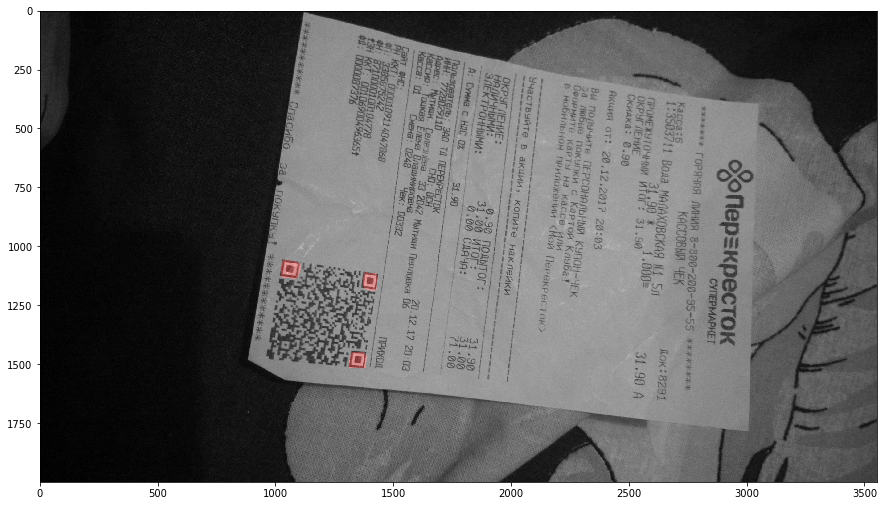

In [154]:
show_image(label2rgb(pred_mask, image, bg_label=0), figsize=(15, 15))

In [158]:
result = {'true_positive': 0,
          'false_positive': 0,
          'false_negative': 0}
for image_path, mask_path in tqdm(zip(test_image_paths, test_mask_paths), total=len(test_image_paths)):
    image = cv2.imread(image_path)
    gt_mask = cv2.imread(mask_path, 2)
    gt_contours = GTPostProcessing.get_contours(gt_mask)
    assert len(gt_contours) == 3
    pred_contours = make_prediction(image, model, PostProcessing, valid_transforms, 0.5, 'contours')
    statistics = get_detection_statistics(pred_contours, gt_contours, 0.5, check_input=True,
                                          input_type='contour')
    result['true_positive'] += statistics['true_positive']
    result['false_positive'] += statistics['false_positive']
    result['false_negative'] += statistics['false_negative']

final_metrics = calculate_detection_metrics(**result)

In [108]:
print('Test')
print('precision:', final_metrics['precision'])
print('recall:', final_metrics['recall'])
print('f_score:', final_metrics['f_score'])

Test
precision: 1.0
recall: 0.9777777777777777
f_score: 0.9887640448938264


__Conclusion__:

For simple patterns detection on a check, it is enough to use a simple segmentation model (only 2M parameters). It is easy to see from the examples, the masks turned out to be somewhat rude.
The model can be improved by simply increasing the input resolution or by complicating the model.

In [17]:
test_paths = glob('./data/test_images/*')
print(len(test_paths))

150


In [21]:
test_paths[0].split('/')[-1]

'0001.jpg'

In [35]:
os.mkdir('./data/predictions/')
for path in tqdm(test_paths):
    image = cv2.imread(path)
    pred_mask = make_prediction(image, model, PostProcessing, valid_transforms, 0.5, 'mask')
    image_over_mask = label2rgb(pred_mask, image, bg_label=0)
    file_name = path.split('/')[-1]
    cv2.imwrite('./data/predictions/' + file_name, (image_over_mask * 255).astype(np.uint8))

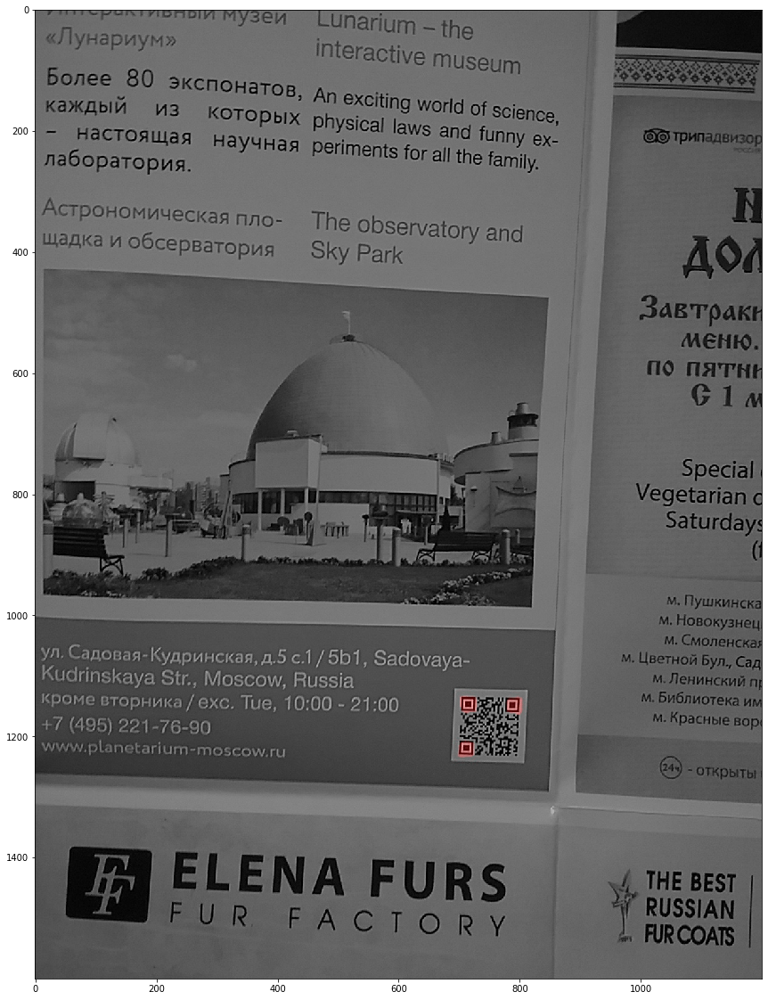

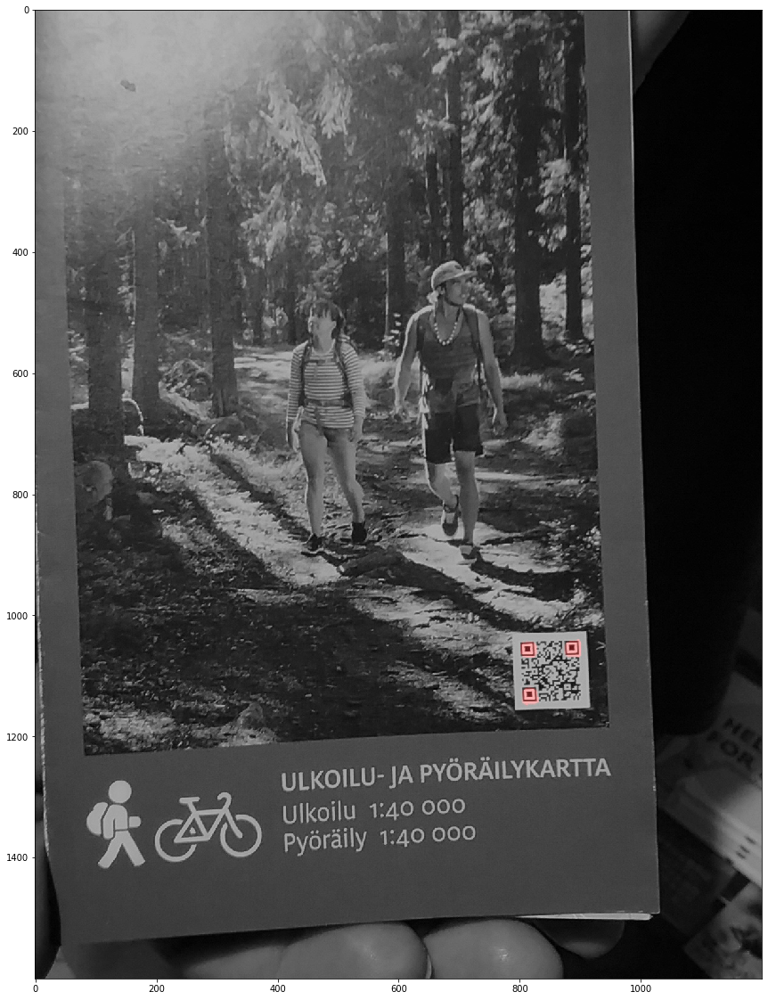

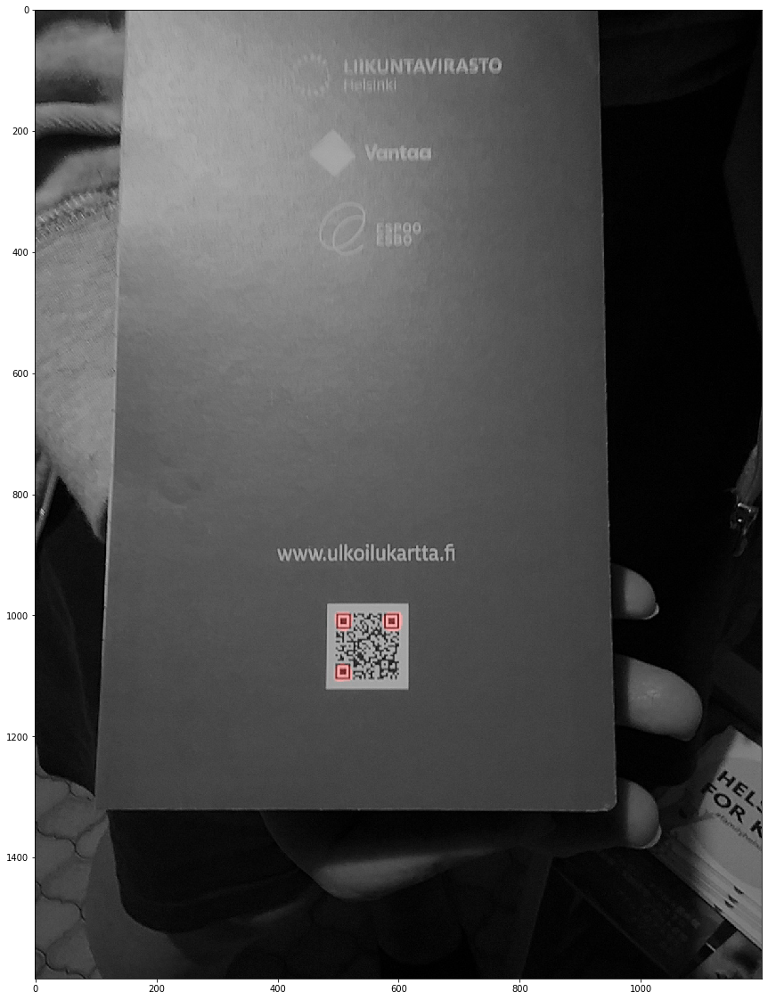

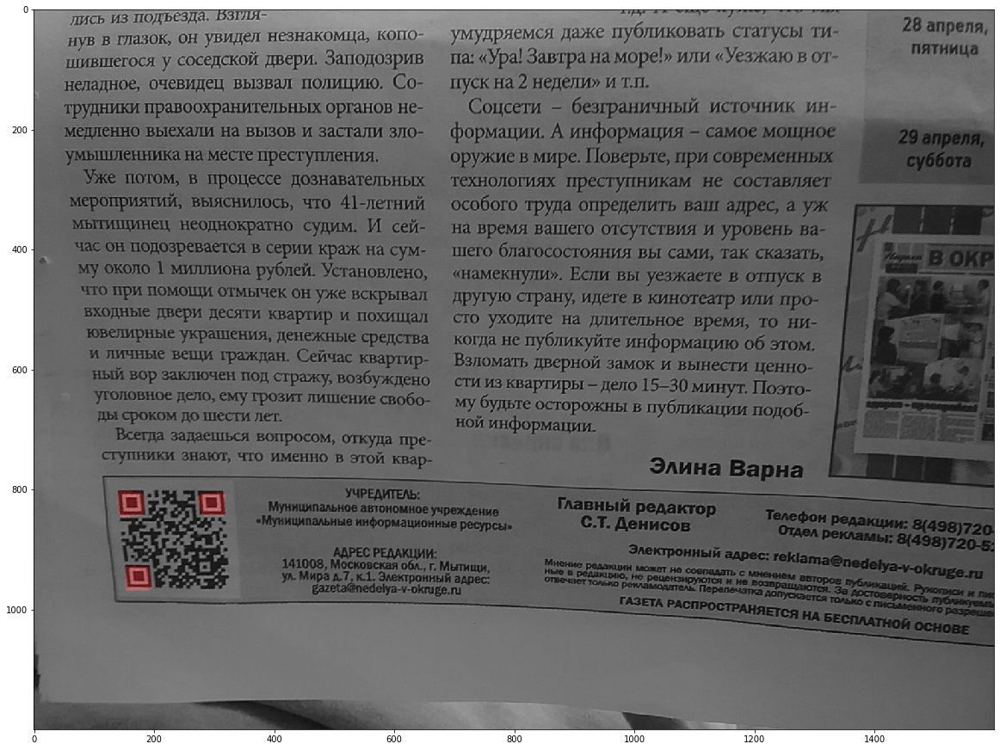

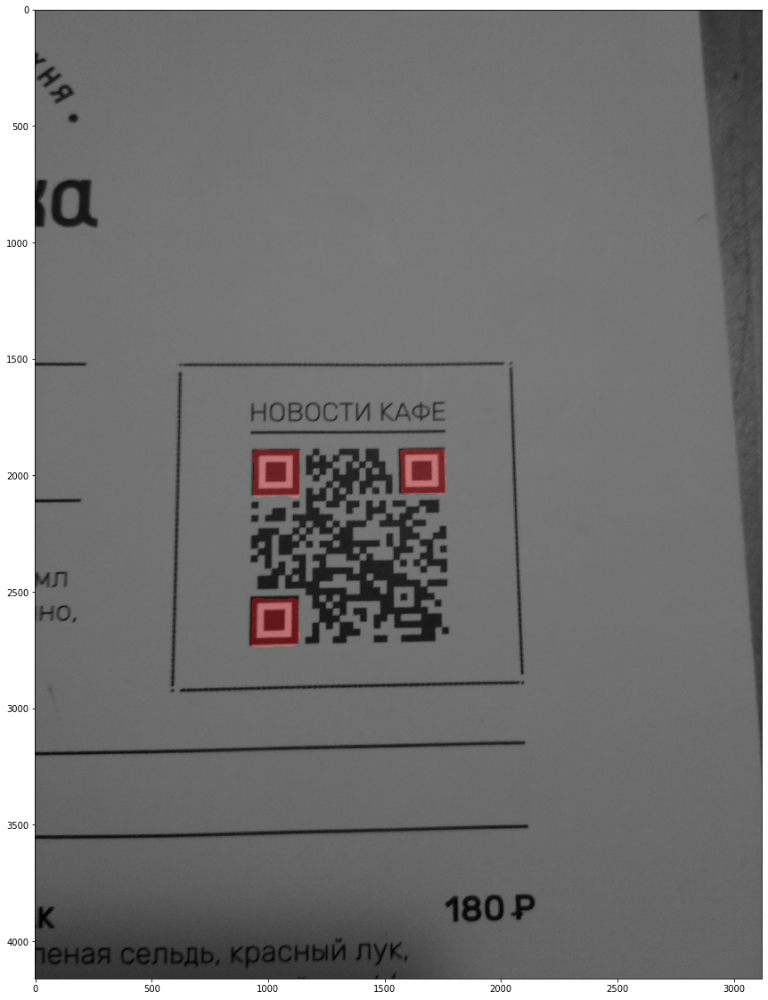

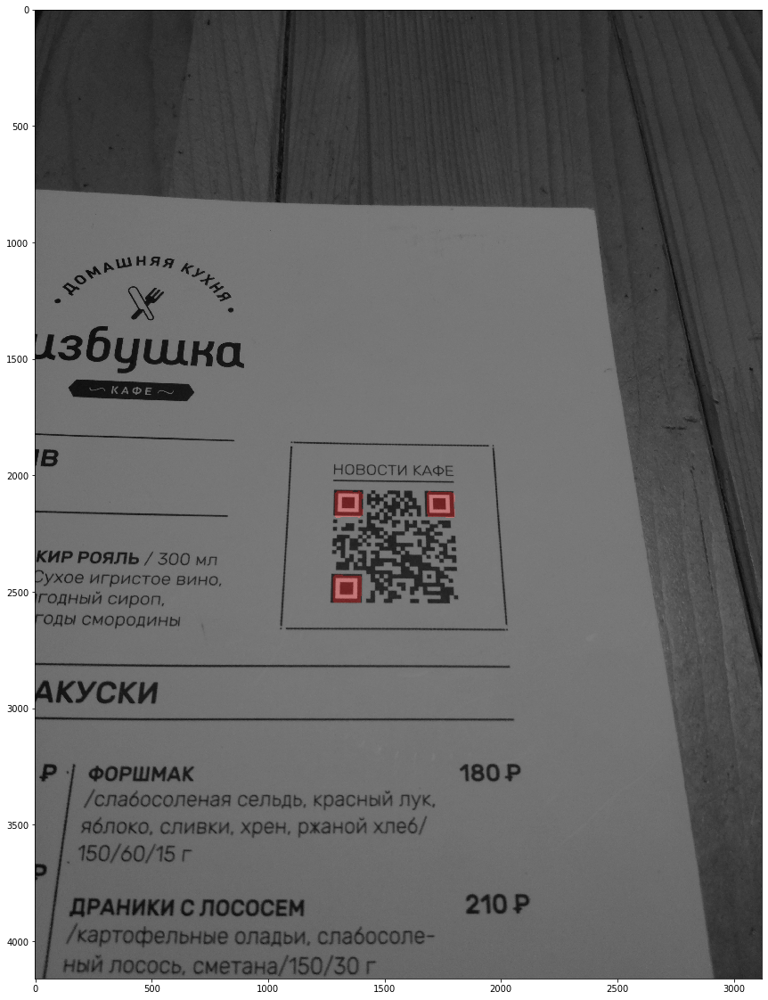

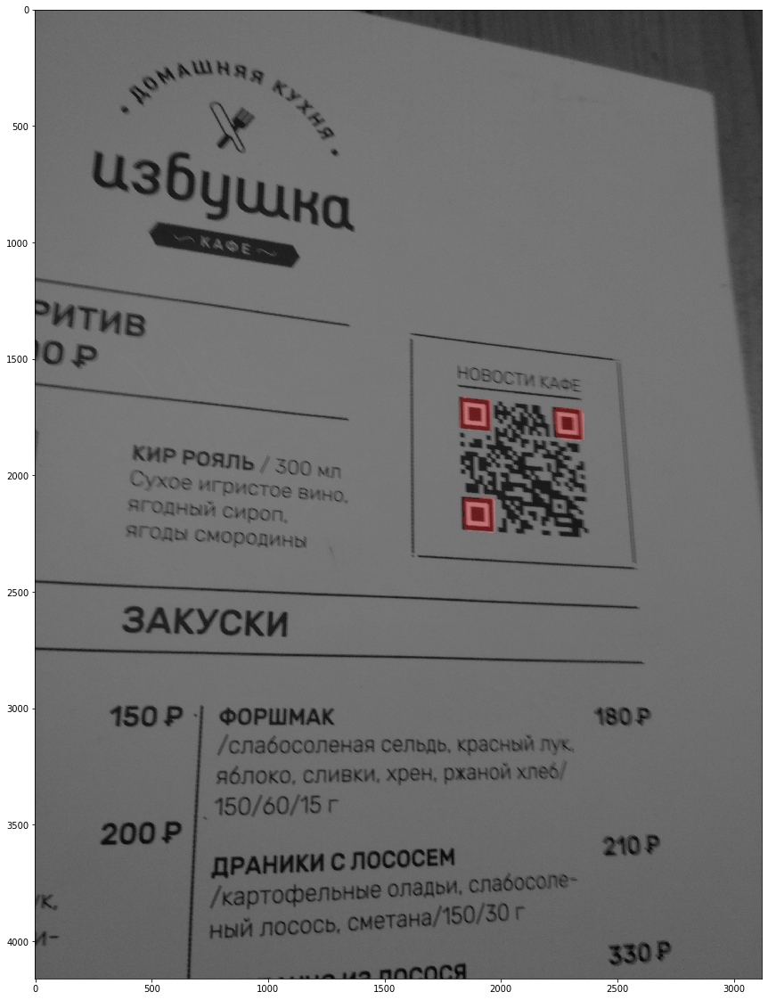

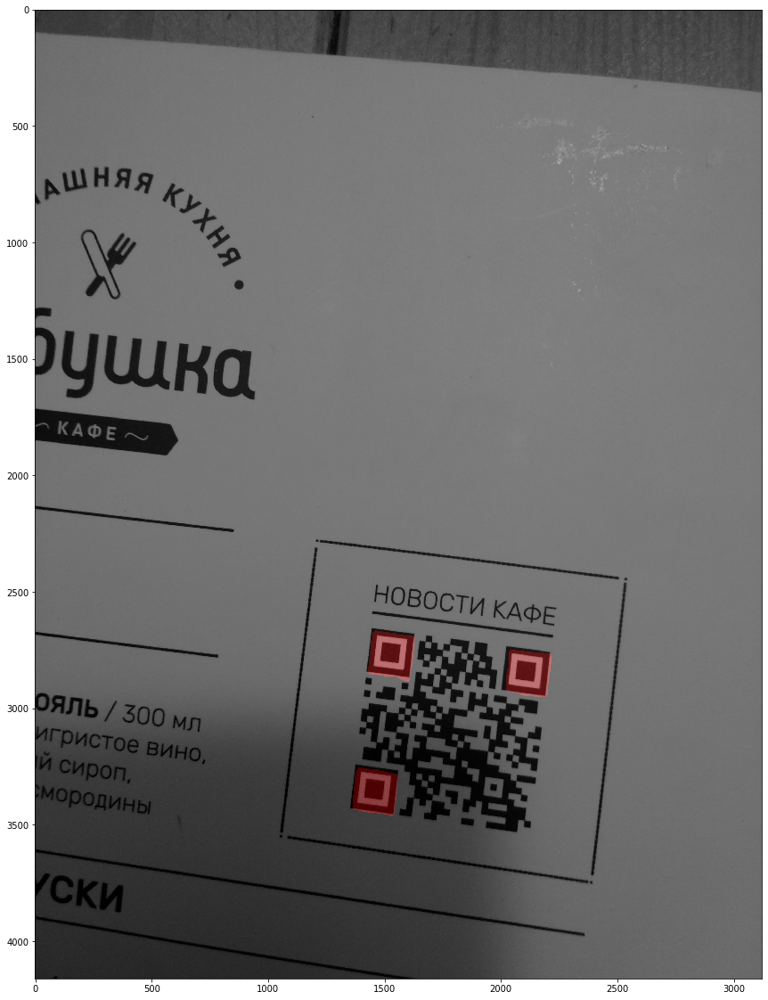

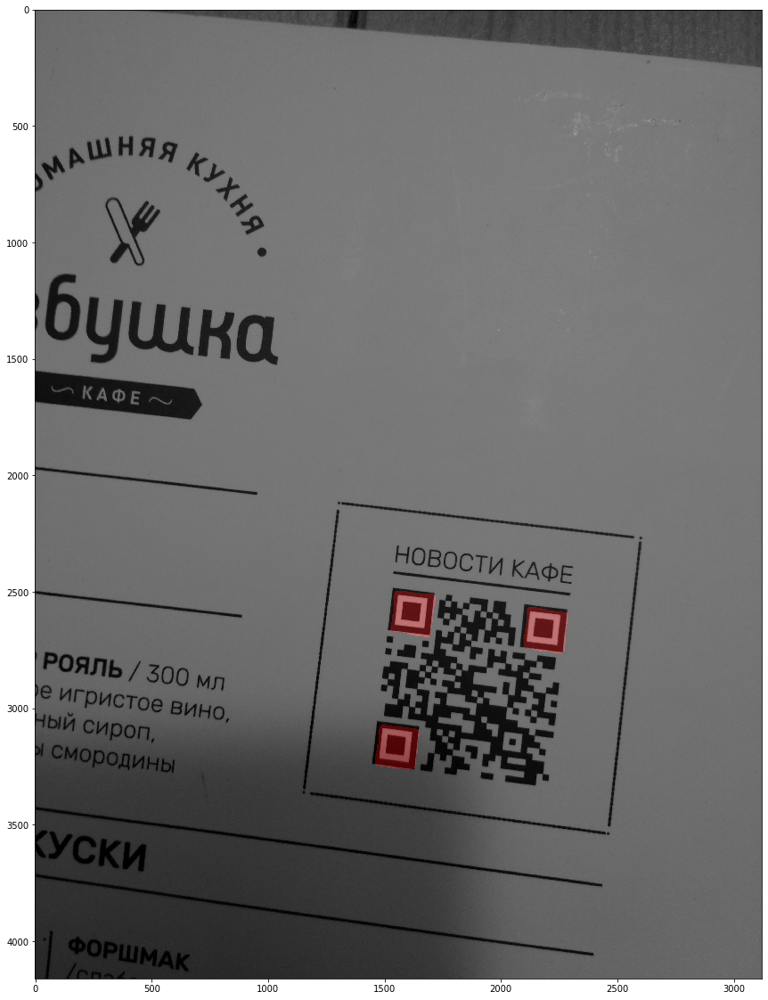

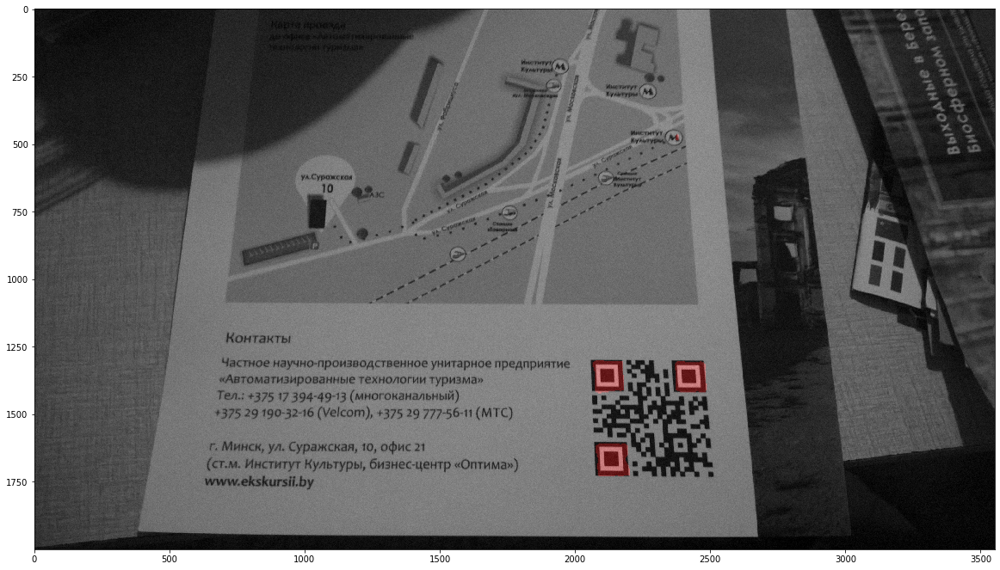

In [49]:
predictions = glob('./data/predictions/*')
for pred in predictions[0:10]:
    image = cv2.imread(pred)
    show_image(image)

### test-time augmentations

In [38]:
import ttach as tta
tta_model = tta.SegmentationTTAWrapper(model, tta.aliases.d4_transform(), merge_mode="min")

In [39]:
os.mkdir('./data/tta_predictions/')
for path in tqdm(test_paths):
    image = cv2.imread(path)
    pred_mask = make_prediction(image, tta_model, PostProcessing, valid_transforms, 0.5, 'mask')
    image_over_mask = label2rgb(pred_mask, image, bg_label=0)
    file_name = path.split('/')[-1]
    cv2.imwrite('./data/tta_predictions/' + file_name, (image_over_mask * 255).astype(np.uint8))

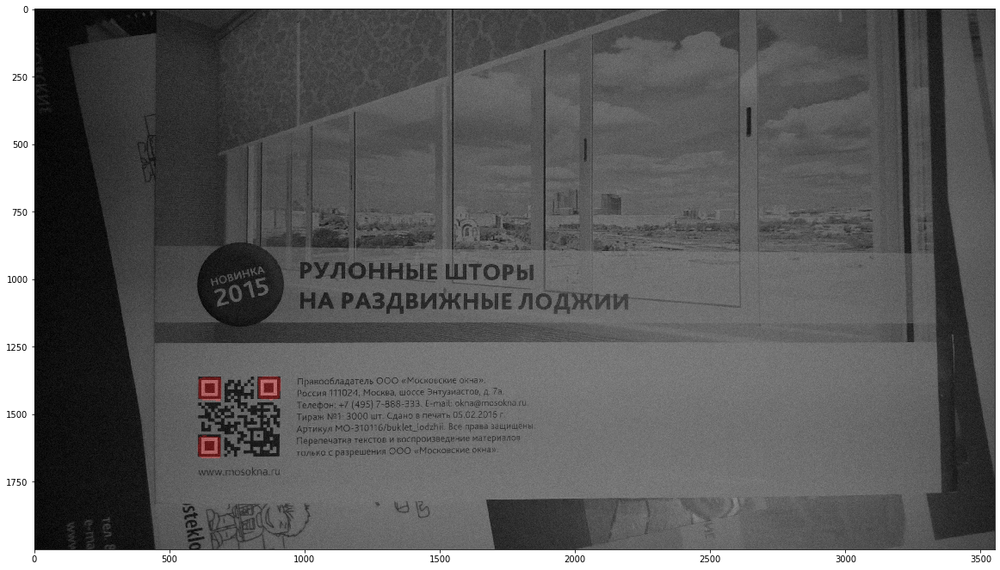

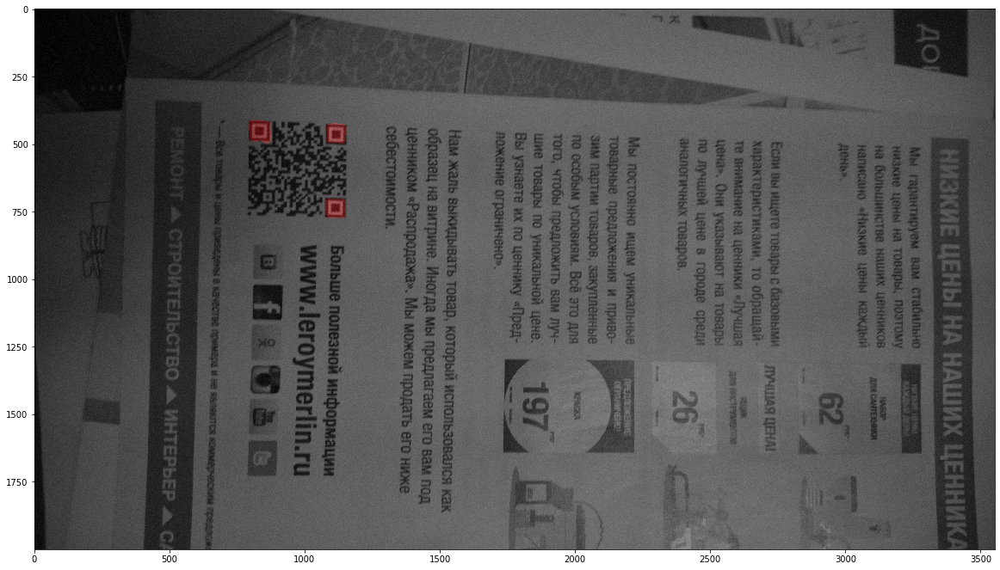

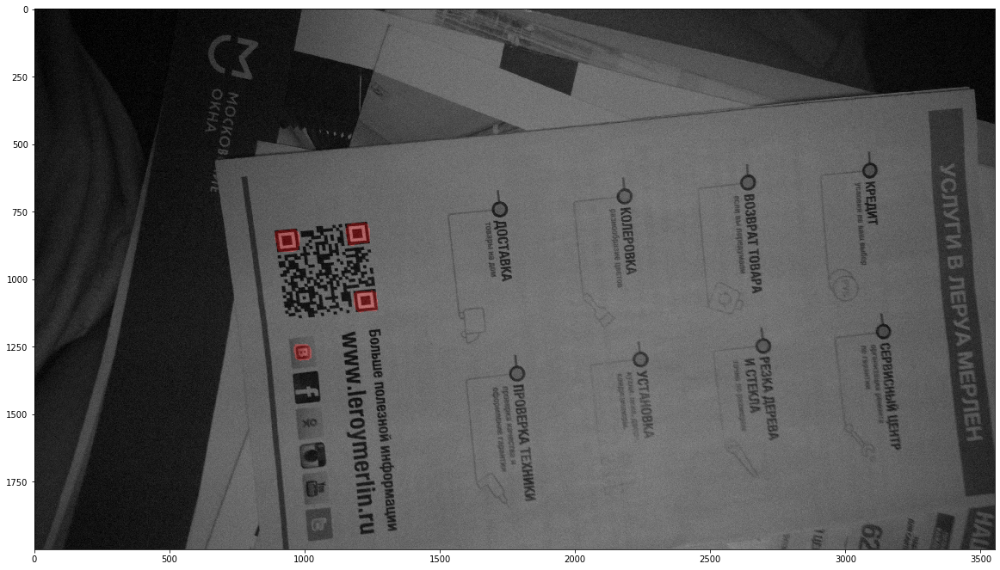

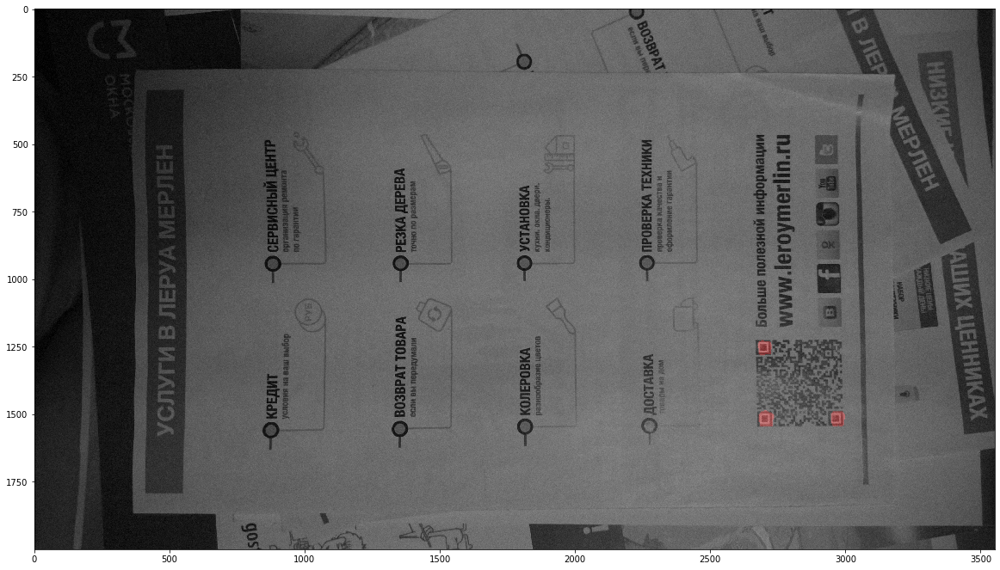

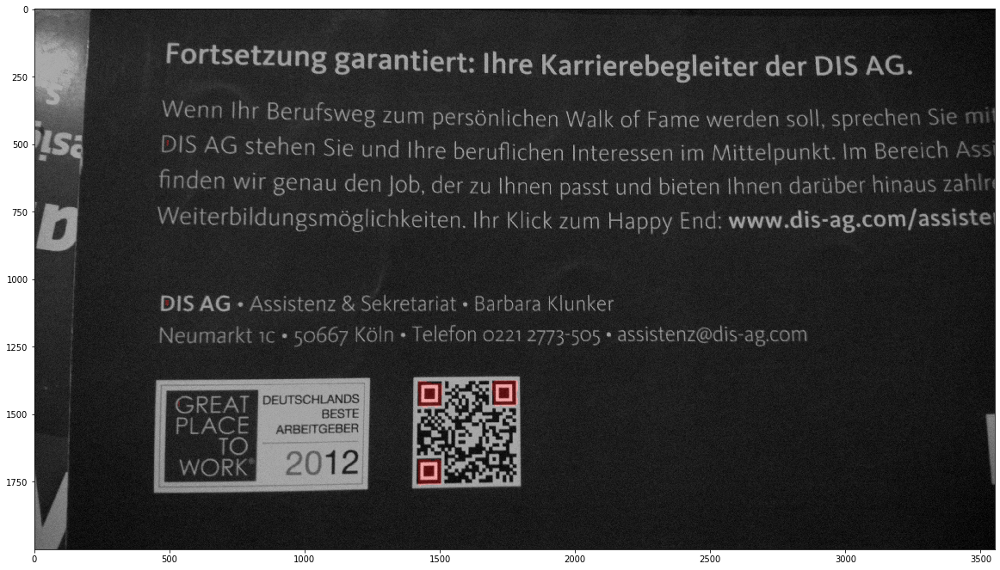

In [48]:
tta_predictions = glob('./data/predictions/*')
for pred in tta_predictions[15:20]:
    image = cv2.imread(pred)
    show_image(image)